# Project notebook "Gravitational Waves Data analysis" 2026

Use this notebook to analyse a gravitational-wave event from the fourth observing run. You will perform a matched filtering analysis and a basic parameter estimation, and discuss your results in a short report.

Because each event has unique characteristics, you are expected to include relevant background information about your chosen event and clearly explain what makes it interesting. The focus of your analysis may therefore differ depending on the event you select.

In your report, discuss any challenges encountered during the analysis and reflect on your results, providing clear and well-motivated interpretations of your observations.

The report is meant to be **short (max. 2 pages of text)** and will only include your figures and analysis. The notebook itself is **not** to be included in the project. The intuitive questions found in the notebook, can be used as a guidance towards your understand. It is not mandatory to answer all of them in your report! Although some might be more important, dependent on the source event.

The final report must be submitted as a **PDF via Canvas**. We recommend using LaTeX for formatting, but this is not required.

In [1]:
# We first need to install a few code packages. (It is advised to always create a new environment!)
#!pip install gwpy pycbc tensorflow scikit-image matplotlib numpy lalsuite bilby dynesty

from IPython.display import Math, HTML

In [3]:
# Before we begin, we import the necessary Python packages. We also suppress lower-level log messages to keep the output clean and focused.
import bilby
import numpy as np
from tqdm import tqdm
from matplotlib import pyplot as plt
from gwpy.timeseries import TimeSeries
from gwosc.datasets import event_gps
from bilby.core.prior import Uniform, PowerLaw
from bilby.gw.conversion import convert_to_lal_binary_black_hole_parameters, generate_all_bbh_parameters

bilby.core.utils.log.setup_logger(log_level="WARNING")

In [4]:
plt.style.use('dark_background')
plt.rcParams['axes.facecolor'] = 'midnightblue'
plt.rcParams['figure.facecolor'] = "#060552"
plt.rcParams['axes.grid'] = 'True'
plt.rcParams['grid.color'] = 'steelblue'
plt.rcParams['grid.linewidth'] = 0.6
plt.rcParams['grid.alpha'] = 0.8
plt.rcParams['axes.edgecolor'] = 'white'
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['legend.facecolor'] = "#060552"

### Apply a matched-filter search to LIGO data from the fourth observing run (O4) of LIGO-Virgo-KAGRA

Choose one of the following black hole merger events from O4:
*   **GW230814_230901** (https://arxiv.org/abs/2509.07348, note that this event has only been detected by LIGO Livingston, i.e., the L1 interferometer)
*   **GW231028_153006** (https://arxiv.org/abs/2508.18082)
*   **GW231123_135430** (https://arxiv.org/abs/2507.08219)
*   **GW250114_082203** (https://arxiv.org/abs/2509.08054)

(Any other event reported in the Gravitational Wave Transient Catalog 4.0 https://arxiv.org/abs/2508.18082 could also be chosen in principle, but for lower-mass systems - which have a longer duration in the detector band - a longer stretch of data around the event GPS time would have to be analysed.)

Use the event ID to fetch LIGO data and modify the example given in Sec. 2 of *'ExampleNotebook_DataAnalysis.ipynb'* for a matched filter analysis of real data accordingly.

Construct a sparse template bank (suitable for the chirp mass reported for your event) and identify the best-fit template in the bank.

Explore possible biases introduced into the analysis when using an insufficiently complex template bank in matched filtering (e.g., trying to detect a spin-precessing binary black hole merger with a template bank for GR signals from non-spinning systems).

**Note:** It might also be interesting to try and apply a 2D template bank to your event, in chirp mass $\mathcal{M}_{c}$ and the effective (dominant) spin in the direction of orbital angular momentum: $\chi_{\rm eff} = (m_1*\chi_1^z+m_2*\chi_2^z)/(m_1+m_2)$



In [4]:
"""Select a recently reported event from the fourth observing un of LIGO-Virgo-KAGRA"""
"""Using a template with the source properties reported for this event in the literature linked above, try to detect the event in the detector data."""

# Select an event from the list above
# Look up its source parameters in the published literature linked above
# Following the procedure above, fetch the data, generate a template with the true parameters of the event and apply it in matched filtering
### YOUR CODE GOES HERE

# Similarly to the first part of this notebook: build a template bank consisting of 1000 linearly spaced templates around the reported chirp mass of your event
# Apply each template in matched filtering, plot the maximum detection statistics for the different chirp masses and identify the chirp mass of the best-fit template.
# You can use the zero-spin case.
### EXTEND YOUR CODE TO ITERATE OVER TEMPLATES

# From the results in the published literature linked above, what do you know about the physics of the binary merger that you're analysing?
# Choose a template that is insufficiently complex & (e.g., non-spinning templates for an event with non-neglible spins, aligned-spin templates for a spin-precessing event, templates in the wrong mass range, ...)
# Repeat your template bank analysis (e.g., for the same values of chirp mass but now with zero spins). How does the chirp mass of the best-fit template change?
### YOUR CODE GOES HERE


'Using a template with the source properties reported for this event in the literature linked above, try to detect the event in the detector data.'

In [9]:
# first initializing the interferometers
H1 = bilby.gw.detector.get_empty_interferometer("H1")
L1 = bilby.gw.detector.get_empty_interferometer("L1")
# get the gps time and other data from the event, my event is GW231123
gps = event_gps('GW231123_135430')
print("The GPS time of GW231123_135430:", gps)

The GPS time of GW231123_135430: 1384782888.7


In [10]:
TimeSeries.fetch_open_data?

Signature:
TimeSeries.fetch_open_data(
    ifo: 'str',
    start: 'SupportsToGps',
    end: 'SupportsToGps',
    sample_rate: 'float' = 4096,
    version: 'int | None' = None,
    format: "Literal['gwf', 'hdf5']" = 'hdf5',
    host: 'str' = 'https://gwosc.org',
    *,
    verbose: 'bool | None' = None,
    cache: 'bool | None' = None,
    **kwargs,
) -> 'Self'
Docstring:
Fetch open-access data from GWOSC.

This is just a shim around ``TimeSeries.get(..., source='gwosc')``.

Parameters
----------
ifo : `str`
    The two-character prefix of the IFO in which you are interested,
    e.g. `'L1'`.

start : `~gwpy.time.LIGOTimeGPS`, `float`, `str`, optional
    GPS start time of required data, defaults to start of data found;
    any input parseable by `~gwpy.time.to_gps` is fine.

end : `~gwpy.time.LIGOTimeGPS`, `float`, `str`, optional
    GPS end time of required data, defaults to end of data found;
    any input parseable by `~gwpy.time.to_gps` is fine.

sample_rate : `float`, optional,
 

In [175]:
# Load the data you want to analyse
# First, we define the times we want to analyse relative to the time of the event
# Real LIGO data has a higher sampling frequency than the one we previously used, so we need to update our settings accordingly.

# Take 2 seconds before and after the trigger time, to have a good chunk of data to analyse.
# Use gwpy to fetch the open data.
# fetching open data: https://gwpy.github.io/docs/2.1.1/timeseries/opendata/

sampling_frequency = 4096 # (s)
duration = 4.0

analysis_start = int(gps) - 2
analysis_end = int(gps) + 2

In [176]:
# Use gwpy to fetch the open data for the Hanford and Livingston detectors.
# Set cache=True for faster loading if you run the notebook multiple times.
H1_analysis_data = TimeSeries.fetch_open_data('H1', analysis_start, analysis_end, 
                                              sample_rate = sampling_frequency, cache=True)
L1_analysis_data = TimeSeries.fetch_open_data('L1', analysis_start, analysis_end, 
                                              sample_rate = sampling_frequency, cache=True)

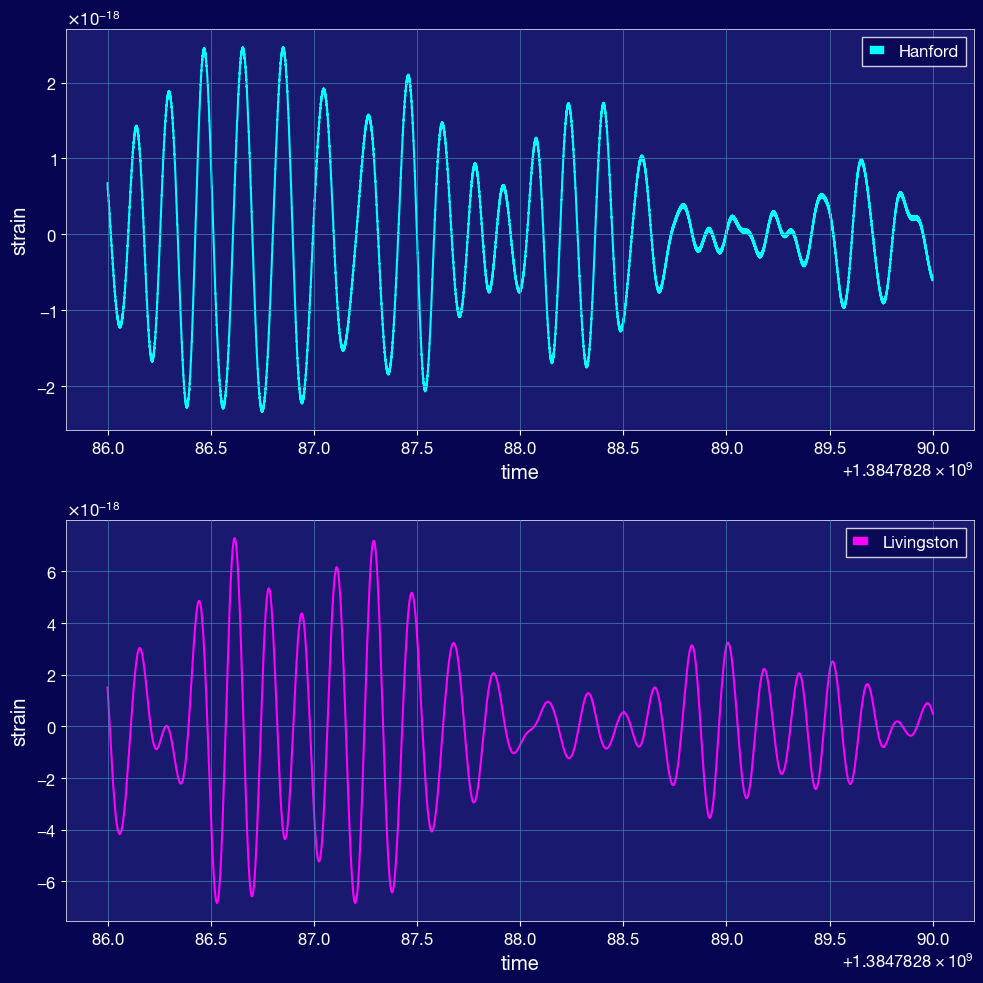

In [177]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10))
ax[0].plot(H1_analysis_data, label = 'Hanford', color = 'cyan')
ax[0].set_xlabel('time')
ax[0].set_ylabel('strain')
ax[0].legend()
ax[1].plot(L1_analysis_data, label = 'Livingston', color = 'magenta')
ax[1].set_xlabel('time')
ax[1].set_ylabel('strain')
ax[1].legend()
plt.tight_layout()


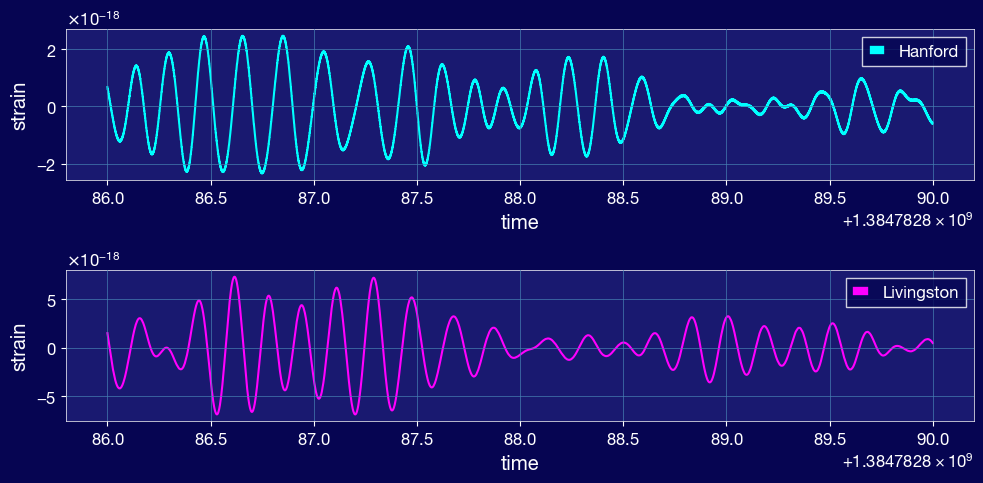

In [178]:
fig, ax = plt.subplots(2, 1, figsize=(10, 5))
ax[0].plot(H1_analysis_data, label = 'Hanford', color = 'cyan')
ax[0].set_xlabel('time')
ax[0].set_ylabel('strain')
ax[0].legend()
ax[1].plot(L1_analysis_data, label = 'Livingston', color = 'magenta')
ax[1].set_xlabel('time')
ax[1].set_ylabel('strain')
ax[1].legend()
plt.tight_layout()

re: chirp mass value
- the waveform is dependent on the chirp mass 
- even if you have different combinations of m1 m2 that give you a different value 
- advantage to keeping mass ratio constant 

In [179]:
# Next, we assign the fetched strain data to our interferometer objects. 
# These objects now contain both the raw data and metadata required for analysis.

# -----
# We now pass the strain data we want to analyse to the interferometer objects
H1.set_strain_data_from_gwpy_timeseries(H1_analysis_data)
L1.set_strain_data_from_gwpy_timeseries(L1_analysis_data)

In [180]:
# Matched-filter searches (and subsequently parameter estimation) require a good model of the noise, 
# which is characterized by the power spectral density (PSD). We fetch a longer segment of data prior to the signal. 
# The prior segment will contain a good estimate of the noise, because it was measured around the same time as the 
# signal (of course assuming there was no other overlapping signal immediately before. This might not be such a sharp 
# assumption for future detectors.).

# After extracting a noise segment, we use gwpy's Welch method to compute the PSD by using the segment information. 
# The PSD is a statistical property of the noise, so we estimate it by averaging over many noisy segments. 
# This step is essential for calculating SNRs (and later likelihoods) accurately.

psd_duration = duration * 32
psd_start_time = analysis_start - psd_duration

H1_psd_data = TimeSeries.fetch_open_data(
    "H1", psd_start_time, psd_start_time + psd_duration, sample_rate=4096, cache=True)

L1_psd_data = TimeSeries.fetch_open_data(
    "L1", psd_start_time, psd_start_time + psd_duration, sample_rate=4096, cache=True)

This step estimates the **Power Spectral Density (PSD)** of the detector noise using the Welch method. Here's what each part does:

- `psd_alpha` — computes the shape parameter for the Tukey window. The `roll_off` is a property of the strain data that defines how sharply the edges of each FFT segment are tapered. A Tukey window is basically a rectangular window with cosine-tapered edges, and `alpha` controls how much of the window is tapered (0 = pure rectangular, 1 = pure Hann).
- `.psd(fftlength=duration, ...)` — splits the long PSD data segment (128 seconds) into chunks of length `duration` (4 seconds), computes the FFT of each chunk, and averages them. This is the Welch method — averaging many short FFTs reduces the variance of the PSD estimate.
- `overlap=0` — no overlap between consecutive chunks.
- `window=("tukey", psd_alpha)` — applies the Tukey window to each chunk before computing the FFT. This is important to avoid **spectral leakage**, where sharp edges at the start/end of each segment bleed power across frequency bins.
- `method="median"` — uses the median rather than the mean when averaging the FFTs across chunks. This makes the PSD estimate more **robust to glitches** — a single loud glitch in one chunk will dominate the mean but barel

In [188]:
# We use gwpy to generate the PSD
psd_alpha = 2.0 * H1.strain_data.roll_off / duration

H1_psd = H1_psd_data.psd(fftlength=duration, overlap=0, window=("tukey", psd_alpha), method="median")
L1_psd = L1_psd_data.psd(fftlength=duration, overlap=0, window=("tukey", psd_alpha), method="median")

In [189]:
# Now that we have the PSD, we store it in our interferometer objects

H1.power_spectral_density = bilby.gw.detector.PowerSpectralDensity(
    frequency_array=H1_psd.frequencies.value, psd_array=H1_psd.value)

L1.power_spectral_density = bilby.gw.detector.PowerSpectralDensity(
    frequency_array=H1_psd.frequencies.value, psd_array=L1_psd.value)

In [190]:
# # We now pass the strain data we want to analyse to the interferometer objects
# H1.set_strain_data_from_gwpy_timeseries(H1_analysis_data)
# L1.set_strain_data_from_gwpy_timeseries(L1_analysis_data)

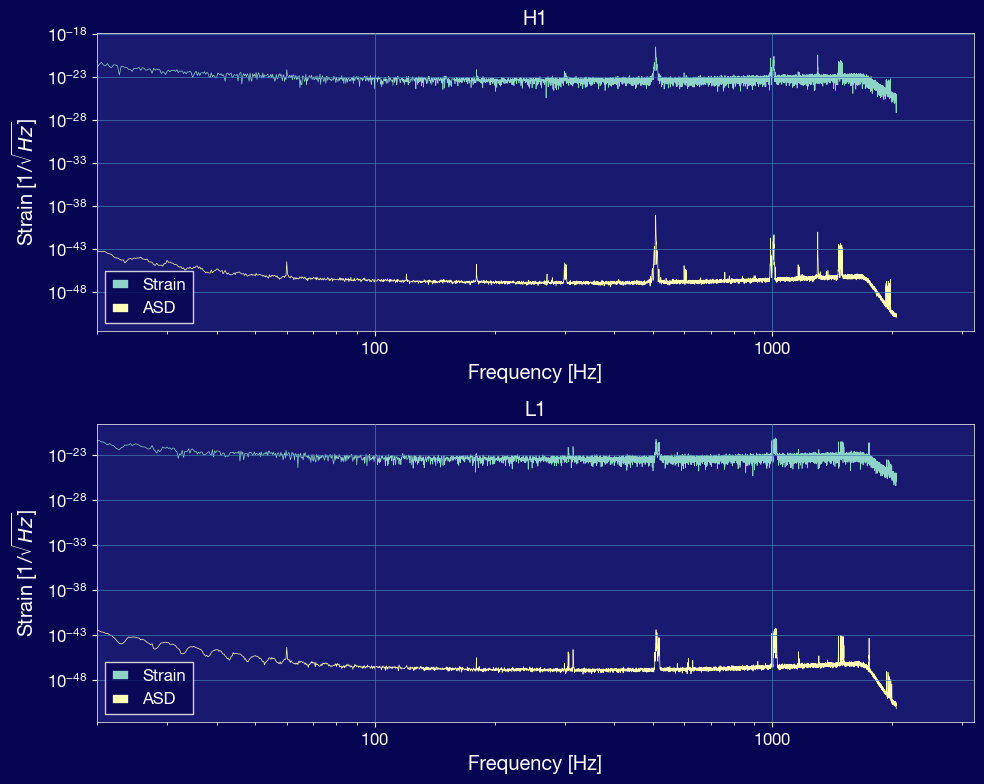

In [191]:
# Let's visualise the strain data and the amplitude spectral density (ASD) = \sqrt(PSD)

fig, axes = plt.subplots(2, 1, figsize=(10, 8))

for ax, ifo, label in zip(axes, [H1, L1], ['H1', 'L1']):
    idxs = ifo.strain_data.frequency_mask
    psd_idxs = ifo.power_spectral_density.frequency_array > 0  # use all PSD frequencies
    ax.loglog(ifo.strain_data.frequency_array[idxs],
              np.abs(ifo.strain_data.frequency_domain_strain[idxs]), lw = 0.5, label='Strain')
    ax.loglog(ifo.power_spectral_density.frequency_array[psd_idxs],
              (ifo.power_spectral_density.asd_array[psd_idxs])**2, lw = 0.5, label='ASD')
    ax.set_xlabel("Frequency [Hz]")
    ax.set_ylabel("Strain [1/$\\sqrt{Hz}$]")
    ax.set_title(label)
    ax.set_xlim(20)
    ax.legend()

plt.tight_layout()
plt.show()

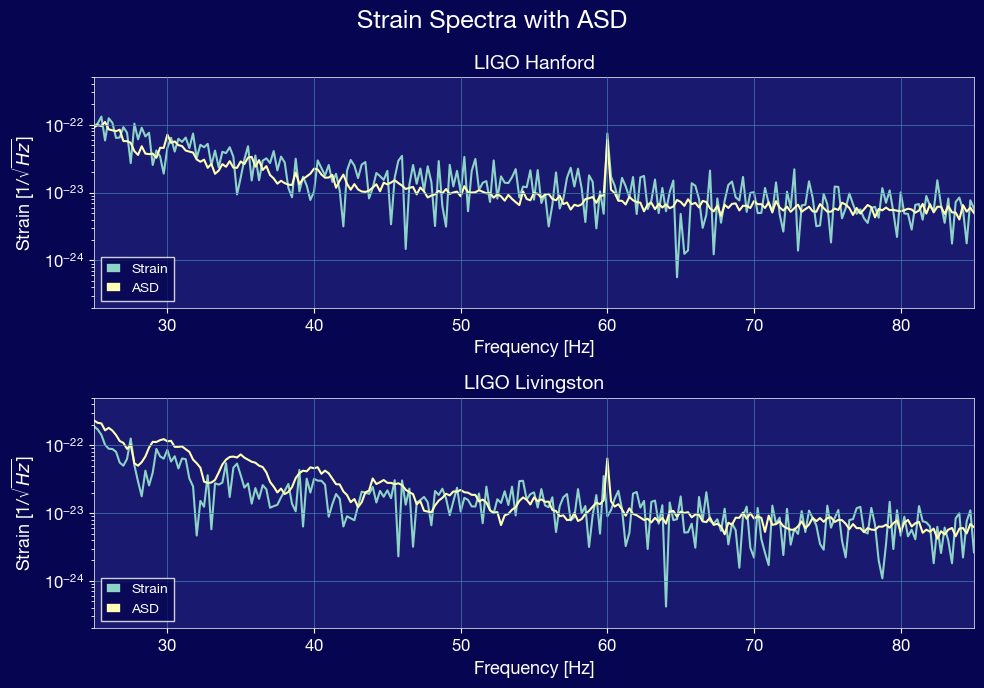

<Figure size 640x480 with 0 Axes>

In [449]:
# Let's visualise the strain data and the amplitude spectral density (ASD) = \sqrt(PSD)
dpi=300
fig, axes = plt.subplots(2, 1, figsize=(10, 7))

for ax, ifo, label in zip(axes, [H1, L1], ['LIGO Hanford', 'LIGO Livingston']):
    idxs = ifo.strain_data.frequency_mask
    psd_idxs = ifo.power_spectral_density.frequency_array > 0  # use all PSD frequencies
    ax.semilogy(ifo.strain_data.frequency_array[idxs],
              np.abs(ifo.strain_data.frequency_domain_strain[idxs]), lw = 1.5, label='Strain')
    ax.semilogy(ifo.power_spectral_density.frequency_array[psd_idxs],
              ifo.power_spectral_density.asd_array[psd_idxs], lw = 1.5, label='ASD')
    ax.set_xlabel("Frequency [Hz]", fontsize=13)
    ax.set_ylabel("Strain [1/$\\sqrt{Hz}$]", fontsize = 13)
    ax.set_title(label, fontsize=14)
    ax.set_ylim(2e-25, 5e-22)
    ax.set_xlim(25, 85)
    ax.legend(fontsize=10, loc='lower left')


plt.suptitle('Strain Spectra with ASD', fontsize=18, x = 0.5)
plt.tight_layout()
plt.show()

plt.savefig('/Users/leayamashiro/AnA_MSc/Period_5_2026/GWs/GWs_projects/Data_Analysis/figures_for_paper/ASDs.png')

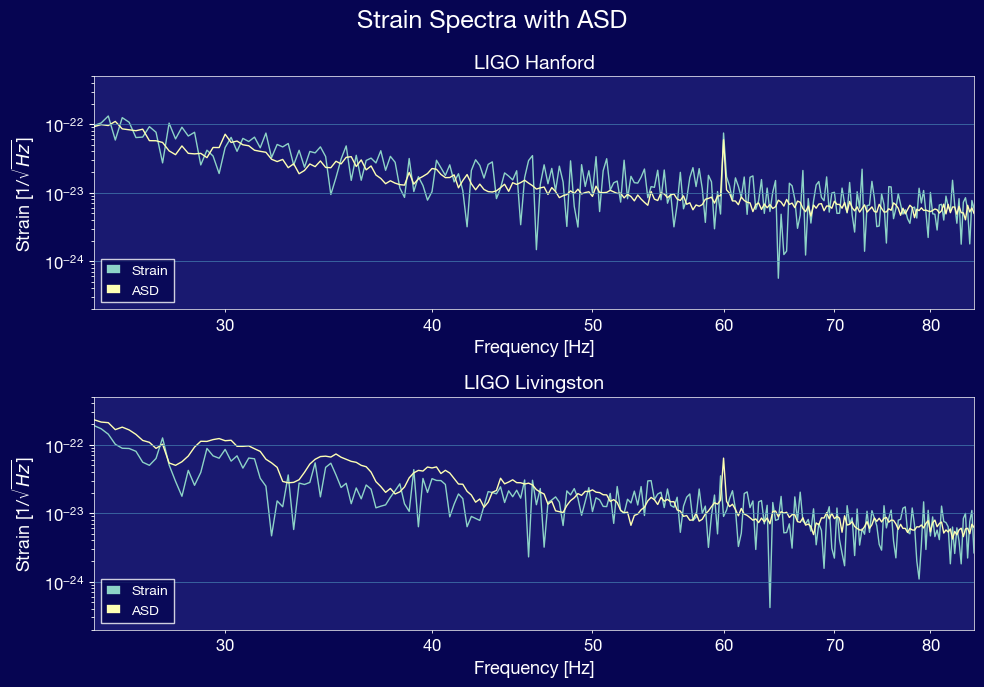

<Figure size 640x480 with 0 Axes>

In [444]:
# Let's visualise the strain data and the amplitude spectral density (ASD) = \sqrt(PSD)
dpi=300
fig, axes = plt.subplots(2, 1, figsize=(10, 7))

for ax, ifo, label in zip(axes, [H1, L1], ['LIGO Hanford', 'LIGO Livingston']):
    idxs = ifo.strain_data.frequency_mask
    psd_idxs = ifo.power_spectral_density.frequency_array > 0  # use all PSD frequencies
    ax.loglog(ifo.strain_data.frequency_array[idxs],
              np.abs(ifo.strain_data.frequency_domain_strain[idxs]), lw = 1, label='Strain')
    ax.loglog(ifo.power_spectral_density.frequency_array[psd_idxs],
              ifo.power_spectral_density.asd_array[psd_idxs], lw = 1, label='ASD')
    ax.set_xlabel("Frequency [Hz]", fontsize=13)
    ax.set_ylabel("Strain [1/$\\sqrt{Hz}$]", fontsize = 13)
    ax.set_title(label, fontsize=14)
    ax.set_ylim(2e-25, 5e-22)
    ax.set_xlim(25, 85)
    ax.legend(fontsize=10, loc='lower left')


plt.suptitle('Strain Spectra with ASD', fontsize=18, x = 0.5)
plt.tight_layout()
plt.show()

plt.savefig('/Users/leayamashiro/AnA_MSc/Period_5_2026/GWs/GWs_projects/Data_Analysis/figures_for_paper/ASDs.png')

#### Generating a Template

Going to do it based on the first column of this table: 

![alt text](param_table.png "Title")

In [21]:
# effective precessing spin -- angles also maybe off 

In [193]:
# Real LIGO data has a higher sampling frequency than the one we previously used
f_min = 20. # in Hz
sampling_frequency = 4096 # (s)
duration = 4 # duration (s)
start_time = 0 # arbitrary

# Create a new time array & re-initialize the waveform_generator with the increased sampling_frequency
time_frequency_series_new = bilby.core.series.CoupledTimeAndFrequencySeries(duration=duration,
                                                                        sampling_frequency=sampling_frequency,
                                                                        start_time=start_time)
time_array_new = time_frequency_series_new.time_array


approximant = "IMRPhenomXP" # computationally efficient inspiral merger ringdown model that includes effects of spin precession and modeled directly in freq domain
waveform_arguments = dict(
    reference_frequency=10.0,
    minimum_frequency=f_min,
    waveform_approximant=approximant # so this becomes IMRPhenomXP
)

waveform_generator_2 = bilby.gw.WaveformGenerator(
    duration=duration,
    sampling_frequency=sampling_frequency,
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    parameter_conversion=bilby.gw.conversion.convert_to_lal_binary_black_hole_parameters,
    waveform_arguments=waveform_arguments,
)

# Empty H1 detector object (to project template onto H1)
H1_proj = bilby.gw.detector.get_empty_interferometer("H1")

# Detector data and PSD from real event
H1_proj.set_strain_data_from_gwpy_timeseries(H1_analysis_data)
data_H1 = H1_proj.strain_data.frequency_domain_strain
psd_H1 = bilby.gw.detector.PowerSpectralDensity(
    frequency_array=H1_psd.frequencies.value, psd_array=H1_psd.value)


# Empty H1 detector object (to project template onto H1)
L1_proj = bilby.gw.detector.get_empty_interferometer("L1")

# Detector data and PSD from real event
L1_proj.set_strain_data_from_gwpy_timeseries(L1_analysis_data)
data_L1 = L1_proj.strain_data.frequency_domain_strain
psd_L1 = bilby.gw.detector.PowerSpectralDensity(
    frequency_array=L1_psd.frequencies.value, psd_array=L1_psd.value)

# # Generate a template (using the published parameters of the real event) [simplification used here: zero spins and other parameters]
# template_parameters = dict(
#     mass_1=149.0,
#     mass_2=92.0,
#     a_1=0.79,
#     a_2=0.67,
#     tilt_1=0.0,
#     tilt_2=0.0,
#     phi_12=0,
#     phi_jl=0,
#     luminosity_distance=900.0,
#     theta_jn=1.6,
#     psi=0,
#     phase=0,
#     geocent_time=0,
#     ra=0,
#     dec=0,
# )

# # basically need to create a giant bank of these, where only the 
# # masses are being varied, centered around the chirp mass
# # Anna: finds chirp mass with the "true values" and then does 
# # np.linspace() 

# # she did 0.6x to 2x 

# # create array, q constant



# # Multiply template by H1 antenna reponse pattern function
# H1_proj.set_strain_data_from_zero_noise(
#     sampling_frequency=sampling_frequency,
#     duration=duration,
#     start_time=0)
# H1_proj.inject_signal(
#     waveform_generator=waveform_generator_2, parameters=template_parameters)
# template_H1 = H1_proj.strain_data.frequency_domain_strain

# #normalize template
# template_H1 /= np.abs(bilby.gw.utils.noise_weighted_inner_product(template_H1, template_H1, psd_H1.psd_array, duration = duration))**0.5

#### I want to do a comparison of all of the models to see which has max SNR 

In [194]:

# Matched filtering of H1 data from real event
# Perform the matched filtering between actual data and the template using the efficient method we implemented above (or using bilby's built-in matched filtering function).
### YOUR CODE HERE

# Plot the time-domain matched filter output and indicate the maximum detection statistic on the plot.
### YOUR CODE HERE

In [195]:
# match_H1 = 2 * np.conj(data_H1) * template_H1 / psd_H1.psd_array
# time_domain_match_H1 = bilby.utils.infft(match_H1, sampling_frequency)

# max_snr = np.max(np.abs(time_domain_match_H1))
# max_snr_time = time_array_new[np.argmax(np.abs(time_domain_match_H1))]

# fig, ax = plt.subplots(figsize=(10, 4))
# ax.plot(time_array_new, np.abs(time_domain_match_H1))
# ax.axvline(max_snr_time, color='r', linestyle='--', label=f'Max SNR = {max_snr:.2f}')
# ax.set_xlabel('Time [s]')
# ax.set_ylabel(r'$\rho$')
# ax.set_title('Matched filter output - H1 (GW231123)')
# ax.legend()
# plt.tight_layout()
# plt.show()

# print(f"Maximum SNR: {max_snr:.2f} at t = {max_snr_time:.4f} s")

In [219]:
def perform_matched_filter_H1(approximant, m1, m2, a1, a2, L_distance, thetajn, 
                              reference_frequency = 10):
        # Real LIGO data has a higher sampling frequency than the one we previously used
    f_min = 20. # in Hz
    sampling_frequency = 4096 # (s)
    duration = 4 # duration (s)
    start_time = 0 # arbitrary

    # Create a new time array & re-initialize the waveform_generator with the increased sampling_frequency
    time_frequency_series_new = bilby.core.series.CoupledTimeAndFrequencySeries(duration=duration,
                                                                            sampling_frequency=sampling_frequency,
                                                                            start_time=start_time)
    time_array_new = time_frequency_series_new.time_array


    #approximants = "IMRPhenomXP", "IMRPhenomXO4a", "IMRPhenomTPHM", "NRSur7dq4", "SEOBNRv5PHM"
    waveform_arguments = dict(
        reference_frequency=reference_frequency,
        minimum_frequency=f_min,
        waveform_approximant=approximant # so this becomes IMRPhenomXP
        )

    waveform_generator_2 = bilby.gw.WaveformGenerator(
        duration=duration,
        sampling_frequency=sampling_frequency,
        frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
        parameter_conversion=bilby.gw.conversion.convert_to_lal_binary_black_hole_parameters,
        waveform_arguments=waveform_arguments,
    )

    # Empty H1 detector object (to project template onto H1)
    H1_proj = bilby.gw.detector.get_empty_interferometer("H1")

    # Detector data and PSD from real event
    H1_proj.set_strain_data_from_gwpy_timeseries(H1_analysis_data)
    data_H1 = H1_proj.strain_data.frequency_domain_strain
    psd_H1 = bilby.gw.detector.PowerSpectralDensity(
        frequency_array=H1_psd.frequencies.value, psd_array=H1_psd.value)

    # Generate a template (using the published parameters of the real event) [simplification used here: zero spins and other parameters]
    template_parameters = dict(
        mass_1=m1,
        mass_2=m2,
        a_1=a1,
        a_2=a2,
        tilt_1=0.0,
        tilt_2=0.0,
        phi_12=0,
        phi_jl=0,
        luminosity_distance=L_distance,
        theta_jn=thetajn,
        psi=0,
        phase=0,
        geocent_time=0,
        ra=0,
        dec=0,
    )
    # Multiply template by H1 antenna reponse pattern function
    H1_proj.set_strain_data_from_zero_noise(
        sampling_frequency=sampling_frequency,
        duration=duration,
        start_time=start_time)
    H1_proj.inject_signal(
        waveform_generator=waveform_generator_2, parameters=template_parameters)
    template_H1 = H1_proj.strain_data.frequency_domain_strain

    #normalize template
    template_H1 /= np.abs(bilby.gw.utils.noise_weighted_inner_product(template_H1, template_H1, psd_H1.psd_array, duration = duration))**0.5


    # perform filtering
    match_H1 = 2 * np.conj(data_H1) * template_H1 / psd_H1.psd_array
    time_domain_match_H1 = bilby.utils.infft(match_H1, sampling_frequency)

    max_snr = np.max(np.abs(time_domain_match_H1))
    max_snr_time = time_array_new[np.argmax(np.abs(time_domain_match_H1))]

    return max_snr, max_snr_time, time_domain_match_H1, time_array_new

def perform_matched_filter_L1(approximant, m1, m2, a1, a2, L_distance, thetajn, 
                              reference_frequency = 10):
        # Real LIGO data has a higher sampling frequency than the one we previously used
    f_min = 20. # in Hz
    sampling_frequency = 4096 # (s)
    duration = 4 # duration (s)
    start_time = 0 # arbitrary

    # Create a new time array & re-initialize the waveform_generator with the increased sampling_frequency
    time_frequency_series_new = bilby.core.series.CoupledTimeAndFrequencySeries(duration=duration,
                                                                            sampling_frequency=sampling_frequency,
                                                                            start_time=start_time)
    time_array_new = time_frequency_series_new.time_array


    #approximants = "IMRPhenomXP", "IMRPhenomXO4a", "IMRPhenomTPHM", "NRSur7dq4", "SEOBNRv5PHM"
    waveform_arguments = dict(
        reference_frequency=reference_frequency,
        minimum_frequency=f_min,
        waveform_approximant=approximant # so this becomes IMRPhenomXP
        )

    waveform_generator_2 = bilby.gw.WaveformGenerator(
        duration=duration,
        sampling_frequency=sampling_frequency,
        frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
        parameter_conversion=bilby.gw.conversion.convert_to_lal_binary_black_hole_parameters,
        waveform_arguments=waveform_arguments,
    )

    # Empty H1 detector object (to project template onto H1)
    L1_proj = bilby.gw.detector.get_empty_interferometer("L1")

    # Detector data and PSD from real event
    L1_proj.set_strain_data_from_gwpy_timeseries(L1_analysis_data)
    data_L1 = L1_proj.strain_data.frequency_domain_strain
    psd_L1 = bilby.gw.detector.PowerSpectralDensity(
        frequency_array=L1_psd.frequencies.value, psd_array=L1_psd.value)

    # Generate a template (using the published parameters of the real event) [simplification used here: zero spins and other parameters]
    template_parameters = dict(
        mass_1=m1,
        mass_2=m2,
        a_1=a1,
        a_2=a2,
        tilt_1=0.0,
        tilt_2=0.0,
        phi_12=0,
        phi_jl=0,
        luminosity_distance=L_distance,
        theta_jn=thetajn,
        psi=0,
        phase=0,
        geocent_time=0,
        ra=0,
        dec=0,
    )
    # Multiply template by H1 antenna reponse pattern function
    L1_proj.set_strain_data_from_zero_noise(
        sampling_frequency=sampling_frequency,
        duration=duration,
        start_time=start_time)
    L1_proj.inject_signal(
        waveform_generator=waveform_generator_2, parameters=template_parameters)
    template_L1 = L1_proj.strain_data.frequency_domain_strain

    #normalize template
    template_L1 /= np.abs(bilby.gw.utils.noise_weighted_inner_product(template_L1, template_L1, psd_L1.psd_array, duration = duration))**0.5

    # perform filtering
    match_L1 = 2 * np.conj(data_L1) * template_L1 / psd_L1.psd_array
    time_domain_match_L1 = bilby.utils.infft(match_L1, sampling_frequency)

    max_snr = np.max(np.abs(time_domain_match_L1))
    max_snr_time = time_array_new[np.argmax(np.abs(time_domain_match_L1))]

    return max_snr, max_snr_time, time_domain_match_L1, time_array_new


def plot_matched_filter(max_snr, max_snr_time, time_domain_match, time_array_new, detector):
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(time_array_new, np.abs(time_domain_match), color='cyan')
    ax.axvline(max_snr_time, color='magenta', lw = 2, linestyle='--', label=f'Max SNR = {max_snr:.4f}')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel(r'$\rho$')
    ax.set_title(f'Matched filter output - {detector} (GW231123)')
    ax.legend()
    plt.tight_layout()
    plt.show()

def perform_filter_plot(approximant, m1, m2, a1, a2, L_distance, thetajn, detector='H1'):
    if detector=='H1': 
        max_snr, max_snr_time, time_domain_match_H1, time_array_new = perform_matched_filter_H1(approximant, m1, m2, a1, a2, L_distance, thetajn)
        plot_matched_filter(max_snr, max_snr_time, time_domain_match_H1, time_array_new, detector=detector)
    elif detector=='L1': 
        max_snr, max_snr_time, time_domain_match_L1, time_array_new = perform_matched_filter_L1(approximant, m1, m2, a1, a2, L_distance, thetajn)
        plot_matched_filter(max_snr, max_snr_time, time_domain_match_L1, time_array_new, detector=detector)


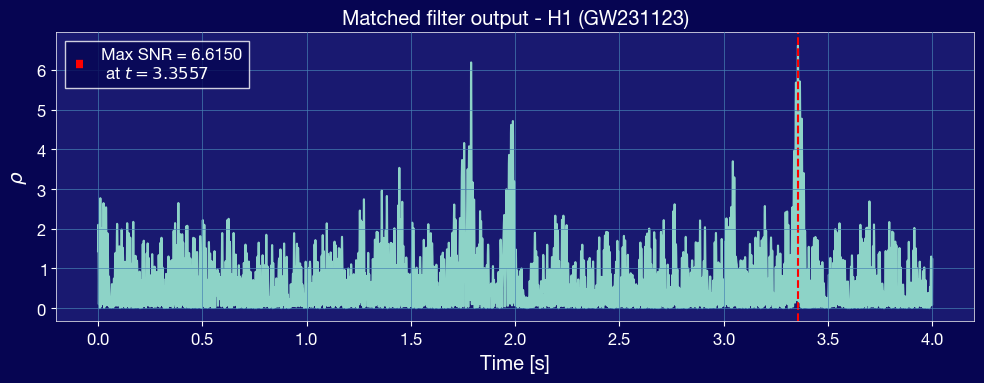

In [197]:
# XPHM
perform_filter_plot("IMRPhenomXPHM", 
                    m1=149.0, m2=92.0, 
                    a1=0.79, a2=0.67, 
                    L_distance=900.0,   # 0.9 Gpc = 900 Mpc
                    thetajn=1.6)

In [198]:
# # TRY TO GET THIS ONE WORKING BC IT IS FREQUENCY DOMAIN

# # XO4a
# perform_filter_plot("IMRPhenomXO4a", 
#                     m1=143.0, m2=55.0, 
#                     a1=0.92, a2=0.47, 
#                     L_distance=3500.0,  # 3.5 Gpc
#                     thetajn=0.5)

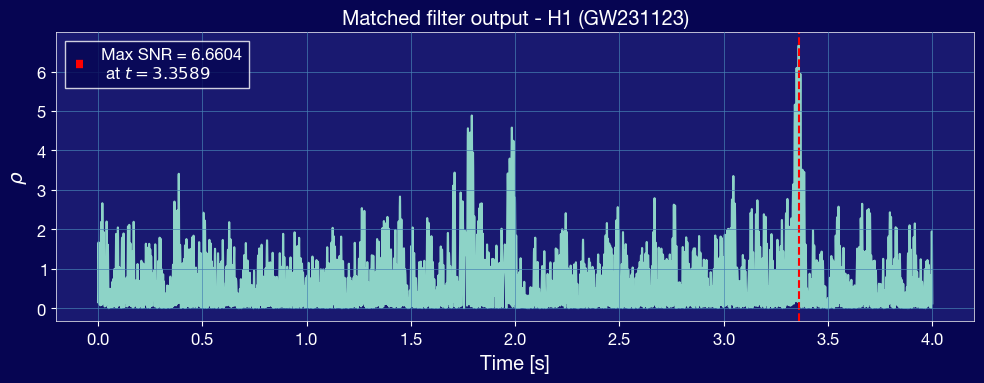

In [ ]:
# TPHM
perform_filter_plot("IMRPhenomTPHM", 
                    m1=best_.0, m2=110.0, 
                    a1=0, a2=0, 
                    L_distance=2700.0,  # 2.7 Gpc
                    thetajn=1.9)

In [200]:
# # not working, time domain, probably not worth it

# # NRSur
# perform_filter_plot("NRSur7dq4", 
#                     m1=128.0, m2=108.0, 
#                     a1=0.90, a2=0.91, 
#                     L_distance=1900.0,  # 1.9 Gpc
#                     thetajn=1.3)

# # v5PHM
# perform_filter_plot("SEOBNRv5PHM", 
#                     m1=133.0, m2=109.0, 
#                     a1=0.91, a2=0.81, 
#                     L_distance=2300.0,  # 2.3 Gpc
#                     thetajn=1.2)

## Actually building template bank: 

Note: propagating the uncertainties from the estimates given by the main report for these masses: 


In [201]:
# Step 1: compute the "true" chirp mass from the XPHM parameters
m1_true = 149.0
m1_low = 136.9
m1_high = 163.0

m2_true = 92.0
m2_low = 70.0
m2_high = 113.0

Mc_low = (m1_low * m2_low)**(3/5) / (m1_low + m2_low)**(1/5)
Mc_true = (m1_true * m2_true)**(3/5) / (m1_true + m2_true)**(1/5)
Mc_high = (m1_high * m2_high)**(3/5) / (m1_high + m2_high)**(1/5)

q_fixed = m2_true / m1_true 
print(Mc_low, Mc_true, Mc_high)

84.28470959010072 101.34003476477451 117.75458123193702


In [202]:
117.75458123193702*1.1

129.53003935513073

In [203]:
# Step 1: compute the "true" chirp mass from the XPHM parameters
m1_true = 149.0
m2_true = 92.0
Mc_true = (m1_true * m2_true)**(3/5) / (m1_true + m2_true)**(1/5)
q_fixed = m2_true / m1_true  # fix mass ratio constant throughout bank

print(f"True chirp mass: {Mc_true:.2f} M_sun")
print(f"Fixed mass ratio: {q_fixed:.3f}")

# Mc_true = 100.2
Mc_low_buffer  = Mc_low * 0.9   # ~66 M_sun, 10% buffer below lower bound
Mc_high_buffer = Mc_high * 1.1  # ~143 M_sun, 10% buffer above upper bound

chirp_mass_array = np.linspace(Mc_low_buffer, Mc_high_buffer, 1000)
delta_Mc = chirp_mass_array[1] - chirp_mass_array[0]
print(f"Range: [{Mc_low_buffer:.1f}, {Mc_high_buffer:.1f}] M_sun")
print(f"Template spacing: {delta_Mc:.4f} M_sun")

True chirp mass: 101.34 M_sun
Fixed mass ratio: 0.617
Range: [75.9, 129.5] M_sun
Template spacing: 0.0537 M_sun


In [204]:
gps

1384782888.7

## HANFORD

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:07<00:00, 132.73it/s]


Best-fit chirp mass: 117.60 M_sun
Maximum SNR: 10.67
True chirp mass: 101.34 M_sun


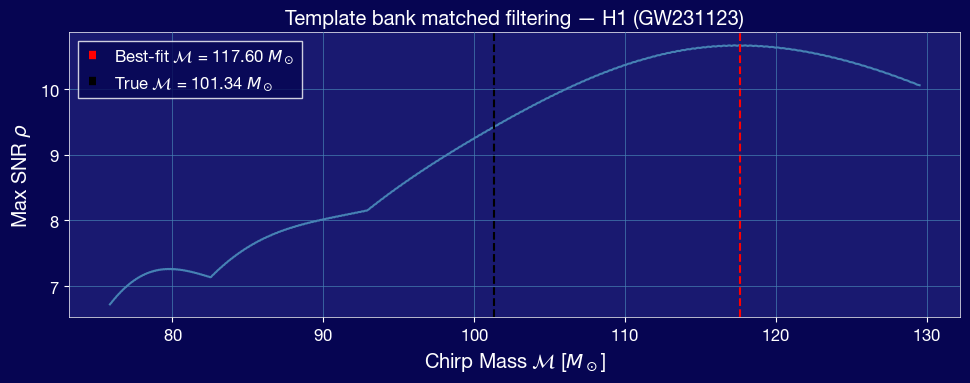

In [248]:
from bilby.gw.conversion import chirp_mass_and_mass_ratio_to_component_masses

# Step 3: iterate over templates
max_snr_array_H1 = np.zeros(len(chirp_mass_array))

for i, Mc in tqdm(enumerate(chirp_mass_array), total=len(chirp_mass_array)):

    # convert chirp mass + fixed q back to component masses
    M_total = Mc * (1 + q_fixed)**(6/5) / q_fixed**(3/5)
    m1 = M_total / (1 + q_fixed)
    m2 = M_total * q_fixed / (1 + q_fixed)

    bank_parameters = dict(
        mass_1=m1,
        mass_2=m2,
        a_1=0,   # zero spin for template bank
        a_2=0,
        tilt_1=0.0,
        tilt_2=0.0,
        phi_12=0,
        phi_jl=0,
        luminosity_distance=900.0,
        theta_jn=1.6,
        psi=0,
        phase=0,
        geocent_time=0,
        ra=0,
        dec=0,
    )

    # generate template
    H1_proj.set_strain_data_from_zero_noise(
        sampling_frequency=sampling_frequency,
        duration=duration,
        start_time=0)
    H1_proj.inject_signal(
        waveform_generator=waveform_generator_2,
        parameters=bank_parameters)
    template_bank = H1_proj.strain_data.frequency_domain_strain

    # normalize
    norm = np.abs(bilby.gw.utils.noise_weighted_inner_product(
        template_bank, template_bank, psd_H1.psd_array, duration=duration))**0.5
    if norm == 0:
        max_snr_array_H1[i] = 0
        continue
    template_bank /= norm

    # matched filter
    match = 2 * np.conj(data_H1) * template_bank / psd_H1.psd_array
    time_domain_match = bilby.utils.infft(match, sampling_frequency)
    max_snr_array_H1[i] = np.max(np.abs(time_domain_match))

# Step 4: find best-fit chirp mass
best_idx = np.argmax(max_snr_array_H1)
best_chirp_mass_H1 = chirp_mass_array[best_idx]
best_snr_H1 = max_snr_array_H1[best_idx]
M_total_best_H1 = best_chirp_mass_H1 * (1 + q_fixed)**(6/5) / q_fixed**(3/5)
H1_m1_best = M_total_best_H1 / (1 + q_fixed)
H1_m2_best = M_total_best_H1 * q_fixed / (1 + q_fixed)

print(f"Best-fit chirp mass: {best_chirp_mass_H1:.2f} M_sun")
print(f"Maximum SNR: {best_snr_H1:.2f}")
print(f"True chirp mass: {Mc_true:.2f} M_sun")

# Step 5: plot
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(chirp_mass_array, max_snr_array_H1, color='steelblue')
ax.axvline(best_chirp_mass_H1, color='r', linestyle='--', 
           label=f'Best-fit $\mathcal{{M}}$ = {best_chirp_mass_H1:.2f} $M_\odot$')
ax.axvline(Mc_true, color='k', linestyle='--',
           label=f'True $\mathcal{{M}}$ = {Mc_true:.2f} $M_\odot$')
ax.set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]')
ax.set_ylabel(r'Max SNR $\rho$')
ax.set_title('Template bank matched filtering — H1 (GW231123)')
ax.legend()
plt.tight_layout()
plt.show()

## LIVINGSTON: 

100%|██████████| 1000/1000 [00:08<00:00, 120.69it/s]


Best-fit chirp mass: 112.71 M_sun
Maximum SNR: 9.02
True chirp mass: 101.34 M_sun


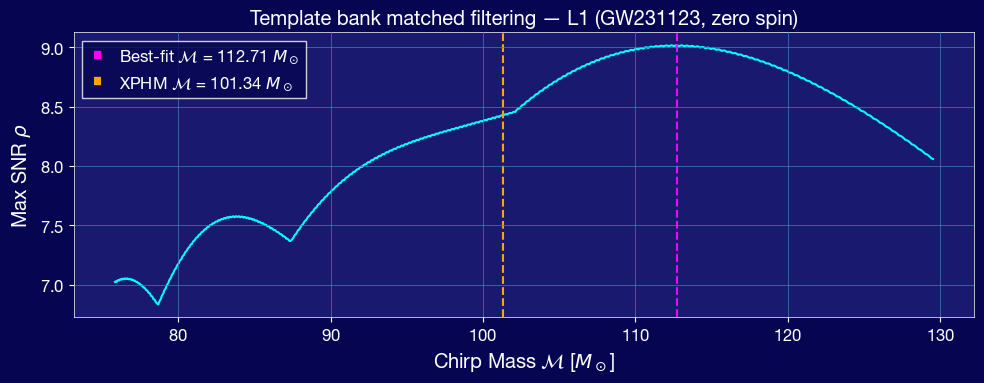

In [274]:
from bilby.gw.conversion import chirp_mass_and_mass_ratio_to_component_masses

#
# Step 3: iterate over templates
max_snr_array_L1 = np.zeros(len(chirp_mass_array))

for i, Mc in tqdm(enumerate(chirp_mass_array), total=len(chirp_mass_array)):

    # convert chirp mass + fixed q back to component masses
    M_total = Mc * (1 + q_fixed)**(6/5) / q_fixed**(3/5)
    m1 = M_total / (1 + q_fixed)
    m2 = M_total * q_fixed / (1 + q_fixed)

    bank_parameters = dict(
        mass_1=m1,
        mass_2=m2,
        a_1=0,   # zero spin for template bank
        a_2=0,
        tilt_1=0.0,
        tilt_2=0.0,
        phi_12=0,
        phi_jl=0,
        luminosity_distance=900.0,
        theta_jn=1.6,
        psi=0,
        phase=0,
        geocent_time=0,
        ra=0,
        dec=0,
    )

    # generate template
    L1_proj.set_strain_data_from_zero_noise(
        sampling_frequency=sampling_frequency,
        duration=duration,
        start_time=0)
    L1_proj.inject_signal(
        waveform_generator=waveform_generator_2,
        parameters=bank_parameters)
    template_bank = L1_proj.strain_data.frequency_domain_strain

    # normalize
    norm = np.abs(bilby.gw.utils.noise_weighted_inner_product(
        template_bank, template_bank, psd_L1.psd_array, duration=duration))**0.5
    if norm == 0:
        max_snr_array_L1[i] = 0
        continue
    template_bank /= norm

    # matched filter
    match = 2 * np.conj(data_L1) * template_bank / psd_L1.psd_array
    time_domain_match = bilby.utils.infft(match, sampling_frequency)
    max_snr_array_L1[i] = np.max(np.abs(time_domain_match))

# Step 4: find best-fit chirp mass
best_idx = np.argmax(max_snr_array_L1)
best_chirp_mass_L1 = chirp_mass_array[best_idx]
best_snr_L1 = max_snr_array_L1[best_idx]
M_total_best_L1 = best_chirp_mass_L1 * (1 + q_fixed)**(6/5) / q_fixed**(3/5)
L1_m1_best = M_total_best_L1 / (1 + q_fixed)
L1_m2_best = M_total_best_L1 * q_fixed / (1 + q_fixed)

print(f"Best-fit chirp mass: {best_chirp_mass_L1:.2f} M_sun")
print(f"Maximum SNR: {best_snr_L1:.2f}")
print(f"True chirp mass: {Mc_true:.2f} M_sun")

# Step 5: plot
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(chirp_mass_array, max_snr_array_L1, color='cyan')
ax.axvline(best_chirp_mass_L1, color='magenta', linestyle='--', 
           label=f'Best-fit $\mathcal{{M}}$ = {best_chirp_mass_L1:.2f} $M_\odot$')
ax.axvline(Mc_true, color='orange', linestyle='--',
           label=f'XPHM $\mathcal{{M}}$ = {Mc_true:.2f} $M_\odot$')
ax.set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]')
ax.set_ylabel(r'Max SNR $\rho$')
ax.set_title('Template bank matched filtering — L1 (GW231123, zero spin)')
ax.legend()
plt.tight_layout()
plt.show()

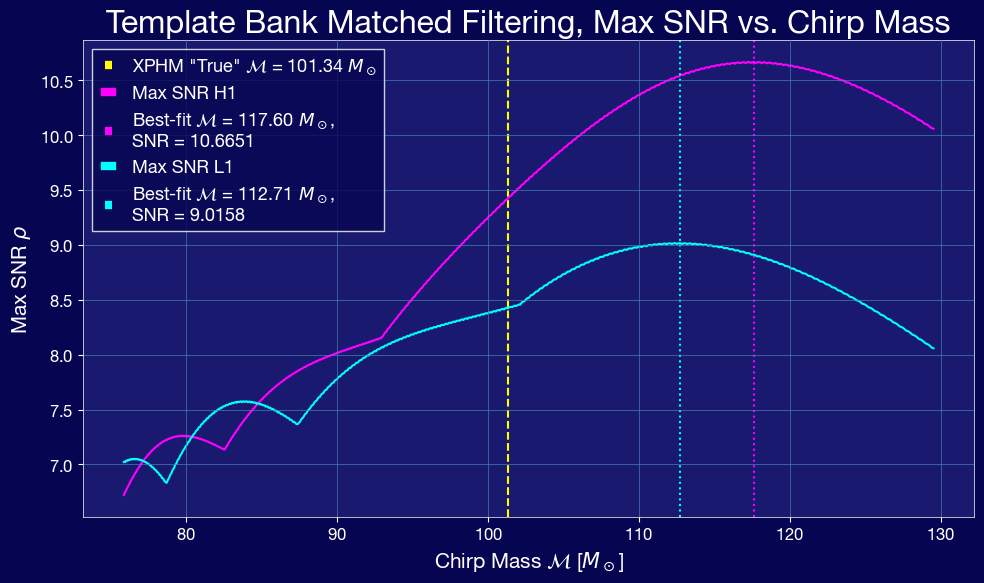

In [283]:
# to plot both template banks with chirp mass vs. max SNR 
dpi=300
# Step 5: plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.axvline(Mc_true, color='yellow', linestyle='--',
           label=f'XPHM "True" $\mathcal{{M}}$ = {Mc_true:.2f} $M_\odot$')
ax.plot(chirp_mass_array, max_snr_array_H1, color='magenta', label=f'Max SNR H1')
ax.axvline(best_chirp_mass_H1, color='magenta', linestyle='dotted', 
           label=f'Best-fit $\mathcal{{M}}$ = {best_chirp_mass_H1:.2f} $M_\odot$,\nSNR = 10.6651')
ax.plot(chirp_mass_array, max_snr_array_L1, color='cyan', label = 'Max SNR L1')
ax.axvline(best_chirp_mass_L1, color='cyan', linestyle='dotted', 
           label=f'Best-fit $\mathcal{{M}}$ = {best_chirp_mass_L1:.2f} $M_\odot$,\nSNR = 9.0158')
ax.set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]')
ax.set_ylabel(r'Max SNR $\rho$')
ax.set_title('Template bank matched filtering — H1 (GW231123)')
ax.legend()

# ax.axvline(best_chirp_mass_L1, color='cyan', linestyle='dotted', 
#            label=f'Best-fit $\mathcal{{M}}$ = {best_chirp_mass_L1:.2f} $M_\odot$')
# ax.axvline(Mc_true, color='orange', linestyle='--',
#            label=f'XPHM $\mathcal{{M}}$ = {Mc_true:.2f} $M_\odot$')
ax.set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]', fontsize = 15)
ax.set_ylabel(r'Max SNR $\rho$', fontsize=15)
ax.set_title('Template Bank Matched Filtering, Max SNR vs. Chirp Mass', fontsize=23)
ax.legend(fontsize=13)

plt.savefig('/Users/leayamashiro/AnA_MSc/Period_5_2026/GWs/GWs_projects/Data_Analysis/figures_for_paper/SNR_v_Mc.png')
plt.tight_layout()
plt.show()

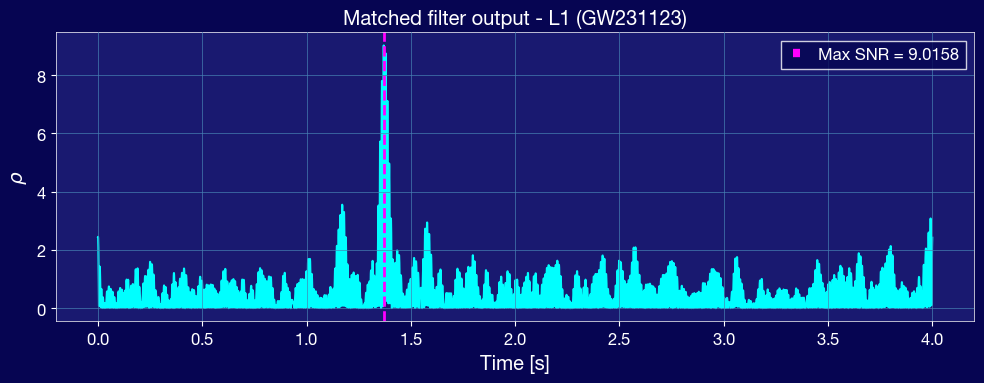

In [276]:
perform_filter_plot(m1=L1_m1_best, m2=L1_m2_best, a1=0, a2=0, L_distance=900, 
                    thetajn=1.6, approximant='IMRPhenomXP', detector = 'L1')

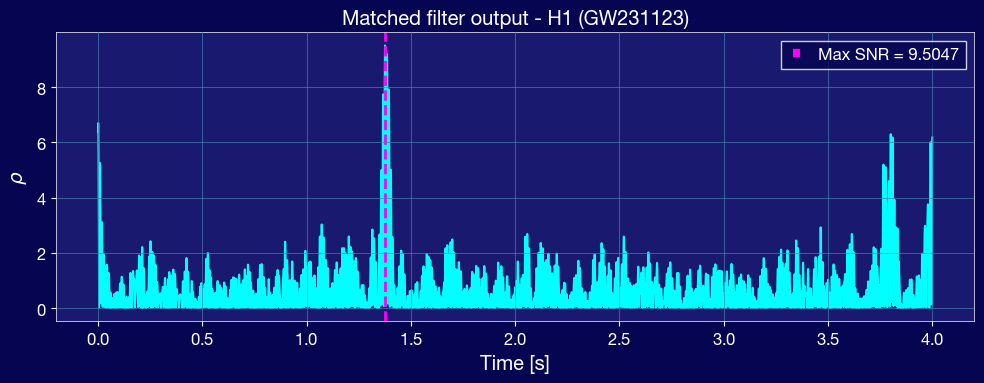

In [446]:
perform_filter_plot("IMRPhenomTPHM", 
                    m1=L1_m1_best, m2=L1_m2_best, 
                    a1=0, a2=0, 
                    L_distance=2700.0,  # 2.7 Gpc
                    thetajn=1.9)

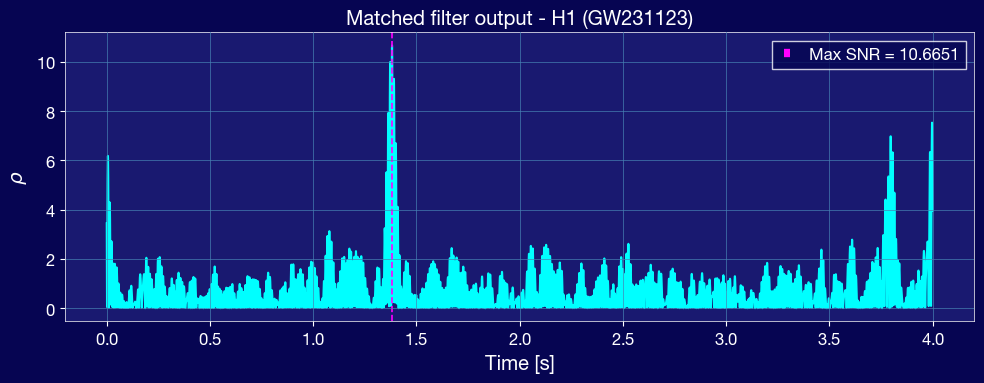

In [218]:
perform_filter_plot(m1=H1_m1_best, m2=H1_m2_best, a1=0, a2=0, L_distance=900, 
                    thetajn=1.6, approximant='IMRPhenomXP', detector = 'H1')

In [460]:
def perform_filter_plot_both(approximant, m1_H1, m2_H1, m1_L1, m2_L1, a1, a2, L_distance, thetajn):
    # run both detectors
    max_snr_H1, max_snr_time_H1, time_domain_match_H1, time_array_H1 = perform_matched_filter_H1(
        approximant, m1_H1, m2_H1, a1, a2, L_distance, thetajn)
    max_snr_L1, max_snr_time_L1, time_domain_match_L1, time_array_L1 = perform_matched_filter_L1(
        approximant, m1_L1, m2_L1, a1, a2, L_distance, thetajn)

    delta_t_H1 = max_snr_time_H1 - 2
    delta_t_L1 = max_snr_time_L1 - 2
    fig, axes = plt.subplots(2, 1, figsize=(10, 7), sharex=True)

    axes[0].plot(time_array_H1, np.abs(time_domain_match_H1), color='magenta', lw=0.6)
    axes[0].axvline(max_snr_time_H1, color='yellow', lw=2, linestyle='--',
                    label=fr'Max SNR = {max_snr_H1:.4f}, $\Delta t_{{\rm gps}} = {delta_t_H1:.4f}$ s')
    axes[0].set_ylabel(r'SNR ($\rho$)', fontsize=13)
    axes[0].set_title(f'Matched filter output - LIGO Hanford', fontsize=15)
    axes[0].legend()
    axes[0].set_ylim(-0.5, 12)

    axes[1].plot(time_array_L1, np.abs(time_domain_match_L1), color='cyan', lw=0.6)
    axes[1].axvline(max_snr_time_L1, color='yellow', lw=2, linestyle='--',
                    label=fr'Max SNR = {max_snr_L1:.4f}, $\Delta t_{{\rm gps}} = {delta_t_L1:.4f}$ s')
    axes[1].set_ylabel(r'SNR ($\rho$)', fontsize=13)
    axes[1].set_title(f'Matched filter output - LIGO Livingston', fontsize=15)
    axes[1].legend()
    axes[1].set_ylim(-0.5, 12)

    fig.supxlabel('Time [s]', fontsize=13)
    plt.tight_layout()
    plt.savefig('/Users/leayamashiro/AnA_MSc/Period_5_2026/GWs/GWs_projects/Data_Analysis/figures_for_paper/matched_filter_output_again.png')

    plt.show()
    print(f"H1: Max SNR = {max_snr_H1:.4f} at t = {max_snr_time_H1:.4f} s")
    print(f"L1: Max SNR = {max_snr_L1:.4f} at t = {max_snr_time_L1:.4f} s")
    print(f"Time difference H1-L1: {(max_snr_time_H1 - max_snr_time_L1)*1000:.2f} ms")

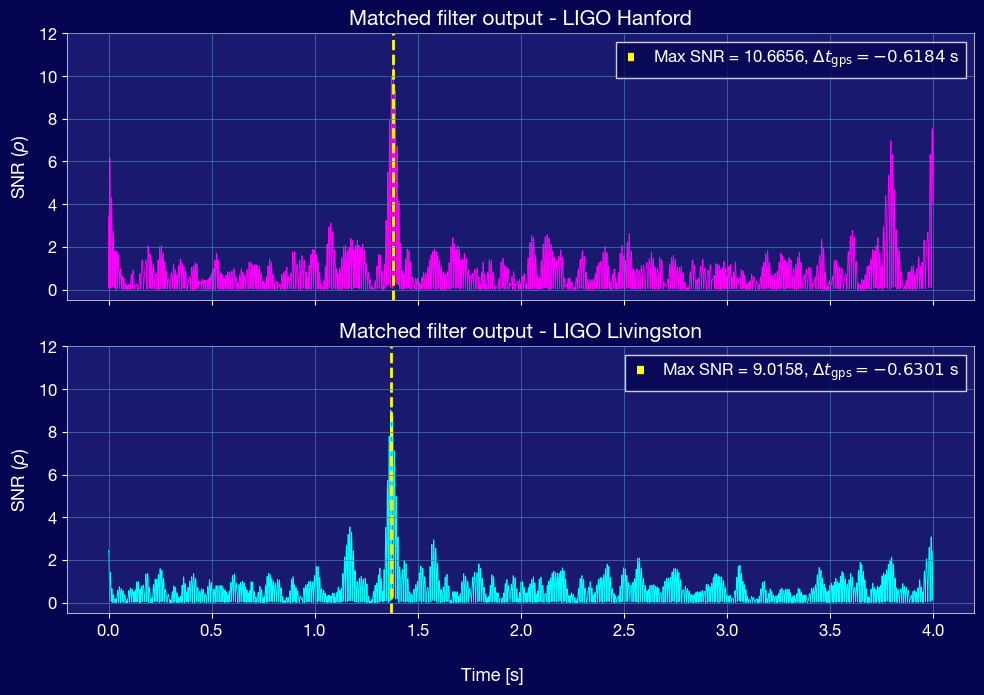

H1: Max SNR = 10.6656 at t = 1.3816 s
L1: Max SNR = 9.0158 at t = 1.3699 s
Time difference H1-L1: 11.72 ms


In [461]:
dpi=300
perform_filter_plot_both(
    approximant='IMRPhenomXP',
    m1_H1=H1_m1_best, m2_H1=H1_m2_best,
    m1_L1=L1_m1_best, m2_L1=L1_m2_best,
    a1=0, a2=0,
    L_distance=900,
    thetajn=1.6
)


In [216]:
# Step 1: run the bank (as before) to find best chirp mass
# ... (bank loop gives best_chirp_mass, best_snr)

# Step 2: convert best chirp mass back to m1, m2
M_total_best = best_chirp_mass * (1 + q_fixed)**(6/5) / q_fixed**(3/5)
m1_best = M_total_best / (1 + q_fixed)
m2_best = M_total_best * q_fixed / (1 + q_fixed)

# Step 3: run full matched filter with best-fit template using your function
max_snr, max_snr_time, time_domain_match_H1, time_array_new = perform_matched_filter_H1(
    approximant="IMRPhenomXP",
    m1=m1_best,
    m2=m2_best,
    a1=0.0,   # zero spin — same as bank
    a2=0.0,
    L_distance=900.0,
    thetajn=1.6
)

# Step 4: plot time-domain SNR for best-fit template
plot_matched_filter(max_snr, max_snr_time, time_domain_match_H1, time_array_new)

print(f"Best-fit chirp mass: {best_chirp_mass:.2f} M_sun")
print(f"True chirp mass (XPHM): {Mc_true:.2f} M_sun")
print(f"Max SNR: {max_snr:.2f} at t = {max_snr_time:.4f} s")

TypeError: plot_matched_filter() missing 1 required positional argument: 'detector'

In [131]:
np.max(chirp_mass_array)

129.53003935513073

In [132]:
np.min(chirp_mass_array)

75.85623863109065

100%|██████████| 100/100 [01:12<00:00,  1.37it/s]


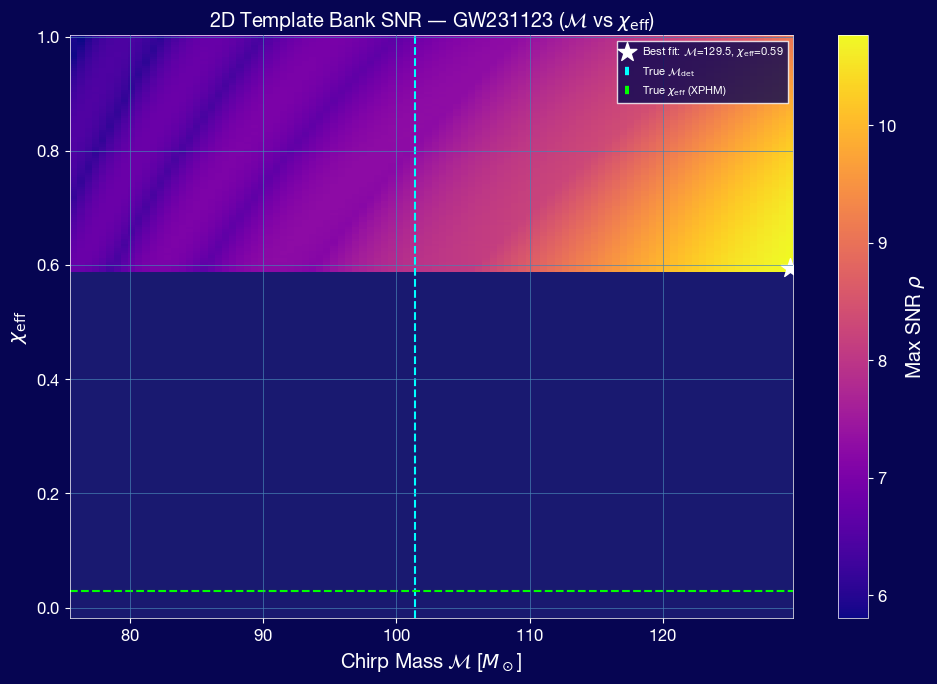

In [212]:
# 2D template bank over chirp mass and chi_eff
Mc_array = np.linspace(75.8, 129.5, 100)      # keep manageable — 50x50 = 2500 templates
a1_array = np.linspace(0.59, 1, 100)

snr_grid = np.zeros((len(a1_array), len(Mc_array)))

for i, a1_i in tqdm(enumerate(a1_array), total=len(a1_array)):
    for j, Mc in enumerate(Mc_array):

        # convert Mc + fixed q to component masses
        q_fixed = 0.61
        M_total = Mc * (1 + q_fixed)**(6/5) / q_fixed**(3/5)
        m1 = M_total / (1 + q_fixed)
        m2 = M_total * q_fixed / (1 + q_fixed)

        bank_parameters = dict(
            mass_1=m1, mass_2=m2,
            a_1=a1_i, a_2=0,
            tilt_1=0.0, tilt_2=0.0,
            phi_12=0, phi_jl=0,
            luminosity_distance=900.0,
            theta_jn=0.0,   # face-on simplification
            psi=0, phase=0,
            geocent_time=0, ra=0, dec=0,
        )

        try:
            H1_proj.set_strain_data_from_zero_noise(
                sampling_frequency=sampling_frequency,
                duration=duration, start_time=0)
            H1_proj.inject_signal(
                waveform_generator=waveform_generator_2,
                parameters=bank_parameters)
            template_bank = H1_proj.strain_data.frequency_domain_strain

            norm = np.abs(bilby.gw.utils.noise_weighted_inner_product(
                template_bank, template_bank, psd_H1.psd_array, duration=duration))**0.5
            if norm == 0:
                continue
            template_bank /= norm

            match = 2 * np.conj(data_H1) * template_bank / psd_H1.psd_array
            time_domain_match = bilby.utils.infft(match, sampling_frequency)
            snr_grid[i, j] = np.max(np.abs(time_domain_match))

        except Exception:
            snr_grid[i, j] = 0

# plot heatmap
fig, ax = plt.subplots(figsize=(10, 7))
im = ax.pcolormesh(Mc_array, a1_array, snr_grid, 
                   cmap='plasma', shading='auto')
plt.colorbar(im, ax=ax, label=r'Max SNR $\rho$')

# mark best fit
best_idx = np.unravel_index(np.argmax(snr_grid), snr_grid.shape)
ax.scatter(Mc_array[best_idx[1]], a1_array[best_idx[0]], 
           color='white', marker='*', s=200, 
           label=f'Best fit: $\mathcal{{M}}$={Mc_array[best_idx[1]]:.1f}, $\chi_\mathrm{{eff}}$={a1_array[best_idx[0]]:.2f}')

# mark true values
ax.axvline(101.43, color='cyan', linestyle='--', label=r'True $\mathcal{M}_\mathrm{det}$')
ax.axhline(0.03, color='lime', linestyle='--', label=r'True $\chi_\mathrm{eff}$ (XPHM)')

ax.set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]')
ax.set_ylabel(r'$\chi_\mathrm{eff}$')
ax.set_title(r'2D Template Bank SNR — GW231123 ($\mathcal{M}$ vs $\chi_\mathrm{eff}$)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

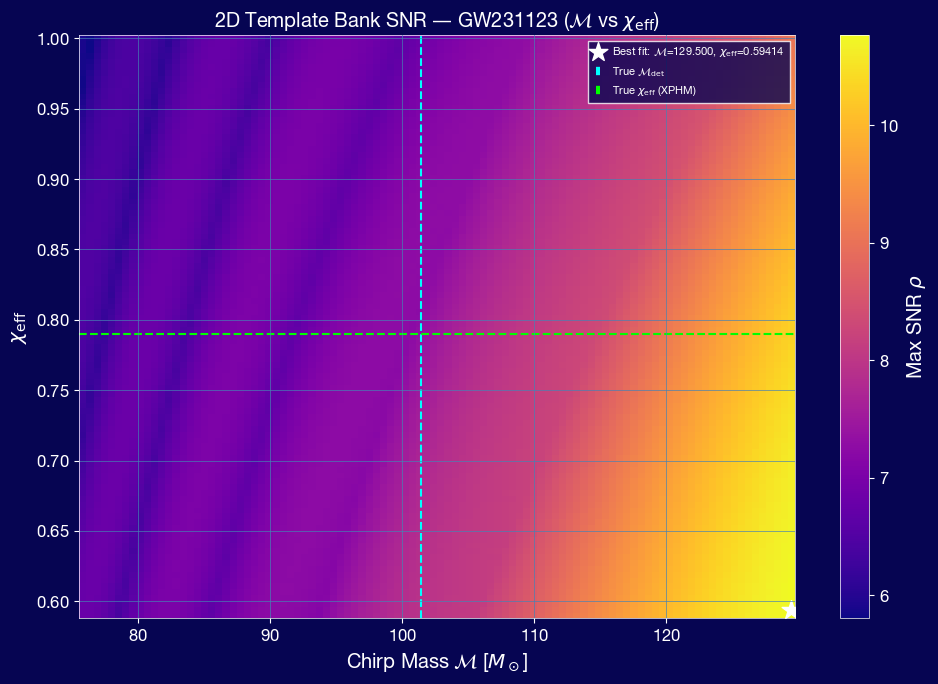

In [213]:

# plot heatmap
fig, ax = plt.subplots(figsize=(10, 7))
im = ax.pcolormesh(Mc_array, a1_array, snr_grid, 
                   cmap='plasma', shading='auto')
plt.colorbar(im, ax=ax, label=r'Max SNR $\rho$')

# mark best fit
best_idx = np.unravel_index(np.argmax(snr_grid), snr_grid.shape)
ax.scatter(Mc_array[best_idx[1]], a1_array[best_idx[0]], 
           color='white', marker='*', s=200, 
           label=f'Best fit: $\mathcal{{M}}$={Mc_array[best_idx[1]]:.3f}, $\chi_\mathrm{{eff}}$={a1_array[best_idx[0]]:.5f}')

# mark true values
ax.axvline(101.43, color='cyan', linestyle='--', label=r'True $\mathcal{M}_\mathrm{det}$')
ax.axhline(0.79, color='lime', linestyle='--', label=r'True $\chi_\mathrm{eff}$ (XPHM)')

ax.set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]')
ax.set_ylabel(r'$\chi_\mathrm{eff}$')
ax.set_title(r'2D Template Bank SNR — GW231123 ($\mathcal{M}$ vs $\chi_\mathrm{eff}$)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

In [26]:
gps

1384782888.7

### Bayesian inference of source parameters for an event from the fourth observing run (O4) of LIGO-Virgo-KAGRA

For the same event that you've previously chosen for a matched-filter search of recent LIGO data, run a parameter estimation analysis following the GW150914 example given in Sec. 3 of *'ExampleNotebook_DataAnalysis.ipynb'*. You will need to adjust the prior choices and try different sampler settings for reasonable results (i.e., number of live points and convergence threshold).

Compare your results with those previously reported in the literature listed above and discuss reasons for discrepancies you might be observing.

In [28]:
import bilby
from bilby.core.prior import Uniform, PowerLaw
from bilby.gw.conversion import convert_to_lal_binary_black_hole_parameters, generate_all_bbh_parameters
# Next we set up a prior for the analysis

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()

prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=117*0.7, maximum=117*1.3)
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.4, maximum=0.8)
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)

#spins
prior['a_1'] =  Uniform(name='a_1', minimum=0.5, maximum=1)# 0.79
prior['a_2'] =  Uniform(name='a_2', minimum=0.5, maximum=1)
prior['tilt_1'] =  bilby.core.prior.Sine(name='tilt_1', minimum=0, maximum=np.pi)
prior['tilt_2'] =  bilby.core.prior.Sine(name='tilt_2', minimum=0, maximum=np.pi)
prior['phi_12'] =  0.0
prior['phi_jl'] =  0.0
# position
prior['dec'] =  bilby.core.prior.Cosine(name='dec')
prior['ra'] =  bilby.core.prior.Uniform(name='ra', minimum=0, maximum=2*np.pi, boundary='periodic')
# 
prior['theta_jn'] =  1.6
prior['psi'] =  0

# prior['luminosity_distance'] = PowerLaw(alpha=2, name='luminosity_distance', minimum=50, maximum=2000, unit='Mpc', latex_label='$d_L$')
prior['luminosity_distance'] = bilby.gw.prior.UniformSourceFrame(
    name='luminosity_distance', 
    minimum=100, 
    maximum=5000,    # in Mpc, covers the full range across all models
    unit='Mpc', 
    latex_label='$d_L$'
)



In [29]:
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

# First, we set up the list of interferometers we want to include in the likelihood calculation
interferometers = [H1, L1]

# Next we need set up the waveform generator that can specify templates at a random point in parameter space
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', reference_frequency=100., catch_waveform_errors=True)

# We now create the waveform_generator object. This also takes care of converting between parameters etc.
waveform_generator = bilby.gw.WaveformGenerator(
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters)

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)

  0%|          | 0/400 [00:00<?, ?it/s]

In [30]:
# Let's get sampling!

# Next we need set up the waveform generator that can specify templates at a random point in parameter space
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', 
    reference_frequency=100., 
    minimum_frequency=20,
    catch_waveform_errors=True)

waveform_generator = bilby.gw.WaveformGenerator(
    duration=duration,
    sampling_frequency=sampling_frequency,
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters
)
# approximant = 'IMRPhenomXP'
#  waveform_arguments = dict(
#         reference_frequency=10.0,
#         minimum_frequency=20,
#         waveform_approximant=approximant # so this becomes IMRPhenomXP
#         )
# Run the sampler and observe runtime, posterior width, etc.
result_short = bilby.run_sampler(
    likelihood,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW231123_135430",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=250,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
)

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'


Exception while calling loglikelihood function:
  params: [1.43568212e+02 7.22159633e-01 7.17380214e-01 8.57246429e-01
 5.65028307e-01 9.45702871e-01 5.25311910e-01 3.83613413e+00
 1.96433697e-04]
  args: []
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/dynesty.py", line 827, in __call__
    return self.func(np.asarray(x).copy(), *self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/bilby/core/sampler/dynesty.py", line 59, in _log_likelihood_wrapper
    return _safe_likelihood_call(
           ^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/bilby/core/likelihood.py", line 57, in _safe_likelihood_call
    logl = method(parameters=parameters)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/bilby/gw/likelihood/base.py", line 414, in log_likelihood_ratio
    self.waveform_generator.frequency_domain_strain(parameters)
  File "/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/bilby/gw/waveform_generator.py", line 12

SystemExit: 130

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [310]:
# Step 1: compute the "true" chirp mass from the XPHM parameters
m1_true = 149.0
m1_low = 136.9
m1_high = 163.0

m2_true = 92.0
m2_low = 70.0
m2_high = 113.0

Mc_low = (m1_low * m2_low)**(3/5) / (m1_low + m2_low)**(1/5)
Mc_true = (m1_true * m2_true)**(3/5) / (m1_true + m2_true)**(1/5)
Mc_high = (m1_high * m2_high)**(3/5) / (m1_high + m2_high)**(1/5)

q_abac_true = 0.61
q_abac_high = 0.74
q_abac_low = 0.47

In [311]:
import bilby
from bilby.core.prior import Uniform, PowerLaw
from bilby.gw.conversion import convert_to_lal_binary_black_hole_parameters, generate_all_bbh_parameters

# Next we set up a prior for the analysis

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()
prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=0.9*Mc_low, maximum=1.1*Mc_high) # make these a bit tighter, 30% from the actual value
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.9*q_abac_low, maximum=1.1*q_abac_high) # same thing ^ 
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
prior['ra'] = bilby.core.prior.Uniform(name='ra', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['dec'] = bilby.core.prior.Cosine(name='dec')

prior['theta_jn'] = bilby.core.prior.Uniform(name='theta_jn', minimum=1.6-0.6, maximum=1.6+0.6)
prior['psi'] = bilby.core.prior.Uniform(name='psi', minimum=0, maximum=np.pi, boundary='periodic')

prior['luminosity_distance'] = bilby.gw.prior.UniformSourceFrame(
    name='luminosity_distance', minimum=100.0, maximum=5000.0, unit='Mpc', latex_label='$d_L$')

prior['a_1'] = bilby.core.prior.Uniform(name='a_1', minimum=0.0, maximum=0.99)
prior['a_2'] = bilby.core.prior.Uniform(name='a_2', minimum=0.0, maximum=0.99)

prior['tilt_1'] = bilby.core.prior.Sine(name='tilt_1', minimum=0, maximum=np.pi)
prior['tilt_2'] = bilby.core.prior.Sine(name='tilt_2', minimum=0, maximum=np.pi)
prior['phi_12'] = bilby.core.prior.Uniform(name='phi_12', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['phi_jl'] = bilby.core.prior.Uniform(name='phi_jl', minimum=0, maximum=2*np.pi, boundary='periodic')
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

In [312]:
# First, we set up the list of interferometers we want to include in the likelihood calculation
interferometers = [H1, L1]

# Next we need set up the waveform generator that can specify templates at a random point in parameter space
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', reference_frequency=10., catch_waveform_errors=True)

# We now create the waveform_generator object. This also takes care of converting between parameters etc.
waveform_generator = bilby.gw.WaveformGenerator(
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters)

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)

  0%|          | 0/400 [00:00<?, ?it/s]

In [313]:
# Let's get sampling!

# Run the sampler and observe runtime, posterior width, etc.
result_short = bilby.run_sampler(
    likelihood,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW150914",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=250,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
    npool=7
)

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
01:36 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

01:37 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/arviz/__init__.py:50: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


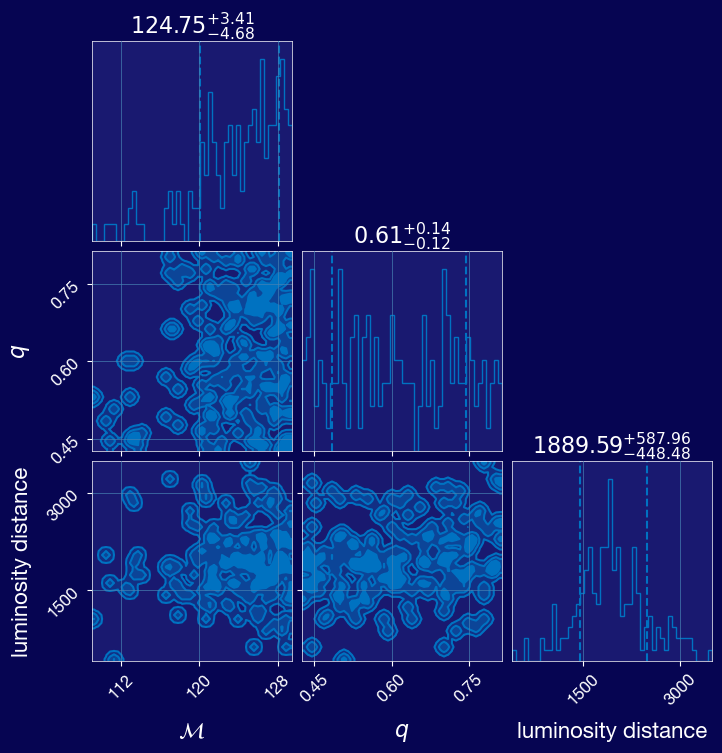

In [314]:
result_short.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)


In [318]:
import bilby
from bilby.core.prior import Uniform, PowerLaw
from bilby.gw.conversion import convert_to_lal_binary_black_hole_parameters, generate_all_bbh_parameters

# Next we set up a prior for the analysis

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()
prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=0.9*Mc_low, maximum=1.1*Mc_high) # make these a bit tighter, 30% from the actual value
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.9*q_abac_low, maximum=1.1*q_abac_high) # same thing ^ 
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
prior['ra'] = bilby.core.prior.Uniform(name='ra', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['dec'] = bilby.core.prior.Cosine(name='dec')

prior['theta_jn'] = bilby.core.prior.Uniform(name='theta_jn', minimum=1.6-0.6, maximum=1.6+0.6)
prior['psi'] = bilby.core.prior.Uniform(name='psi', minimum=0, maximum=np.pi, boundary='periodic')

prior['luminosity_distance'] = bilby.gw.prior.UniformSourceFrame(
    name='luminosity_distance', minimum=100.0, maximum=3000, unit='Mpc', latex_label='$d_L$')

prior['a_1'] = bilby.core.prior.Uniform(name='a_1', minimum=0.7*0.79, maximum=1)
prior['a_2'] = bilby.core.prior.Uniform(name='a_2', minimum=0.7*0.67, maximum=1)

prior['tilt_1'] = bilby.core.prior.Sine(name='tilt_1', minimum=0, maximum=np.pi)
prior['tilt_2'] = bilby.core.prior.Sine(name='tilt_2', minimum=0, maximum=np.pi)
prior['phi_12'] = bilby.core.prior.Uniform(name='phi_12', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['phi_jl'] = bilby.core.prior.Uniform(name='phi_jl', minimum=0, maximum=2*np.pi, boundary='periodic')
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood2 = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)

In [319]:
0.7*0.79

0.5529999999999999

In [320]:

# Run the sampler and observe runtime, posterior width, etc.
result_short_2 = bilby.run_sampler(
    likelihood2,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW150914",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=250,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
    npool=8
)

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
01:57 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

01:58 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


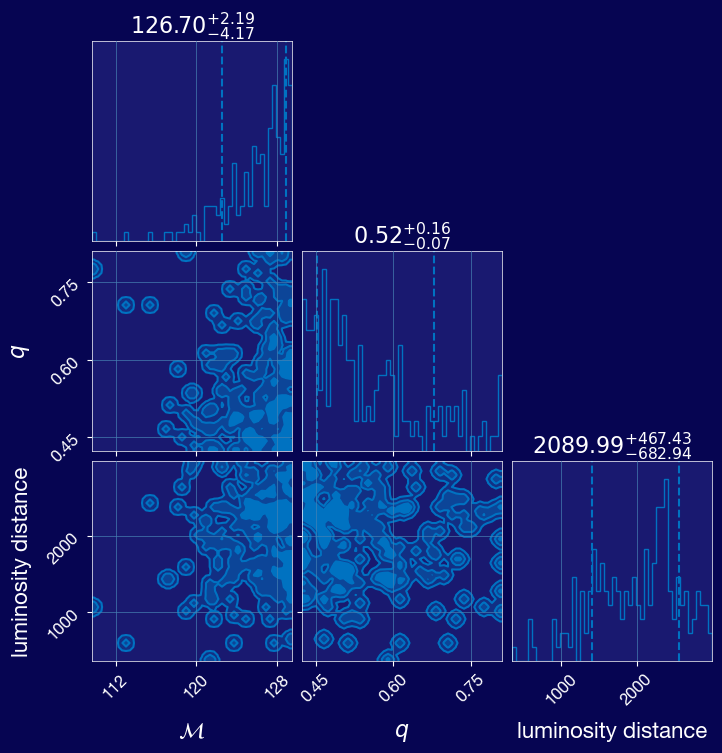

In [321]:
result_short_2.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)


In [322]:
import bilby
from bilby.core.prior import Uniform, PowerLaw
from bilby.gw.conversion import convert_to_lal_binary_black_hole_parameters, generate_all_bbh_parameters

# Next we set up a prior for the analysis

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()
prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=0.6*Mc_low, maximum=1.6*Mc_high) # make these a bit tighter, 30% from the actual value
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.5*q_abac_low, maximum=0.9) # same thing ^ 
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
prior['ra'] = bilby.core.prior.Uniform(name='ra', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['dec'] = bilby.core.prior.Cosine(name='dec')

prior['theta_jn'] = bilby.core.prior.Uniform(name='theta_jn', minimum=1.6-0.6, maximum=1.6+0.6)
prior['psi'] = bilby.core.prior.Uniform(name='psi', minimum=0, maximum=np.pi, boundary='periodic')

prior['luminosity_distance'] = bilby.gw.prior.UniformSourceFrame(
    name='luminosity_distance', minimum=100.0, maximum=5000.0, unit='Mpc', latex_label='$d_L$')

prior['a_1'] = bilby.core.prior.Uniform(name='a_1', minimum=0.0, maximum=0.99)
prior['a_2'] = bilby.core.prior.Uniform(name='a_2', minimum=0.0, maximum=0.99)

prior['tilt_1'] = bilby.core.prior.Sine(name='tilt_1', minimum=0, maximum=np.pi)
prior['tilt_2'] = bilby.core.prior.Sine(name='tilt_2', minimum=0, maximum=np.pi)
prior['phi_12'] = bilby.core.prior.Uniform(name='phi_12', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['phi_jl'] = bilby.core.prior.Uniform(name='phi_jl', minimum=0, maximum=2*np.pi, boundary='periodic')
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

In [323]:

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood3 = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)

result_short_2 = bilby.run_sampler(
    likelihood3,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW150914",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=500,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
    npool=8
)

  0%|          | 0/400 [00:00<?, ?it/s]

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
02:31 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/427 [00:00<?, ?it/s]

02:32 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


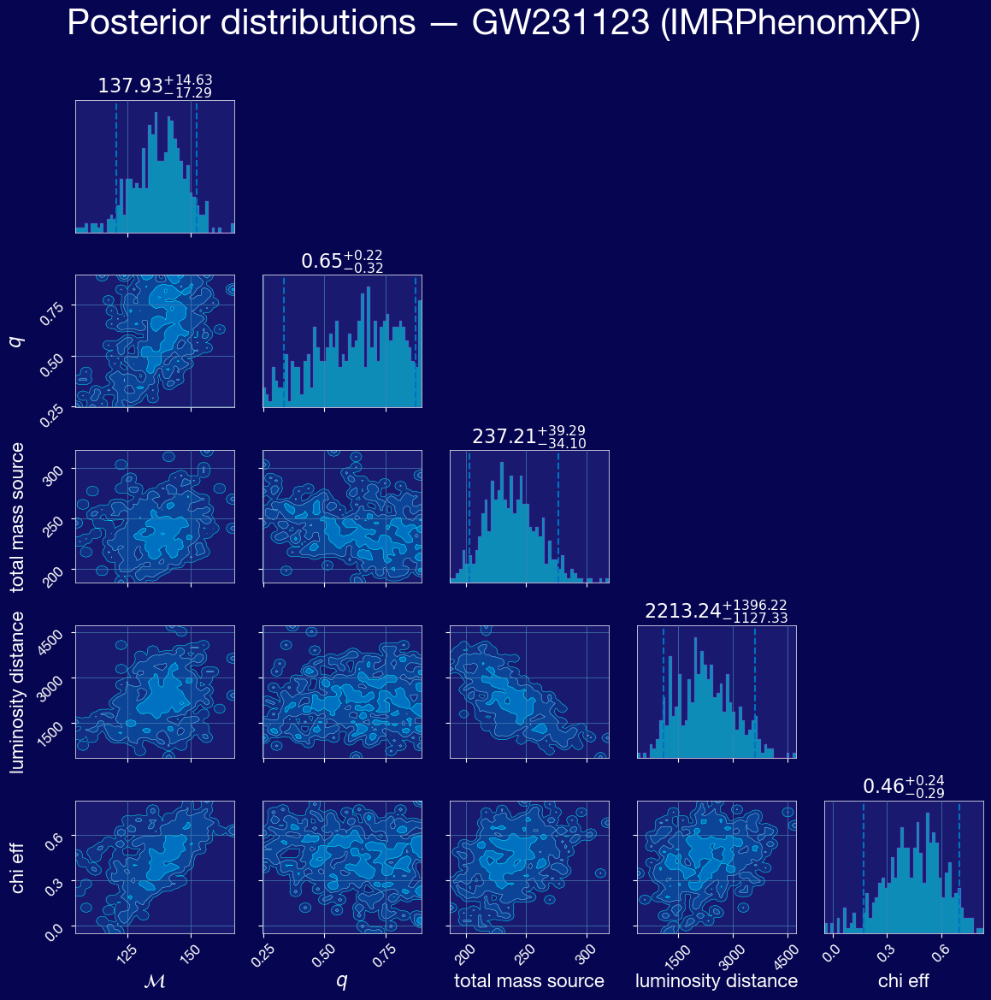

In [439]:
dpi=300
fig = result_short_2.plot_corner(
    parameters=["chirp_mass", "mass_ratio", "total_mass_source", "luminosity_distance", "chi_eff"],
    prior=True,
    hist_kwargs={
        "density": True,
        "color": "cyan",
        "alpha": 0.5,
        "histtype": "stepfilled",
        "edgecolor": 'magenta',
        "linewidth": 0.3
    },
    quantiles=[0.05, 0.95],
    title_quantiles=[0.05, 0.5, 0.95],
    contour_kwargs={"linewidths": 0.3, "colors": ["cyan", "skyblue"]},
)

fig.suptitle("Posterior distributions — GW231123 (IMRPhenomXP)", 
             fontsize=30, y=1.001)
fig.tight_layout()
fig

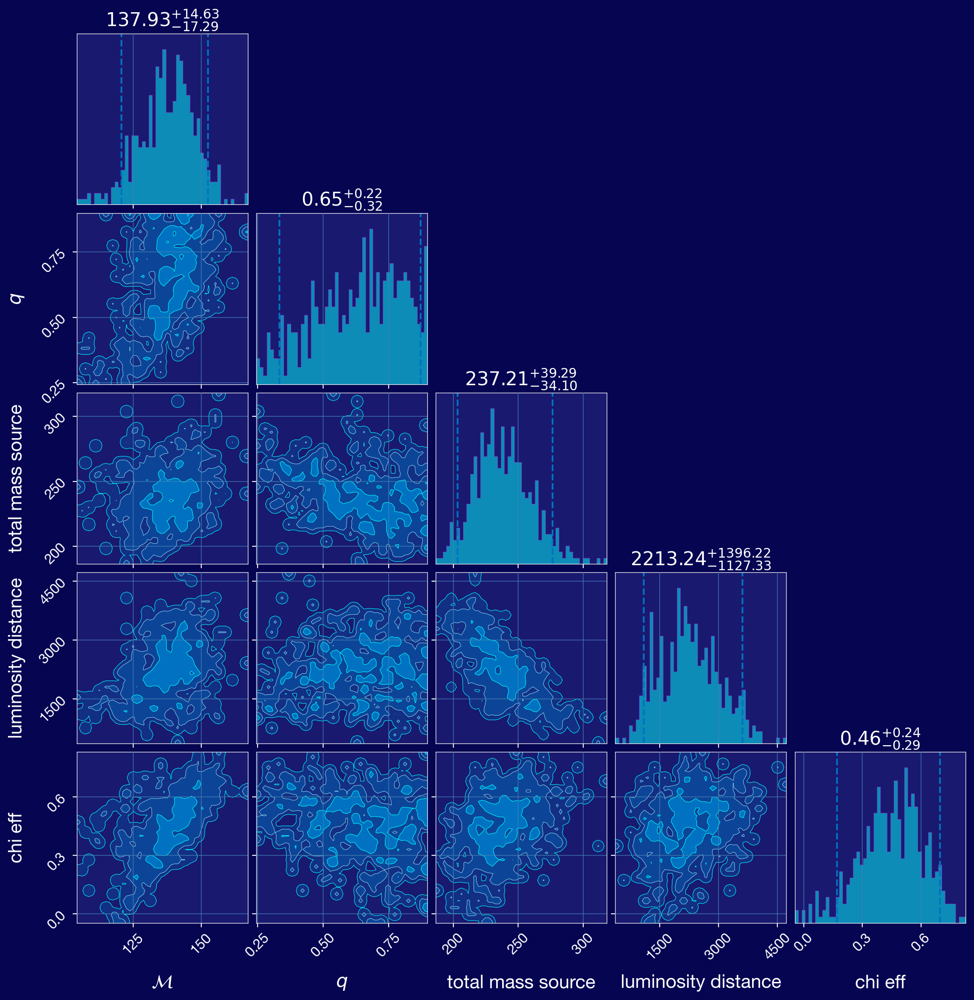

In [440]:
result_short_2.plot_corner(
    parameters=["chirp_mass", "mass_ratio", "total_mass_source", "luminosity_distance", "chi_eff"],
    prior=True,
    hist_kwargs={
        "density": True,
        "color": "cyan",
        "alpha": 0.5,
        "histtype": "stepfilled",
        "edgecolor": 'magenta',
        "linewidth": 0.3
    },
    quantiles=[0.05, 0.95],
    title_quantiles=[0.05, 0.5, 0.95],
    contour_kwargs={"linewidths": 0.4, "colors": ["cyan", "skyblue"]},
    fig=plt.figure(figsize=(12, 12), dpi=200)
)

In [426]:
fig = plt.figure(figsize=(12, 12), dpi=200)

result_short_2.plot_corner(
    parameters=["chirp_mass", "mass_ratio", "total_mass_source", "luminosity_distance", "chi_eff"],
    prior=True,
    hist_kwargs={
        "density": True,
        "color": "cyan",
        "alpha": 0.5,
        "histtype": "stepfilled",
        "edgecolor": 'magenta',
        "linewidth": 0.3
    },
    quantiles=[0.05, 0.95],
    title_quantiles=[0.05, 0.5, 0.95],
    contour_kwargs={"linewidths": 0.3, "colors": ["cyan", "skyblue"]},
    fig=fig
)

fig.suptitle("Posterior distributions — GW231123 (IMRPhenomXP)", 
             fontsize=14, y=1.02)
plt.show()

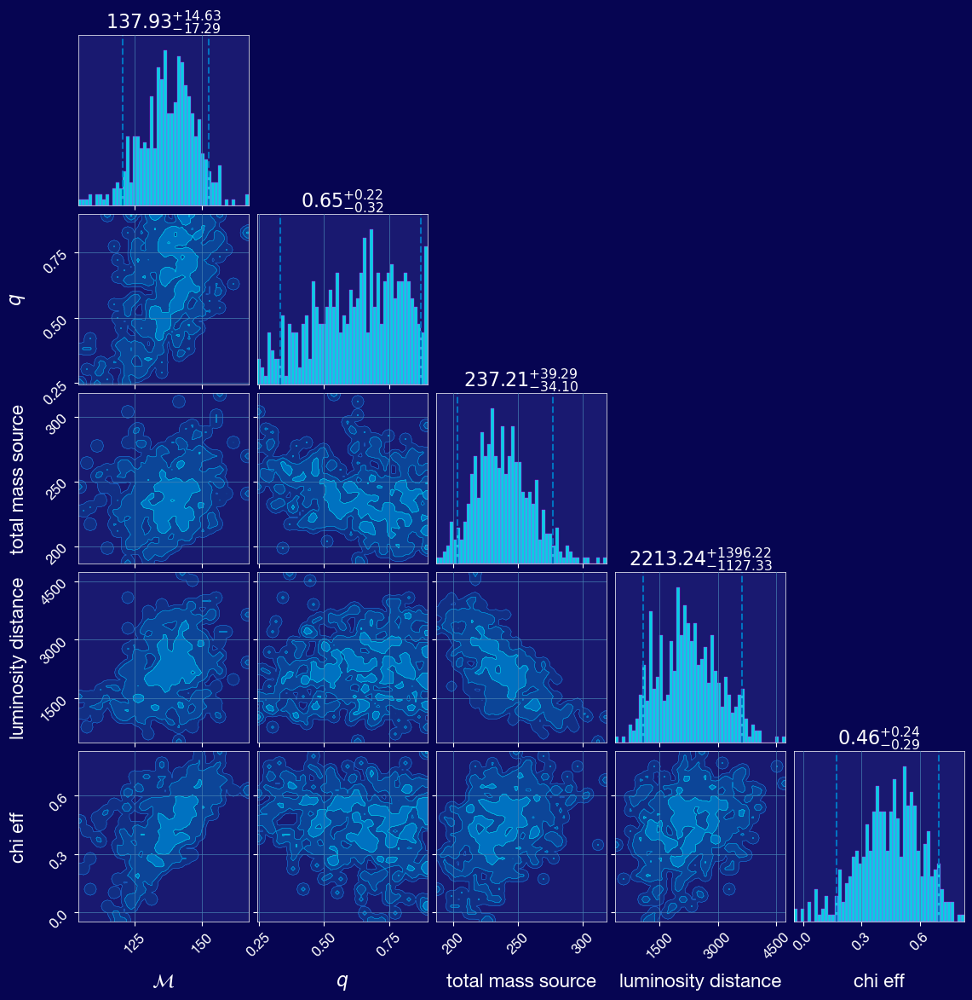

In [479]:
dpi=200
result_short_2.plot_corner(parameters=["chirp_mass", "mass_ratio", "total_mass_source", "luminosity_distance", "chi_eff"], 
                           prior=True, 
                           hist_kwargs={"density": True, "color": "cyan", "alpha": 0.8, "histtype": "bar", "edgecolor": 'magenta', 'linewidth': 0.3}, 
                           quantiles=[0.05, 0.95], 
                           contour_kwargs={"linewidths": 0.3, "colors": ["dodgerblue", "deepskyblue", "cyan"]}, )

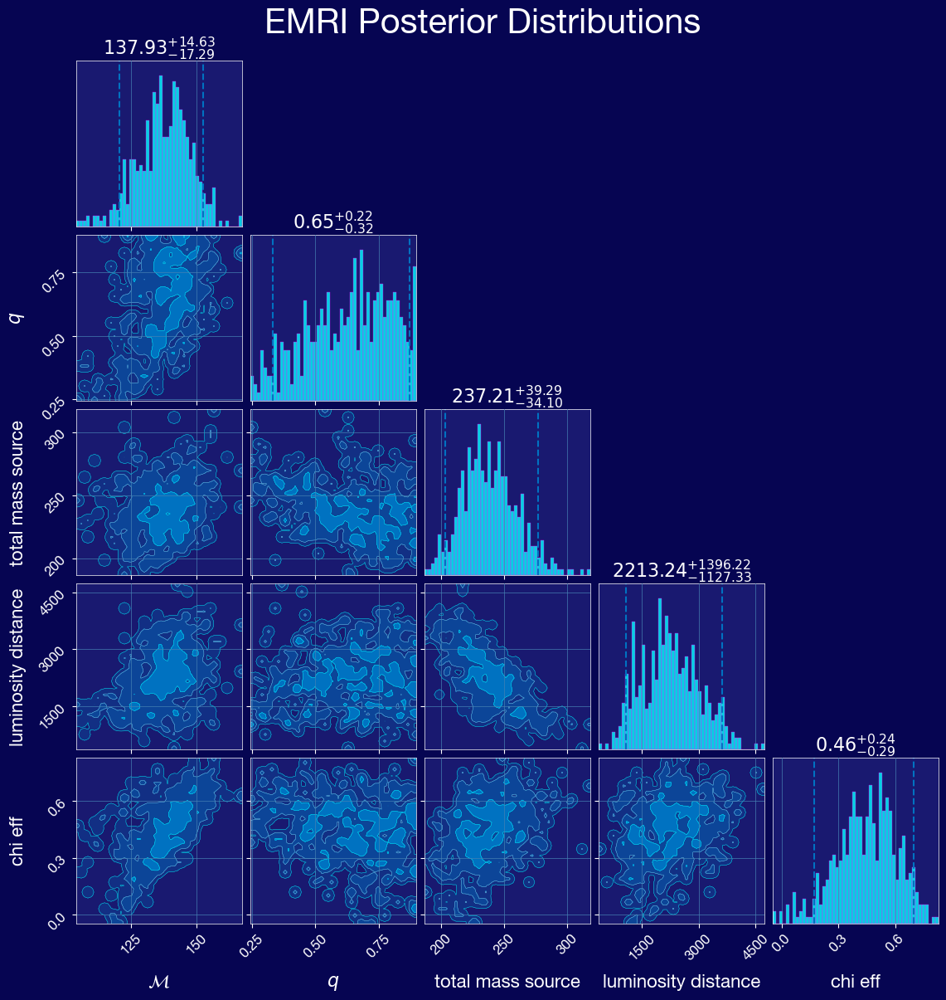

In [484]:
dpi=300
fig = result_short_2.plot_corner(
    parameters=[
        "chirp_mass",
        "mass_ratio",
        "total_mass_source",
        "luminosity_distance",
        "chi_eff"
    ],
    prior=True,
    hist_kwargs={
        "density": True,
        "color": "cyan",
        "alpha": 0.8,
        "histtype": "bar",
        "edgecolor": "magenta",
        "linewidth": 0.3,},
    quantiles=[0.05, 0.95],
    contour_kwargs={
        "linewidths": 0.3,
        "colors": ["cyan", "skyblue"]
    }
)

fig.suptitle(
    "EMRI Posterior Distributions",
    fontsize=30,
    y=1.02
)

fig

In [469]:
import inspect
print(inspect.signature(result_short_2.plot_corner))

(parameters=None, priors=None, titles=True, save=True, filename=None, dpi=300, **kwargs)


In [470]:
help(result_short_2.plot_corner)

Help on method plot_corner in module bilby.core.result:

plot_corner(parameters=None, priors=None, titles=True, save=True, filename=None, dpi=300, **kwargs) method of bilby.core.result.Result instance
    Plot a corner-plot
    
    Parameters
    parameters: (list, dict), optional
        If given, either a list of the parameter names to include, or a
        dictionary of parameter names and their "true" values to plot.
    priors: {bool (False), bilby.core.prior.PriorDict}
        If true, add the stored prior probability density functions to the
        one-dimensional marginal distributions. If instead a PriorDict
        is provided, this will be plotted.
    titles: bool
        If true, add 1D titles of the median and (by default 1-sigma)
        error bars. To change the error bars, pass in the quantiles kwarg.
        See method `get_one_dimensional_median_and_error_bar` for further
        details). If `quantiles=None` is passed in, no title is added.
    save: bool, optiona

In [ ]:
import corner


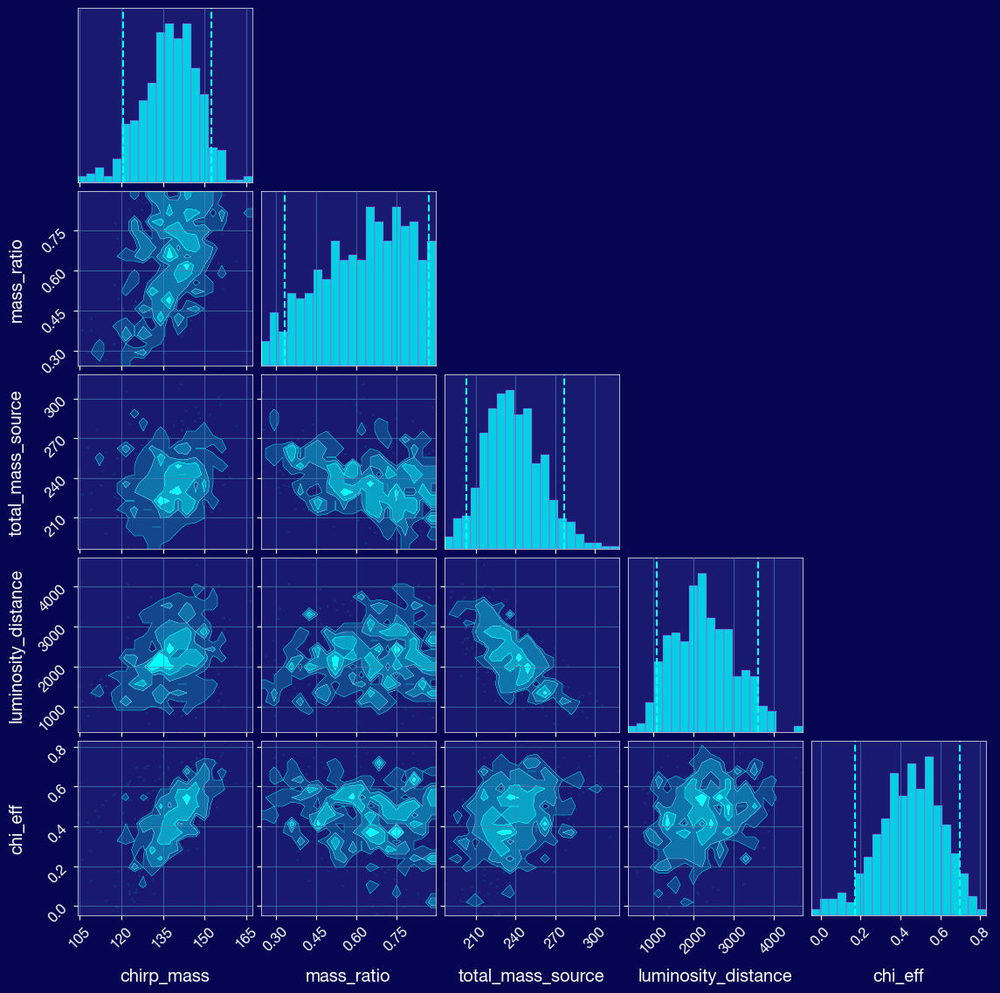

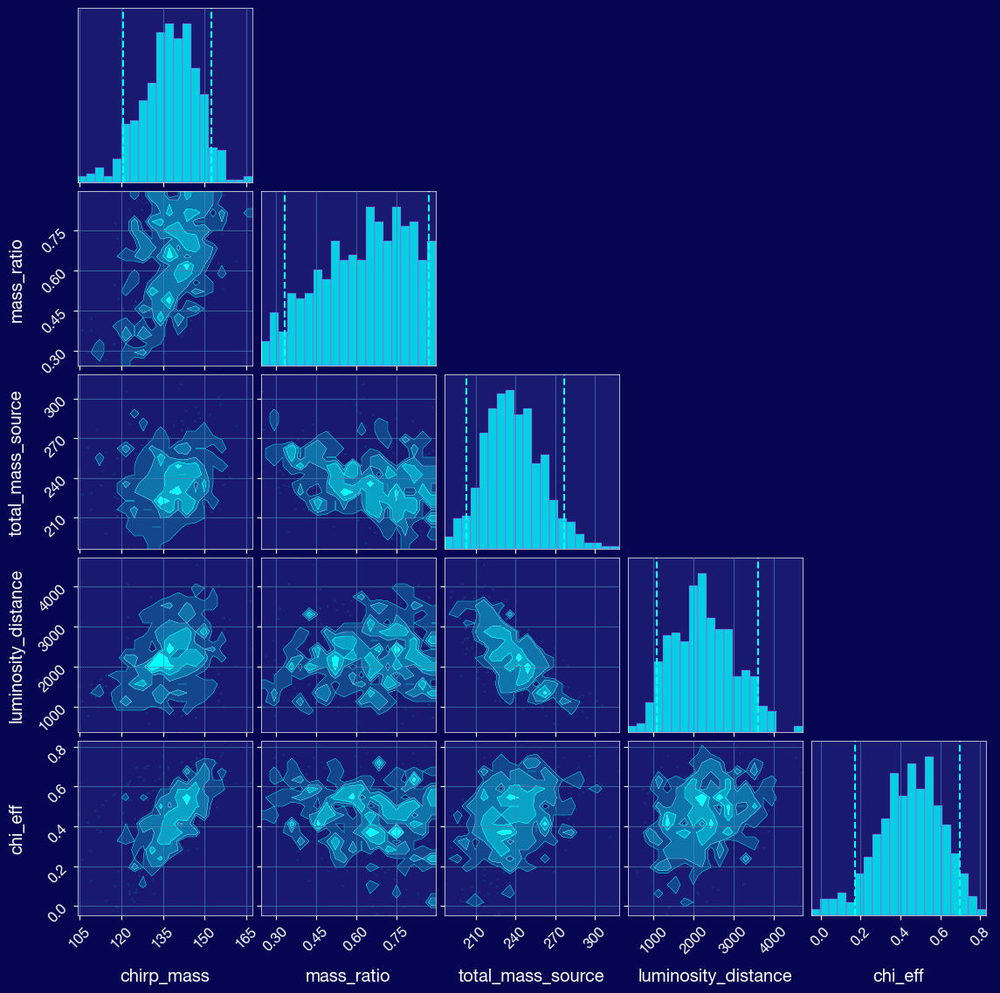

In [472]:
samples = result_short_2.posterior[
    ["chirp_mass",
     "mass_ratio",
     "total_mass_source",
     "luminosity_distance",
     "chi_eff"]
]

import corner

corner.corner(
    samples,
    color="cyan",
    fill_contours=True,
    hist_kwargs={"density": True, "color": "cyan", "alpha": 0.8, "histtype": "bar", "edgecolor": 'magenta', 'linewidth': 0.3}, 
                           quantiles=[0.05, 0.95], 
                           contour_kwargs={"linewidths": 0.3, "colors": ["cyan", "skyblue"]}, 
                           ontourf_kwargs={"colors": ['cyan', 'skyblue'], "alpha": 1})


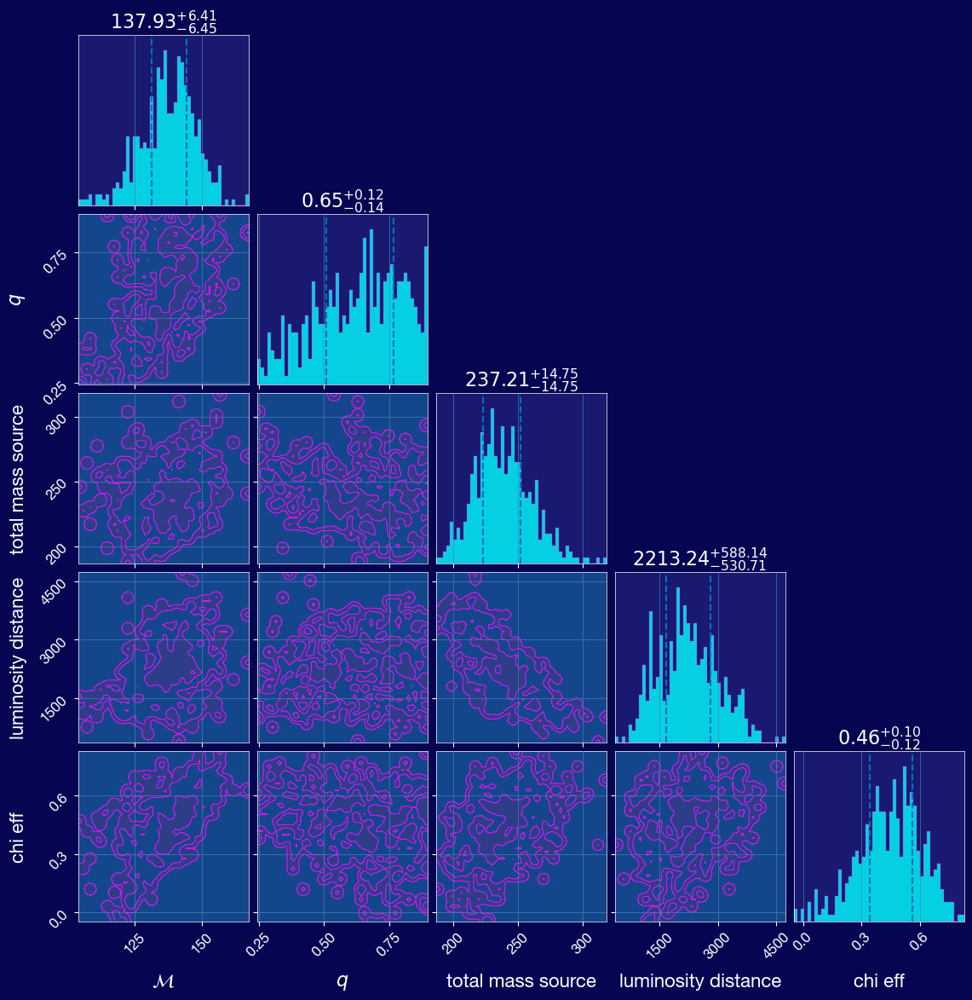

In [415]:
dpi=200
result_short_2.plot_corner(parameters=["chirp_mass", "mass_ratio", "total_mass_source", "luminosity_distance", "chi_eff"], 
                           prior=True, 
                           hist_kwargs={"density": True, "color": "cyan", "alpha": 0.8, "histtype": "stepfilled", "edgecolor": 'magenta', 'linewidth': 0.3}, 
                           quantiles=[0.25, 0.75], 
                           contour_kwargs={"linewidths": 0.7, 'colors':'magenta'},
                           plot_density=True,
                           contourf_kwargs={"colors": ["cyan", "skyblue"], "alpha":0.2},
)


#                             quantiles=[0.05, 0.5, 0.95])



#                            result_short.plot_corner(
#     parameters=["chirp_mass", "mass_ratio", "luminosity_distance"],
#     color='steelblue',
#     hist_kwargs={
#         "density": True,
#         "color": "steelblue",
#         "alpha": 0.5,
#         "histtype": "stepfilled",
#         "edgecolor": "steelblue",
#         "linewidth": 1.5
#     },
#     contour_kwargs={"linewidths": 1.5},
#     quantiles=[0.05, 0.5, 0.95],
#     show_titles=True,   # shows the quantile values as titles above each 1D histogram
#     fig=plt.figure(figsize=(10, 10)),
# ))


In [ ]:
import arviz 

ImportError: cannot import name 'plot_corner' from 'arviz' (/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/arviz/__init__.py)

In [375]:
result_short_2.plot_corner?

Signature:
result_short_2.plot_corner(
    parameters=None,
    priors=None,
    titles=True,
    save=True,
    filename=None,
    dpi=300,
    **kwargs,
)
Docstring:
Plot a corner-plot

Parameters
parameters: (list, dict), optional
    If given, either a list of the parameter names to include, or a
    dictionary of parameter names and their "true" values to plot.
priors: {bool (False), bilby.core.prior.PriorDict}
    If true, add the stored prior probability density functions to the
    one-dimensional marginal distributions. If instead a PriorDict
    is provided, this will be plotted.
titles: bool
    If true, add 1D titles of the median and (by default 1-sigma)
    error bars. To change the error bars, pass in the quantiles kwarg.
    See method `get_one_dimensional_median_and_error_bar` for further
    details). If `quantiles=None` is passed in, no title is added.
save: bool, optional
    If true, save the image using the given label and outdir
filename: str, optional
    If giv

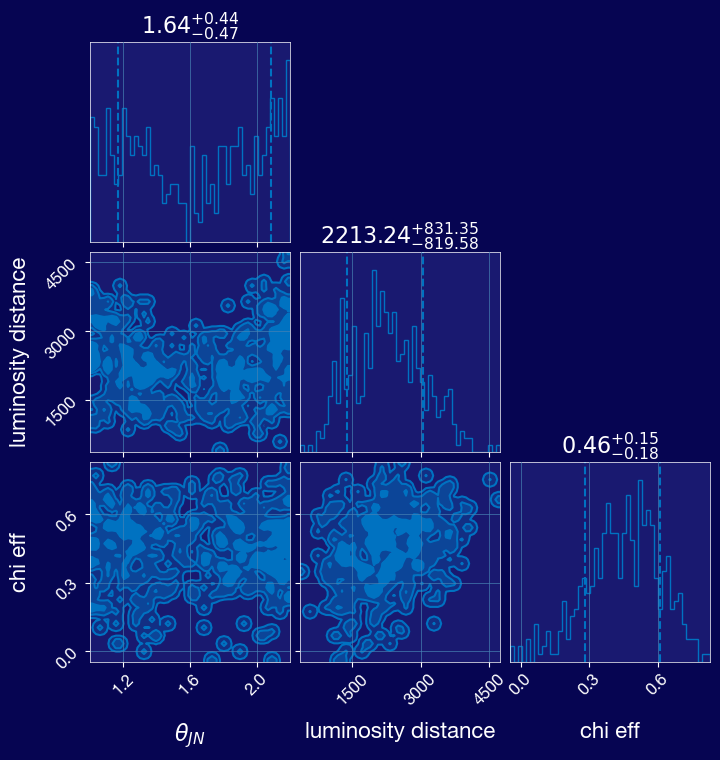

In [386]:
result_short_2.plot_corner(parameters=["theta_jn", "luminosity_distance", "chi_eff"], prior=True)


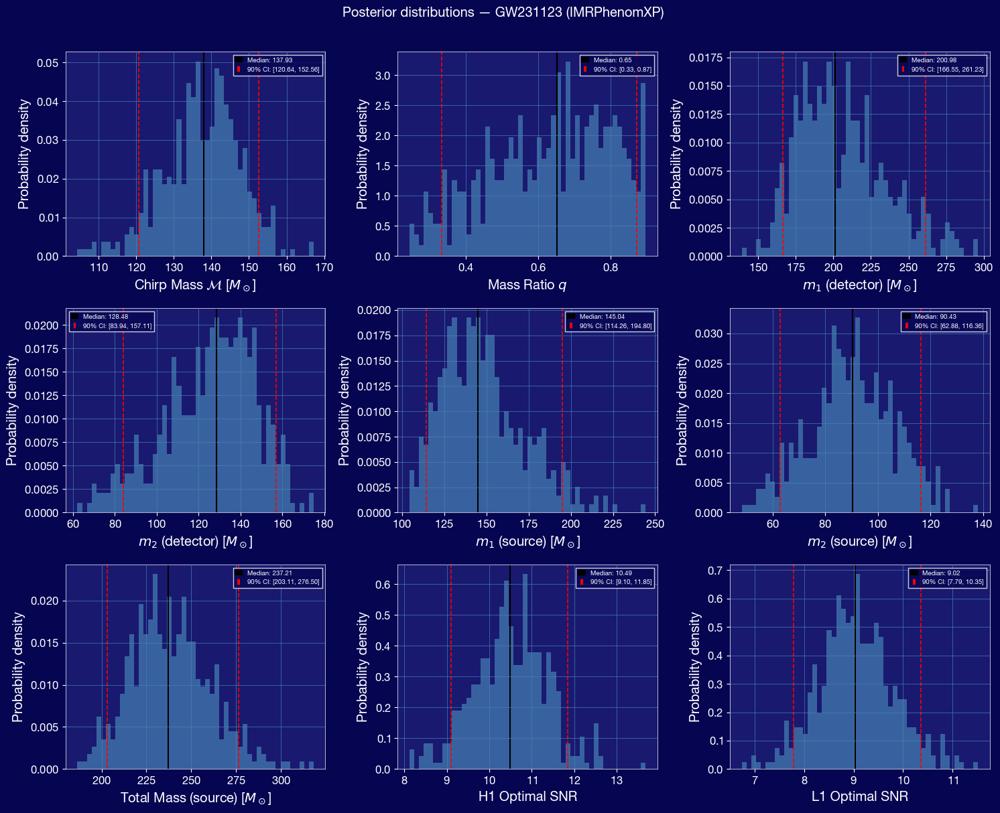

In [325]:
# Compute the 90% credible interval and the median of the distribution for the chirp mass and mass ratio.

# Use np.quantile to get 5%, 50%, 95% intervals
Mchirp = result_short_2.posterior["chirp_mass"].values
q = result_short_2.posterior["mass_ratio"].values
mass_1 = result_short_2.posterior['mass_1'].values
mass_2 = result_short_2.posterior['mass_2'].values
mass_1_source = result_short_2.posterior['mass_1_source'].values
mass_2_source = result_short_2.posterior['mass_2_source'].values
total_mass_source = result_short_2.posterior['total_mass_source'].values
H1_optimal_snr = result_short_2.posterior['H1_optimal_snr'].values
L1_optimal_snr = result_short_2.posterior['L1_optimal_snr'].values

# # Calculate the 5%, 50%, 95% quantiles of the total mass distribution and plot the histograms with clear indication of the credible intervals.

# Calculate the 5%, 50%, 95% quantiles

# Mchirp
lower_bound_Mchirp = np.quantile(Mchirp, 0.05)
median_Mchirp = np.quantile(Mchirp, 0.50)
upper_bound_Mchirp = np.quantile(Mchirp, 0.95)
# q
lower_bound_q = np.quantile(q, 0.05)
median_q = np.quantile(q, 0.50)
upper_bound_q = np.quantile(q, 0.95)
# mass_1 
lower_bound_mass_1 = np.quantile(mass_1, 0.05)
median_mass_1 = np.quantile(mass_1, 0.50)
upper_bound_mass_1 = np.quantile(mass_1, 0.95)
# mass_2
lower_bound_mass_2 = np.quantile(mass_2, 0.05)
median_mass_2 = np.quantile(mass_2, 0.50)
upper_bound_mass_2 = np.quantile(mass_2, 0.95)
# mass_1_source
lower_bound_mass_1_source = np.quantile(mass_1_source, 0.05)
median_mass_1_source = np.quantile(mass_1_source, 0.50)
upper_bound_mass_1_source = np.quantile(mass_1_source, 0.95)
# mass_2_source
lower_bound_mass_2_source = np.quantile(mass_2_source, 0.05)
median_mass_2_source = np.quantile(mass_2_source, 0.50)
upper_bound_mass_2_source = np.quantile(mass_2_source, 0.95)
# total_mass_source
lower_bound_total_mass_source = np.quantile(total_mass_source, 0.05)
median_total_mass_source = np.quantile(total_mass_source, 0.50)
upper_bound_total_mass_source = np.quantile(total_mass_source, 0.95)
# H1_optimal_SNR
lower_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.05)
median_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.50)
upper_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.95)
# L1_optimal_SNR
lower_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.05)
median_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.50)
upper_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.95)

params = {
    r'Chirp Mass $\mathcal{M}$ [$M_\odot$]': (Mchirp, lower_bound_Mchirp, median_Mchirp, upper_bound_Mchirp),
    r'Mass Ratio $q$': (q, lower_bound_q, median_q, upper_bound_q),
    r'$m_1$ (detector) [$M_\odot$]': (mass_1, lower_bound_mass_1, median_mass_1, upper_bound_mass_1),
    r'$m_2$ (detector) [$M_\odot$]': (mass_2, lower_bound_mass_2, median_mass_2, upper_bound_mass_2),
    r'$m_1$ (source) [$M_\odot$]': (mass_1_source, lower_bound_mass_1_source, median_mass_1_source, upper_bound_mass_1_source),
    r'$m_2$ (source) [$M_\odot$]': (mass_2_source, lower_bound_mass_2_source, median_mass_2_source, upper_bound_mass_2_source),
    r'Total Mass (source) [$M_\odot$]': (total_mass_source, lower_bound_total_mass_source, median_total_mass_source, upper_bound_total_mass_source),
    r'H1 Optimal SNR': (H1_optimal_snr, lower_bound_H1_optimal_snr, median_H1_optimal_snr, upper_bound_H1_optimal_snr),
    r'L1 Optimal SNR': (L1_optimal_snr, lower_bound_L1_optimal_snr, median_L1_optimal_snr, upper_bound_L1_optimal_snr),
}

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for ax, (label, (data, lo, med, hi)) in zip(axes, params.items()):
    ax.hist(data, bins=50, density=True, color='steelblue', alpha=0.7)
    ax.axvline(med, color='k', linestyle='-', linewidth=1.5, label=f'Median: {med:.2f}')
    ax.axvline(lo, color='r', linestyle='--', linewidth=1.2)
    ax.axvline(hi, color='r', linestyle='--', linewidth=1.2, label=f'90% CI: [{lo:.2f}, {hi:.2f}]')
    ax.set_xlabel(label)
    ax.set_ylabel('Probability density')
    ax.legend(fontsize=7)

plt.suptitle('Posterior distributions — GW231123 (IMRPhenomXP)', y=1.01)
plt.tight_layout()
plt.show()

In [326]:
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', 
    reference_frequency=10., 
    minimum_frequency=20,
    catch_waveform_errors=True)

waveform_generator = bilby.gw.WaveformGenerator(
    duration=duration,
    sampling_frequency=sampling_frequency,
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters
)



In [335]:

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()
prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=0.6*Mc_low, maximum=1.6*Mc_high) # make these a bit tighter, 30% from the actual value
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.5*q_abac_low, maximum=0.9) # same thing ^ 
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
prior['ra'] = bilby.core.prior.Uniform(name='ra', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['dec'] = bilby.core.prior.Cosine(name='dec')

prior['theta_jn'] = bilby.core.prior.Uniform(name='theta_jn', minimum=1.6-0.6, maximum=1.6+0.6)
prior['psi'] = bilby.core.prior.Uniform(name='psi', minimum=0, maximum=np.pi, boundary='periodic')

prior['luminosity_distance'] = bilby.gw.prior.UniformSourceFrame(
    name='luminosity_distance', minimum=100.0, maximum=5000.0, unit='Mpc', latex_label='$d_L$')

prior['a_1'] = bilby.core.prior.Uniform(name='a_1', minimum=0.0, maximum=0.99)
prior['a_2'] = bilby.core.prior.Uniform(name='a_2', minimum=0.0, maximum=0.99)

prior['tilt_1'] = bilby.core.prior.Sine(name='tilt_1', minimum=0, maximum=np.pi)
prior['tilt_2'] = bilby.core.prior.Sine(name='tilt_2', minimum=0, maximum=np.pi)
prior['phi_12'] = bilby.core.prior.Uniform(name='phi_12', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['phi_jl'] = bilby.core.prior.Uniform(name='phi_jl', minimum=0, maximum=2*np.pi, boundary='periodic')
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood5 = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)


In [331]:
result_short_5 = bilby.run_sampler(
    likelihood5,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW150914",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=250,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
    npool=8
)

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
03:17 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

  0%|          | 0/204 [00:00<?, ?it/s]

03:17 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


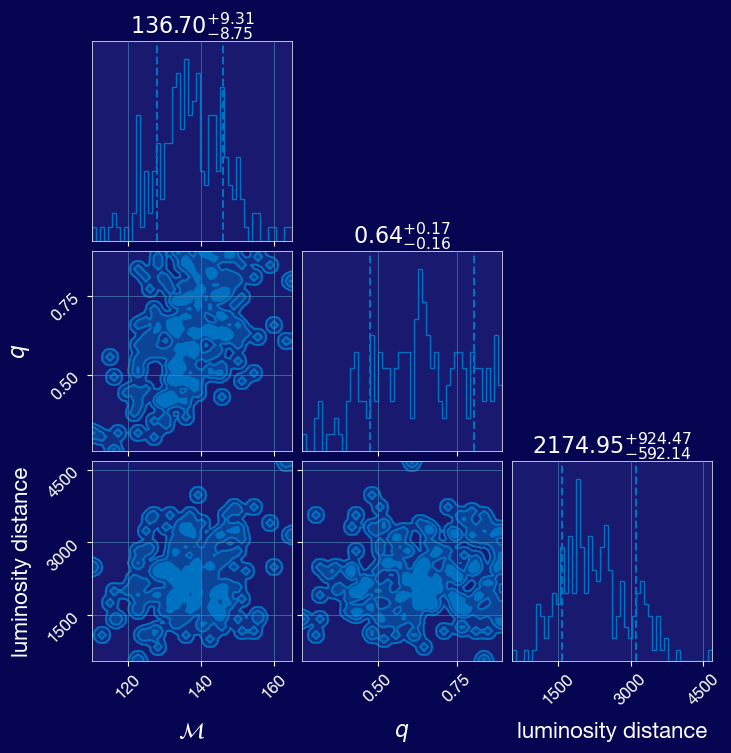

In [332]:
result_short_5.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)


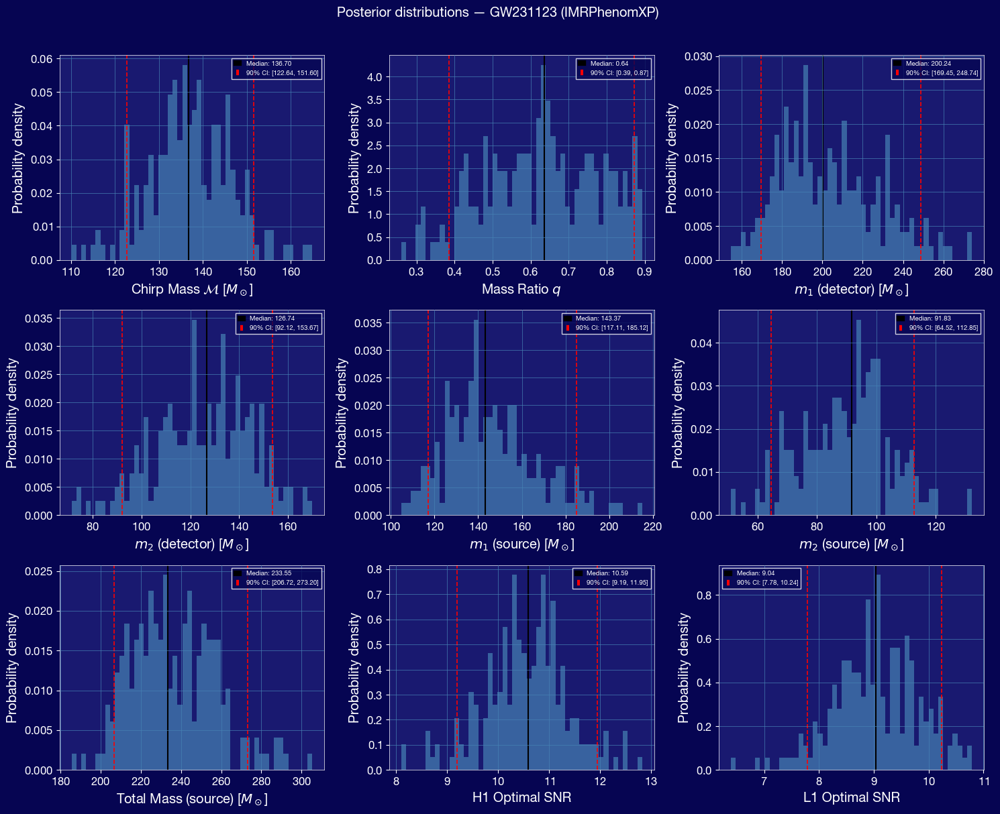

In [333]:
# Compute the 90% credible interval and the median of the distribution for the chirp mass and mass ratio.

# Use np.quantile to get 5%, 50%, 95% intervals
Mchirp = result_short_5.posterior["chirp_mass"].values
q = result_short_5.posterior["mass_ratio"].values
mass_1 = result_short_5.posterior['mass_1'].values
mass_2 = result_short_5.posterior['mass_2'].values
mass_1_source = result_short_5.posterior['mass_1_source'].values
mass_2_source = result_short_5.posterior['mass_2_source'].values
total_mass_source = result_short_5.posterior['total_mass_source'].values
H1_optimal_snr = result_short_5.posterior['H1_optimal_snr'].values
L1_optimal_snr = result_short_5.posterior['L1_optimal_snr'].values

# # Calculate the 5%, 50%, 95% quantiles of the total mass distribution and plot the histograms with clear indication of the credible intervals.

# Calculate the 5%, 50%, 95% quantiles

# Mchirp
lower_bound_Mchirp = np.quantile(Mchirp, 0.05)
median_Mchirp = np.quantile(Mchirp, 0.50)
upper_bound_Mchirp = np.quantile(Mchirp, 0.95)
# q
lower_bound_q = np.quantile(q, 0.05)
median_q = np.quantile(q, 0.50)
upper_bound_q = np.quantile(q, 0.95)
# mass_1 
lower_bound_mass_1 = np.quantile(mass_1, 0.05)
median_mass_1 = np.quantile(mass_1, 0.50)
upper_bound_mass_1 = np.quantile(mass_1, 0.95)
# mass_2
lower_bound_mass_2 = np.quantile(mass_2, 0.05)
median_mass_2 = np.quantile(mass_2, 0.50)
upper_bound_mass_2 = np.quantile(mass_2, 0.95)
# mass_1_source
lower_bound_mass_1_source = np.quantile(mass_1_source, 0.05)
median_mass_1_source = np.quantile(mass_1_source, 0.50)
upper_bound_mass_1_source = np.quantile(mass_1_source, 0.95)
# mass_2_source
lower_bound_mass_2_source = np.quantile(mass_2_source, 0.05)
median_mass_2_source = np.quantile(mass_2_source, 0.50)
upper_bound_mass_2_source = np.quantile(mass_2_source, 0.95)
# total_mass_source
lower_bound_total_mass_source = np.quantile(total_mass_source, 0.05)
median_total_mass_source = np.quantile(total_mass_source, 0.50)
upper_bound_total_mass_source = np.quantile(total_mass_source, 0.95)
# H1_optimal_SNR
lower_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.05)
median_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.50)
upper_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.95)
# L1_optimal_SNR
lower_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.05)
median_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.50)
upper_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.95)

params = {
    r'Chirp Mass $\mathcal{M}$ [$M_\odot$]': (Mchirp, lower_bound_Mchirp, median_Mchirp, upper_bound_Mchirp),
    r'Mass Ratio $q$': (q, lower_bound_q, median_q, upper_bound_q),
    r'$m_1$ (detector) [$M_\odot$]': (mass_1, lower_bound_mass_1, median_mass_1, upper_bound_mass_1),
    r'$m_2$ (detector) [$M_\odot$]': (mass_2, lower_bound_mass_2, median_mass_2, upper_bound_mass_2),
    r'$m_1$ (source) [$M_\odot$]': (mass_1_source, lower_bound_mass_1_source, median_mass_1_source, upper_bound_mass_1_source),
    r'$m_2$ (source) [$M_\odot$]': (mass_2_source, lower_bound_mass_2_source, median_mass_2_source, upper_bound_mass_2_source),
    r'Total Mass (source) [$M_\odot$]': (total_mass_source, lower_bound_total_mass_source, median_total_mass_source, upper_bound_total_mass_source),
    r'H1 Optimal SNR': (H1_optimal_snr, lower_bound_H1_optimal_snr, median_H1_optimal_snr, upper_bound_H1_optimal_snr),
    r'L1 Optimal SNR': (L1_optimal_snr, lower_bound_L1_optimal_snr, median_L1_optimal_snr, upper_bound_L1_optimal_snr),
}

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for ax, (label, (data, lo, med, hi)) in zip(axes, params.items()):
    ax.hist(data, bins=50, density=True, color='steelblue', alpha=0.7)
    ax.axvline(med, color='k', linestyle='-', linewidth=1.5, label=f'Median: {med:.2f}')
    ax.axvline(lo, color='r', linestyle='--', linewidth=1.2)
    ax.axvline(hi, color='r', linestyle='--', linewidth=1.2, label=f'90% CI: [{lo:.2f}, {hi:.2f}]')
    ax.set_xlabel(label)
    ax.set_ylabel('Probability density')
    ax.legend(fontsize=7)

plt.suptitle('Posterior distributions — GW231123 (IMRPhenomXP)', y=1.01)
plt.tight_layout()
plt.show()

In [336]:

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()
prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=0.6*Mc_low, maximum=1.6*Mc_high) # make these a bit tighter, 30% from the actual value
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.5*q_abac_low, maximum=0.9) # same thing ^ 
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
prior['ra'] = bilby.core.prior.Uniform(name='ra', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['dec'] = bilby.core.prior.Cosine(name='dec')

prior['theta_jn'] = bilby.core.prior.Uniform(name='theta_jn', minimum=1.6-0.6, maximum=1.6+0.6)
prior['psi'] = bilby.core.prior.Uniform(name='psi', minimum=0, maximum=np.pi, boundary='periodic')

prior['luminosity_distance'] = bilby.gw.prior.UniformSourceFrame(
    name='luminosity_distance', minimum=100.0, maximum=5000.0, unit='Mpc', latex_label='$d_L$')

prior['a_1'] = bilby.core.prior.Uniform(name='a_1', minimum=0.0, maximum=0.99)
prior['a_2'] = bilby.core.prior.Uniform(name='a_2', minimum=0.0, maximum=0.99)

prior['tilt_1'] = bilby.core.prior.Sine(name='tilt_1', minimum=0, maximum=np.pi)
prior['tilt_2'] = bilby.core.prior.Sine(name='tilt_2', minimum=0, maximum=np.pi)
prior['phi_12'] = bilby.core.prior.Uniform(name='phi_12', minimum=0, maximum=2*np.pi, boundary='periodic')
prior['phi_jl'] = bilby.core.prior.Uniform(name='phi_jl', minimum=0, maximum=2*np.pi, boundary='periodic')
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood6 = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)

In [337]:
result_short_6 = bilby.run_sampler(
    likelihood6,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW150914",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=500,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
    npool=8
)

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
03:49 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/407 [00:00<?, ?it/s]

  0%|          | 0/407 [00:00<?, ?it/s]

  0%|          | 0/407 [00:00<?, ?it/s]

03:49 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


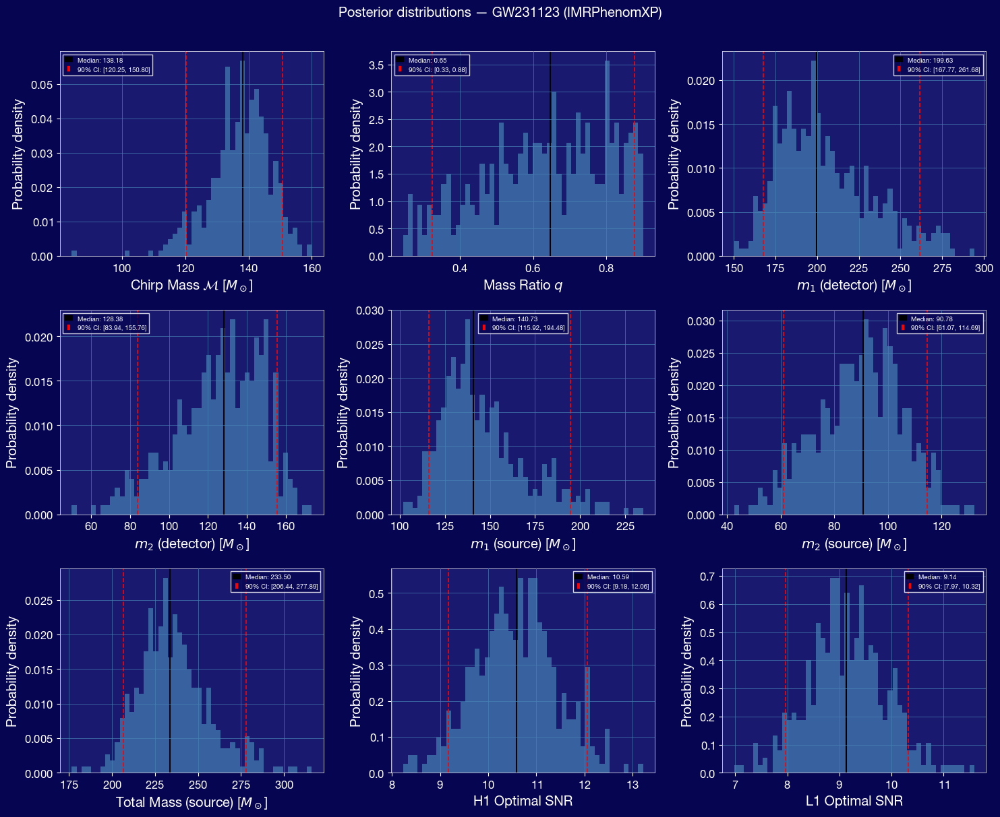

In [338]:
# Compute the 90% credible interval and the median of the distribution for the chirp mass and mass ratio.

# Use np.quantile to get 5%, 50%, 95% intervals
Mchirp = result_short_6.posterior["chirp_mass"].values
q = result_short_6.posterior["mass_ratio"].values
mass_1 = result_short_6.posterior['mass_1'].values
mass_2 = result_short_6.posterior['mass_2'].values
mass_1_source = result_short_6.posterior['mass_1_source'].values
mass_2_source = result_short_6.posterior['mass_2_source'].values
total_mass_source = result_short_6.posterior['total_mass_source'].values
H1_optimal_snr = result_short_6.posterior['H1_optimal_snr'].values
L1_optimal_snr = result_short_6.posterior['L1_optimal_snr'].values

# # Calculate the 5%, 50%, 95% quantiles of the total mass distribution and plot the histograms with clear indication of the credible intervals.

# Calculate the 5%, 50%, 95% quantiles

# Mchirp
lower_bound_Mchirp = np.quantile(Mchirp, 0.05)
median_Mchirp = np.quantile(Mchirp, 0.50)
upper_bound_Mchirp = np.quantile(Mchirp, 0.95)
# q
lower_bound_q = np.quantile(q, 0.05)
median_q = np.quantile(q, 0.50)
upper_bound_q = np.quantile(q, 0.95)
# mass_1 
lower_bound_mass_1 = np.quantile(mass_1, 0.05)
median_mass_1 = np.quantile(mass_1, 0.50)
upper_bound_mass_1 = np.quantile(mass_1, 0.95)
# mass_2
lower_bound_mass_2 = np.quantile(mass_2, 0.05)
median_mass_2 = np.quantile(mass_2, 0.50)
upper_bound_mass_2 = np.quantile(mass_2, 0.95)
# mass_1_source
lower_bound_mass_1_source = np.quantile(mass_1_source, 0.05)
median_mass_1_source = np.quantile(mass_1_source, 0.50)
upper_bound_mass_1_source = np.quantile(mass_1_source, 0.95)
# mass_2_source
lower_bound_mass_2_source = np.quantile(mass_2_source, 0.05)
median_mass_2_source = np.quantile(mass_2_source, 0.50)
upper_bound_mass_2_source = np.quantile(mass_2_source, 0.95)
# total_mass_source
lower_bound_total_mass_source = np.quantile(total_mass_source, 0.05)
median_total_mass_source = np.quantile(total_mass_source, 0.50)
upper_bound_total_mass_source = np.quantile(total_mass_source, 0.95)
# H1_optimal_SNR
lower_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.05)
median_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.50)
upper_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.95)
# L1_optimal_SNR
lower_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.05)
median_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.50)
upper_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.95)

params = {
    r'Chirp Mass $\mathcal{M}$ [$M_\odot$]': (Mchirp, lower_bound_Mchirp, median_Mchirp, upper_bound_Mchirp),
    r'Mass Ratio $q$': (q, lower_bound_q, median_q, upper_bound_q),
    r'$m_1$ (detector) [$M_\odot$]': (mass_1, lower_bound_mass_1, median_mass_1, upper_bound_mass_1),
    r'$m_2$ (detector) [$M_\odot$]': (mass_2, lower_bound_mass_2, median_mass_2, upper_bound_mass_2),
    r'$m_1$ (source) [$M_\odot$]': (mass_1_source, lower_bound_mass_1_source, median_mass_1_source, upper_bound_mass_1_source),
    r'$m_2$ (source) [$M_\odot$]': (mass_2_source, lower_bound_mass_2_source, median_mass_2_source, upper_bound_mass_2_source),
    r'Total Mass (source) [$M_\odot$]': (total_mass_source, lower_bound_total_mass_source, median_total_mass_source, upper_bound_total_mass_source),
    r'H1 Optimal SNR': (H1_optimal_snr, lower_bound_H1_optimal_snr, median_H1_optimal_snr, upper_bound_H1_optimal_snr),
    r'L1 Optimal SNR': (L1_optimal_snr, lower_bound_L1_optimal_snr, median_L1_optimal_snr, upper_bound_L1_optimal_snr),
}

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for ax, (label, (data, lo, med, hi)) in zip(axes, params.items()):
    ax.hist(data, bins=50, density=True, color='steelblue', alpha=0.7)
    ax.axvline(med, color='k', linestyle='-', linewidth=1.5, label=f'Median: {med:.2f}')
    ax.axvline(lo, color='r', linestyle='--', linewidth=1.2)
    ax.axvline(hi, color='r', linestyle='--', linewidth=1.2, label=f'90% CI: [{lo:.2f}, {hi:.2f}]')
    ax.set_xlabel(label)
    ax.set_ylabel('Probability density')
    ax.legend(fontsize=7)

plt.suptitle('Posterior distributions — GW231123 (IMRPhenomXP)', y=1.01)
plt.tight_layout()
plt.show()

In [370]:
result_short_6.plot_corner?

Signature:
result_short_6.plot_corner(
    parameters=None,
    priors=None,
    titles=True,
    save=True,
    filename=None,
    dpi=300,
    **kwargs,
)
Docstring:
Plot a corner-plot

Parameters
parameters: (list, dict), optional
    If given, either a list of the parameter names to include, or a
    dictionary of parameter names and their "true" values to plot.
priors: {bool (False), bilby.core.prior.PriorDict}
    If true, add the stored prior probability density functions to the
    one-dimensional marginal distributions. If instead a PriorDict
    is provided, this will be plotted.
titles: bool
    If true, add 1D titles of the median and (by default 1-sigma)
    error bars. To change the error bars, pass in the quantiles kwarg.
    See method `get_one_dimensional_median_and_error_bar` for further
    details). If `quantiles=None` is passed in, no title is added.
save: bool, optional
    If true, save the image using the given label and outdir
filename: str, optional
    If giv

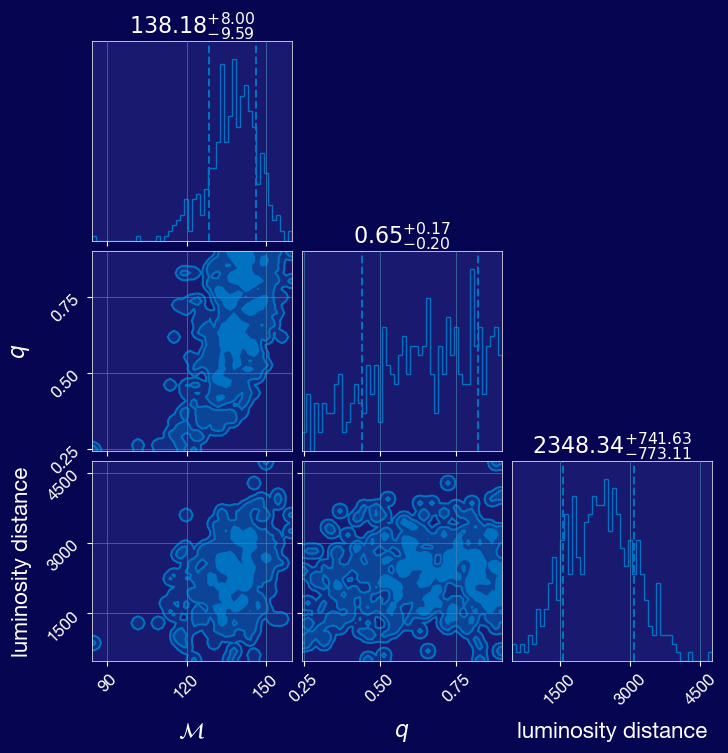

In [339]:
result_short_6.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

In [ ]:
# Source parameter estimation for an event from the fourth observing run

# Consider the same event you've previously selected for matched filtering
# Adjust prior choices and sampler settings as needed
# Produce and interpret plots of posterior parameter distributions
### YOUR CODE GOES HERE

In [88]:
import bilby
from bilby.core.prior import Uniform, PowerLaw
from bilby.gw.conversion import convert_to_lal_binary_black_hole_parameters, generate_all_bbh_parameters
# Next we set up a prior for the analysis

prior = bilby.core.prior.PriorDict()
prior = bilby.core.prior.PriorDict()
# prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=###, maximum=###)  # <-- FILL IN
# prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=###, maximum=###)  # <-- FILL IN
prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
# prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
prior['a_1'] =  0.79
prior['a_2'] =  0.67
prior['tilt_1'] =  0.0
prior['tilt_2'] =  0.0
prior['phi_12'] =  0.0
prior['phi_jl'] =  0.0
prior['dec'] =  0
prior['ra'] =  0
prior['theta_jn'] =  1.6
prior['psi'] =  0
#prior['geocent_time'] = 0
# prior['luminosity_distance'] = PowerLaw(alpha=2, name='luminosity_distance', minimum=50, maximum=2000, unit='Mpc', latex_label='$d_L$')
prior['luminosity_distance'] = PowerLaw(
    alpha=2, 
    name='luminosity_distance', 
    minimum=100, 
    maximum=6000,    # in Mpc, covers the full range across all models
    unit='Mpc', 
    latex_label='$d_L$'
)
prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=50, maximum=150)
prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.125, maximum=1)

prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
# prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)


We now define the likelihood function, which quantifies how well a set of parameters explains the observed data. This is done using `GravitationalWaveTransient`, which compares the strain data to model waveforms. We also enable marginalization over nuisance parameters like phase, time, and distance to speed up sampling.

To generate model waveforms, we use the waveform approximant (`IMRPhenomXP`) as before. The waveform generator will convert sampled parameters into a frequency-domain waveform that can be compared with the data (by way of matched filtering).

In [89]:
# The next step is to set up the likelihood object that evaluates the likelihood between some waveform model (template)
# and the strain data we are analysing

# First, we set up the list of interferometers we want to include in the likelihood calculation
interferometers = [H1, L1]

# Next we need set up the waveform generator that can specify templates at a random point in parameter space
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', reference_frequency=100., catch_waveform_errors=True)

# We now create the waveform_generator object. This also takes care of converting between parameters etc.
waveform_generator = bilby.gw.WaveformGenerator(
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters)

# Finally, we create the likelihood using the GravitationalWaveTransient class
likelihood = bilby.gw.likelihood.GravitationalWaveTransient(
    interferometers, waveform_generator, priors=prior,
    time_marginalization=True, phase_marginalization=True, distance_marginalization=True)

16:22 bilby WARNING : Prior not provided for geocent_time, using the BBH default.


  0%|          | 0/400 [00:00<?, ?it/s]

We run the nested sampler dynesty to explore the posterior distribution. For speed, we use a relatively small number of live points (`nlive=250`) and a loose convergence threshold (`dlogz=1.`). These settings are acceptable for demonstration but would need to be tightened for publication-quality results.

**TO DO: Run the sampler for different `nlive` and `dlogz`. How does this effect the result and run-time?**

#### With `nlive=250`, `dlogz=1`. 

In [71]:
# Let's get sampling!

# Next we need set up the waveform generator that can specify templates at a random point in parameter space
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', 
    reference_frequency=100., 
    minimum_frequency=20,
    catch_waveform_errors=True)

waveform_generator = bilby.gw.WaveformGenerator(
    duration=duration,
    sampling_frequency=sampling_frequency,
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters
)
# approximant = 'IMRPhenomXP'
#  waveform_arguments = dict(
#         reference_frequency=10.0,
#         minimum_frequency=20,
#         waveform_approximant=approximant # so this becomes IMRPhenomXP
#         )
# Run the sampler and observe runtime, posterior width, etc.
result_short = bilby.run_sampler(
    likelihood,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW231123_135430",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=250,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
)

1it [00:00, ?it/s]

15:23 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/283 [00:00<?, ?it/s]

  0%|          | 0/283 [00:00<?, ?it/s]

  0%|          | 0/283 [00:00<?, ?it/s]

15:23 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


In [72]:
# The posterior samples for all parameters are stored as panda data frames.
# Including converted parameters and computed SNR and likelihood values for each sample.
result_short.posterior.keys()

Index(['chirp_mass', 'mass_ratio', 'time_jitter', 'phase', 'a_1', 'a_2',
       'tilt_1', 'tilt_2', 'phi_12', 'phi_jl', 'dec', 'ra', 'theta_jn', 'psi',
       'luminosity_distance', 'geocent_time', 'log_likelihood', 'log_prior',
       'reference_frequency', 'waveform_approximant', 'minimum_frequency',
       'total_mass', 'mass_1', 'mass_2', 'H1_log_likelihood',
       'L1_log_likelihood', 'H1_matched_filter_snr', 'H1_optimal_snr',
       'L1_matched_filter_snr', 'L1_optimal_snr', 'symmetric_mass_ratio',
       'iota', 'spin_1x', 'spin_1y', 'spin_1z', 'spin_2x', 'spin_2y',
       'spin_2z', 'phi_1', 'phi_2', 'chi_eff', 'chi_1_in_plane',
       'chi_2_in_plane', 'chi_p', 'cos_tilt_1', 'cos_tilt_2', 'redshift',
       'comoving_distance', 'mass_1_source', 'mass_2_source',
       'chirp_mass_source', 'total_mass_source'],
      dtype='object')

In [73]:
# Full list of samples:
result_short.posterior

,chirp_mass,mass_ratio,time_jitter,phase,a_1,a_2,tilt_1,tilt_2,phi_12,phi_jl,...,chi_2_in_plane,chi_p,cos_tilt_1,cos_tilt_2,redshift,comoving_distance,mass_1_source,mass_2_source,chirp_mass_source,total_mass_source
0,74.037715,0.931872,0.000244,4.692789,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.842716,2985.776580,47.816347,44.558717,40.178572,92.375064
1,87.719464,0.222519,0.000060,0.062290,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.814690,2908.569465,123.972308,27.586167,48.338546,151.558475
2,75.296847,0.320712,-0.000204,1.822443,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.727048,2658.548357,91.193724,29.246899,43.598572,120.440622
3,59.051595,0.129325,-0.000203,0.298490,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.546171,2098.597277,133.514525,17.266759,38.192151,150.781284
4,113.325023,0.697298,0.000028,0.836079,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.904249,3150.804827,82.130194,57.269187,59.511672,139.399381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
278,69.514222,0.134064,0.000211,3.637072,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.625440,2351.574369,146.434610,19.631538,42.766392,166.066147
279,68.451696,0.129544,-0.000026,4.196674,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.616624,2324.034958,147.878468,19.156808,42.342375,167.035276
280,70.688636,0.136449,0.000148,0.491717,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.535873,2064.831771,155.999053,21.285930,46.025061,177.284984
281,70.324618,0.129356,0.000067,3.884214,0.79,0.67,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.612440,2310.913054,152.446997,19.719877,43.613800,172.166874


In [77]:
# Compute the 90% credible interval and the median of the distribution for the chirp mass and mass ratio.

# Use np.quantile to get 5%, 50%, 95% intervals
Mchirp = result_short.posterior["chirp_mass"].values
q = result_short.posterior["mass_ratio"].values
mass_1 = result_short.posterior['mass_1'].values
mass_2 = result_short.posterior['mass_2'].values
mass_1_source = result_short.posterior['mass_1_source'].values
mass_2_source = result_short.posterior['mass_2_source'].values
total_mass_source = result_short.posterior['total_mass_source'].values
H1_optimal_snr = result_short.posterior['H1_optimal_snr'].values
L1_optimal_snr = result_short.posterior['L1_optimal_snr'].values

# # Calculate the 5%, 50%, 95% quantiles of the total mass distribution and plot the histograms with clear indication of the credible intervals.
# lower_bound = ### YOUR CODE HERE
# median = ### YOUR CODE HERE
# upper_bound = ### YOUR CODE HERE


Chirp mass: 84.31 (+15.45 / -13.78) M_sun
Mass ratio: 0.28 (+0.17 / -0.13)


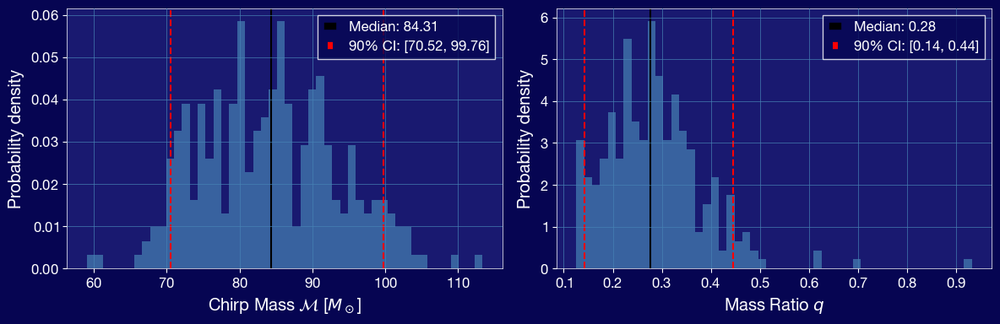

In [ ]:

# Calculate the 5%, 50%, 95% quantiles

# Mchirp
lower_bound_Mchirp = np.quantile(Mchirp, 0.05)
median_Mchirp = np.quantile(Mchirp, 0.50)
upper_bound_Mchirp = np.quantile(Mchirp, 0.95)
# q
lower_bound_q = np.quantile(q, 0.05)
median_q = np.quantile(q, 0.50)
upper_bound_q = np.quantile(q, 0.95)
# mass_1 
lower_bound_mass_1 = np.quantile(mass_1, 0.05)
median_mass_1 = np.quantile(mass_1, 0.50)
upper_bound_mass_1 = np.quantile(mass_1, 0.95)
# mass_2
lower_bound_mass_2 = np.quantile(mass_2, 0.05)
median_mass_2 = np.quantile(mass_2, 0.50)
upper_bound_mass_2 = np.quantile(mass_2, 0.95)
# mass_1_source
lower_bound_mass_1_source = np.quantile(mass_1_source, 0.05)
median_mass_1_source = np.quantile(mass_1_source, 0.50)
upper_bound_mass_1_source = np.quantile(mass_1_source, 0.95)
# mass_2_source
lower_bound_mass_2_source = np.quantile(mass_2_source, 0.05)
median_mass_2_source = np.quantile(mass_2_source, 0.50)
upper_bound_mass_2_source = np.quantile(mass_2_source, 0.95)
# total_mass_source
lower_bound_total_mass_source = np.quantile(total_mass_source, 0.05)
median_total_mass_source = np.quantile(total_mass_source, 0.50)
upper_bound_total_mass_source = np.quantile(total_mass_source, 0.95)
# H1_optimal_SNR
lower_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.05)
median_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.50)
upper_bound_H1_optimal_snr = np.quantile(H1_optimal_snr, 0.95)
# L1_optimal_SNR
lower_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.05)
median_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.50)
upper_bound_L1_optimal_snr = np.quantile(L1_optimal_snr, 0.95)

print(f"Chirp mass: {median_Mchirp:.2f} (+{upper_bound_Mchirp - median_Mchirp:.2f} / -{median_Mchirp - lower_bound_Mchirp:.2f}) M_sun")
print(f"Mass ratio: {median_q:.2f} (+{upper_bound_q - median_q:.2f} / -{median_q - lower_bound_q:.2f})")

# Plot histograms
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(Mchirp, bins=50, density=True, color='steelblue', alpha=0.7)
axes[0].axvline(median_Mchirp, color='k', linestyle='-', label=f'Median: {median_Mchirp:.2f}')
axes[0].axvline(lower_bound_Mchirp, color='r', linestyle='--', label=f'90% CI: [{lower_bound_Mchirp:.2f}, {upper_bound_Mchirp:.2f}]')
axes[0].axvline(upper_bound_Mchirp, color='r', linestyle='--')
axes[0].set_xlabel(r'Chirp Mass $\mathcal{M}$ [$M_\odot$]')
axes[0].set_ylabel('Probability density')
axes[0].legend()

axes[1].hist(q, bins=50, density=True, color='steelblue', alpha=0.7)
axes[1].axvline(median_q, color='k', linestyle='-', label=f'Median: {median_q:.2f}')
axes[1].axvline(lower_bound_q, color='r', linestyle='--', label=f'90% CI: [{lower_bound_q:.2f}, {upper_bound_q:.2f}]')
axes[1].axvline(upper_bound_q, color='r', linestyle='--')
axes[1].set_xlabel(r'Mass Ratio $q$')
axes[1].set_ylabel('Probability density')
axes[1].legend()



plt.tight_layout()
plt.show()

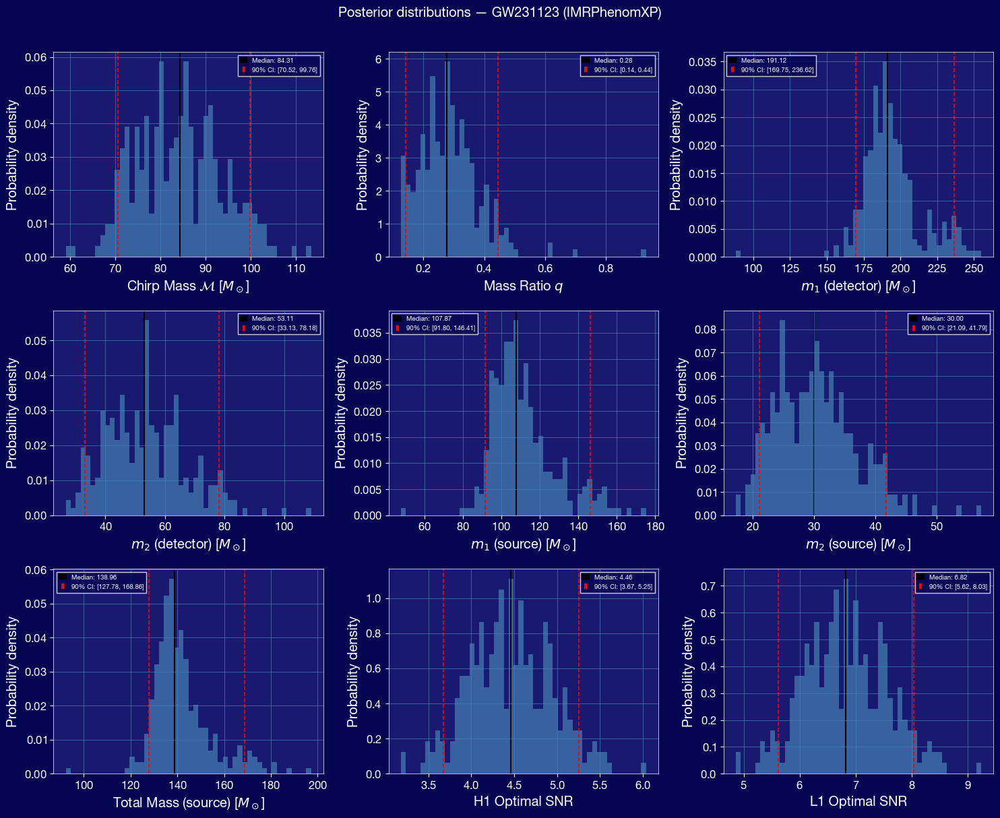

In [79]:
params = {
    r'Chirp Mass $\mathcal{M}$ [$M_\odot$]': (Mchirp, lower_bound_Mchirp, median_Mchirp, upper_bound_Mchirp),
    r'Mass Ratio $q$': (q, lower_bound_q, median_q, upper_bound_q),
    r'$m_1$ (detector) [$M_\odot$]': (mass_1, lower_bound_mass_1, median_mass_1, upper_bound_mass_1),
    r'$m_2$ (detector) [$M_\odot$]': (mass_2, lower_bound_mass_2, median_mass_2, upper_bound_mass_2),
    r'$m_1$ (source) [$M_\odot$]': (mass_1_source, lower_bound_mass_1_source, median_mass_1_source, upper_bound_mass_1_source),
    r'$m_2$ (source) [$M_\odot$]': (mass_2_source, lower_bound_mass_2_source, median_mass_2_source, upper_bound_mass_2_source),
    r'Total Mass (source) [$M_\odot$]': (total_mass_source, lower_bound_total_mass_source, median_total_mass_source, upper_bound_total_mass_source),
    r'H1 Optimal SNR': (H1_optimal_snr, lower_bound_H1_optimal_snr, median_H1_optimal_snr, upper_bound_H1_optimal_snr),
    r'L1 Optimal SNR': (L1_optimal_snr, lower_bound_L1_optimal_snr, median_L1_optimal_snr, upper_bound_L1_optimal_snr),
}

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for ax, (label, (data, lo, med, hi)) in zip(axes, params.items()):
    ax.hist(data, bins=50, density=True, color='steelblue', alpha=0.7)
    ax.axvline(med, color='k', linestyle='-', linewidth=1.5, label=f'Median: {med:.2f}')
    ax.axvline(lo, color='r', linestyle='--', linewidth=1.2)
    ax.axvline(hi, color='r', linestyle='--', linewidth=1.2, label=f'90% CI: [{lo:.2f}, {hi:.2f}]')
    ax.set_xlabel(label)
    ax.set_ylabel('Probability density')
    ax.legend(fontsize=7)

plt.suptitle('Posterior distributions — GW231123 (IMRPhenomXP)', y=1.01)
plt.tight_layout()
plt.show()

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/arviz/__init__.py:50: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


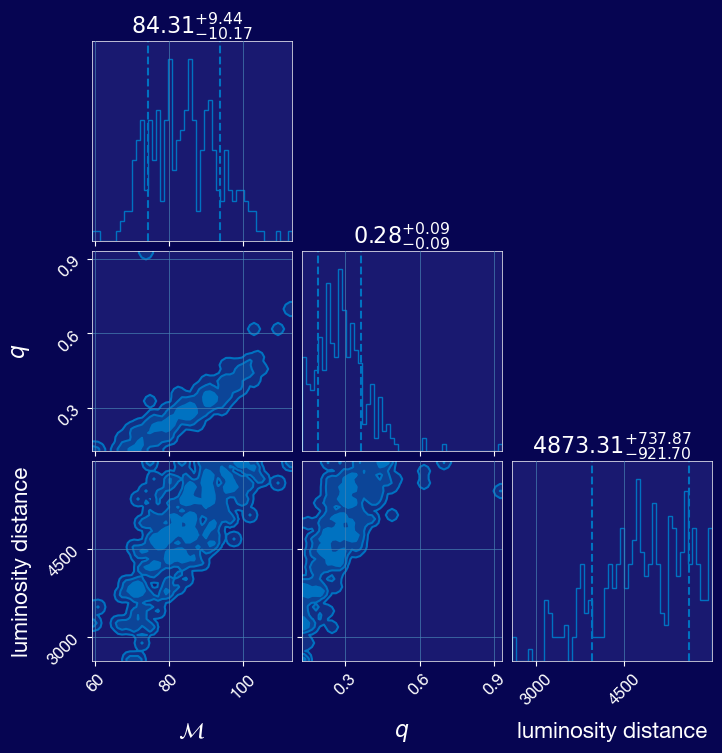

In [76]:
# 1D and 2D posteriors for the chirp mass and mass ratio.
result_short.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)


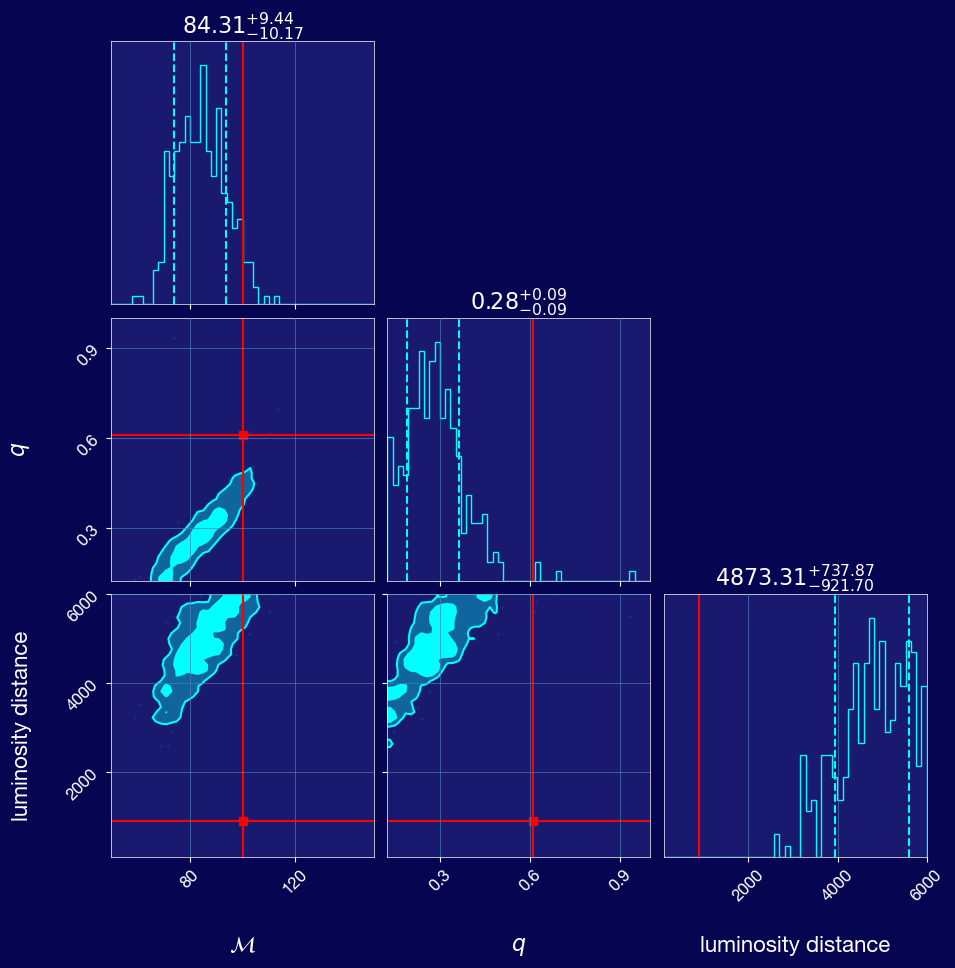

In [84]:
result_short.plot_corner(
    parameters=["chirp_mass", "mass_ratio", "luminosity_distance"],
    
    color='cyan',
    truth_color='red',
    
    range=[
        (50, 150),
        (0.125, 1),
        (100, 6000),
    ],
    
    levels=(0.5, 0.9),
    bins=50,
    prior=True,
    truths=[100.0, 0.61, 900.0],
    fig=plt.figure(figsize=(10, 10)),
)

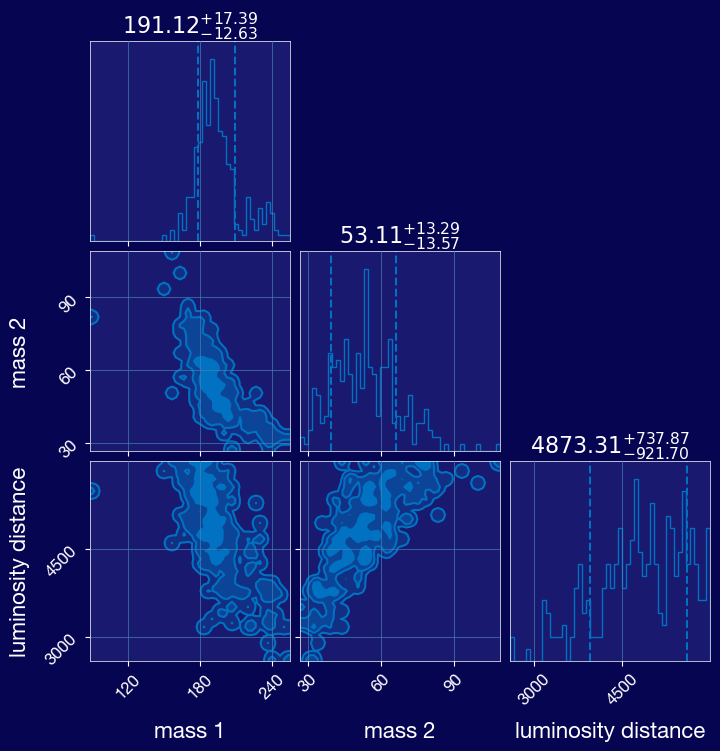

In [85]:
# 1D and 2D posteriors for the chirp mass and mass ratio.
result_short.plot_corner(parameters=["mass_1", "mass_2", "luminosity_distance"], prior=True)

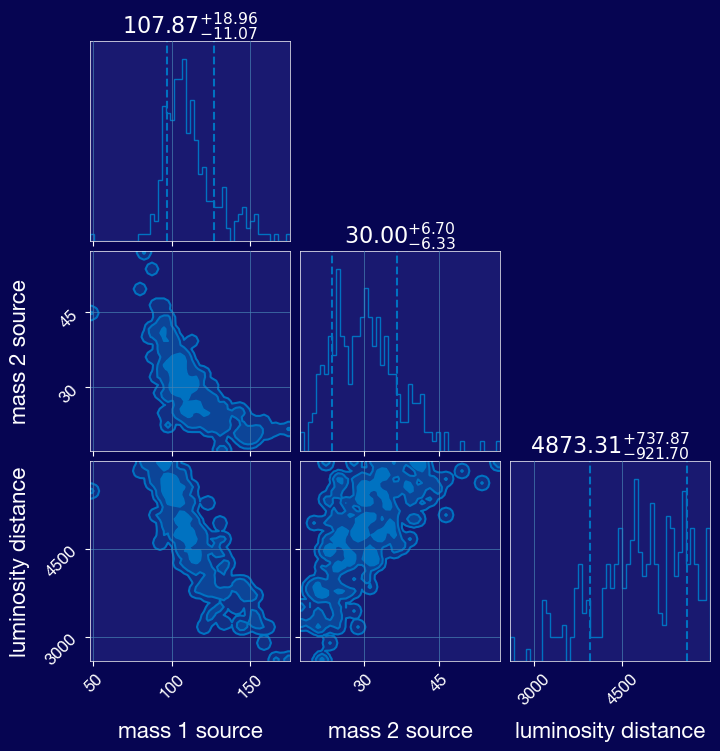

In [86]:
result_short.plot_corner(parameters=["mass_1_source", "mass_2_source", "luminosity_distance"], prior=True)

In [ ]:
# Let's get sampling!

# Next we need set up the waveform generator that can specify templates at a random point in parameter space
waveform_arguments = dict(
    waveform_approximant='IMRPhenomXP', 
    reference_frequency=100., 
    minimum_frequency=20,
    catch_waveform_errors=True)

waveform_generator = bilby.gw.WaveformGenerator(
    duration=duration,
    sampling_frequency=sampling_frequency,
    frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
    waveform_arguments=waveform_arguments,
    parameter_conversion=convert_to_lal_binary_black_hole_parameters
)
# approximant = 'IMRPhenomXP'
#  waveform_arguments = dict(
#         reference_frequency=10.0,
#         minimum_frequency=20,
#         waveform_approximant=approximant # so this becomes IMRPhenomXP
#         )
# Run the sampler and observe runtime, posterior width, etc.
result_short_nlive500_dlogz1 = bilby.run_sampler(
    likelihood,
    prior,
    sampler='dynesty',
    outdir='short',
    label="GW231123_135430",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=500,        # <-- Try 250 vs 500
    dlogz=1,        # <-- Try 1 vs 0.5
    clean=True,
)

# result_short_nlive250_dlogz0p5 = bilby.run_sampler(
#     likelihood,
#     prior,
#     sampler='dynesty',
#     outdir='short',
#     label="GW231123_135430",
#     conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
#     nlive=250,        # <-- Try 250 vs 500
#     dlogz=0.5,        # <-- Try 1 vs 0.5
#     clean=True,
# )

# result_short_nlive500_dlogz0p5 = bilby.run_sampler(
#     likelihood,
#     prior,
#     sampler='dynesty',
#     outdir='short',
#     label="GW231123_135430",
#     conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
#     nlive=500,        # <-- Try 250 vs 500
#     dlogz=0.5,        # <-- Try 1 vs 0.5
#     clean=True,
# )


1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/plotting.py:786: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0., max(y0) * 1.05])
/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/plotting.py:786: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0., max(y0) * 1.05])
/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
16:40 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/530 [00:00<?, ?it/s]

  0%|          | 0/530 [00:00<?, ?it/s]

  0%|          | 0/530 [00:00<?, ?it/s]

16:41 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


SamplingMarginalisedParameterError: Likelihood is geocent_time marginalized but you are trying to sample in geocent_time. 

In [96]:
result_short_nlive500_dlogz1.posterior.keys()

Index(['chirp_mass', 'mass_ratio', 'time_jitter', 'phase', 'a_1', 'a_2',
       'tilt_1', 'tilt_2', 'phi_12', 'phi_jl', 'dec', 'ra', 'theta_jn', 'psi',
       'luminosity_distance', 'geocent_time', 'log_likelihood', 'log_prior',
       'reference_frequency', 'waveform_approximant', 'minimum_frequency',
       'total_mass', 'mass_1', 'mass_2', 'H1_log_likelihood',
       'L1_log_likelihood', 'H1_matched_filter_snr', 'H1_optimal_snr',
       'L1_matched_filter_snr', 'L1_optimal_snr', 'symmetric_mass_ratio',
       'iota', 'spin_1x', 'spin_1y', 'spin_1z', 'spin_2x', 'spin_2y',
       'spin_2z', 'phi_1', 'phi_2', 'chi_eff', 'chi_1_in_plane',
       'chi_2_in_plane', 'chi_p', 'cos_tilt_1', 'cos_tilt_2', 'redshift',
       'comoving_distance', 'mass_1_source', 'mass_2_source',
       'chirp_mass_source', 'total_mass_source'],
      dtype='object')

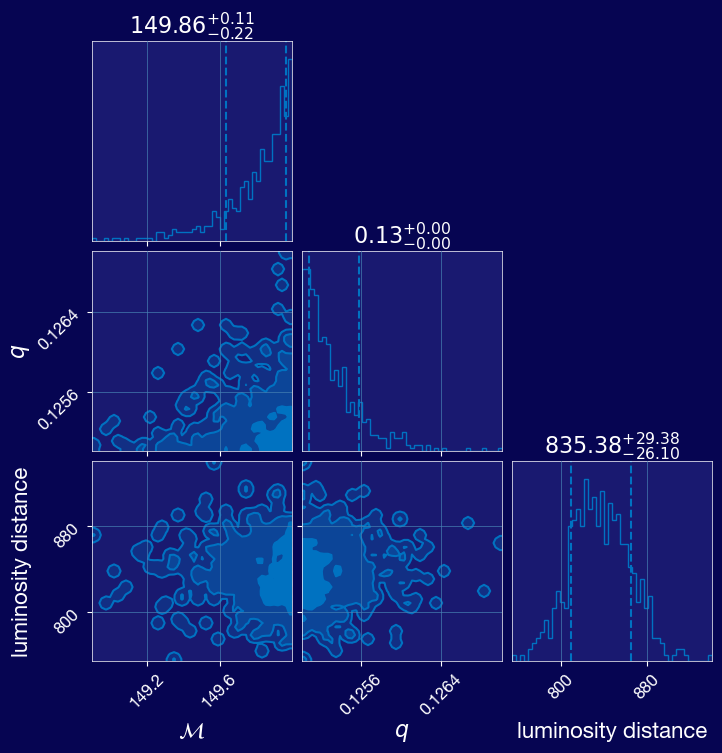

In [99]:
# 1D and 2D posteriors for the chirp mass and mass ratio.
result_short_nlive500_dlogz1.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

### NOTE: 
- mention in paper that we can't sample as widely for parameter estimation (this is not how it's usually done), since I'm only using the one approximant


In [ ]:
def make_prior():
    prior = bilby.core.prior.PriorDict()
    prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=50, maximum=150) # make these a bit tighter, 30% from the actual value
    prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=0.125, maximum=1) # same thing ^ 
    prior['a_1'] = 0.79 # also vary this as well IF i'm varying the tilt
    prior['a_2'] = 0.67 # do like 0.5 to 1 
    prior['tilt_1'] = 0.0 # do this uniform, runs from 0 to pi 
    prior['tilt_2'] = 0.0 # ^ same 
    prior['phi_12'] = 0.0 # keep 0
    prior['phi_jl'] = 0.0
    prior['dec'] = 0
    prior['ra'] = 0
    prior['theta_jn'] = 1.6
    prior['psi'] = 0
    prior['luminosity_distance'] = PowerLaw(
        alpha=2, name='luminosity_distance',
        minimum=100, maximum=6000,
        unit='Mpc', latex_label='$d_L$')
    return prior

def make_likelihood(prior):
    waveform_arguments = dict(
        waveform_approximant='IMRPhenomXP',
        reference_frequency=100.,
        minimum_frequency=20,
        catch_waveform_errors=True)
    waveform_generator = bilby.gw.WaveformGenerator(
        duration=duration,
        sampling_frequency=sampling_frequency,
        frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
        waveform_arguments=waveform_arguments,
        parameter_conversion=convert_to_lal_binary_black_hole_parameters)
    return bilby.gw.likelihood.GravitationalWaveTransient(
        [H1, L1], waveform_generator, priors=prior,
        time_marginalization=True,
        phase_marginalization=True,
        distance_marginalization=True)


prior_nlive250_dlogz0p5 = make_prior()
result_short_nlive250_dlogz0p5 = bilby.run_sampler(
    make_likelihood(prior_nlive250_dlogz0p5), prior_nlive250_dlogz0p5, sampler='dynesty',
    outdir='short', label="GW231123_135430",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=250, dlogz=0.5, clean=True)

prior_nlive500_dlogz0p5 = make_prior()
result_short_nlive500_dlogz0p5 = bilby.run_sampler(
    make_likelihood(prior_nlive500_dlogz0p5), prior_nlive500_dlogz0p5, sampler='dynesty',
    outdir='short', label="GW231123_135430",
    conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
    nlive=500, dlogz=0.5, clean=True)

16:50 bilby WARNING : Prior not provided for geocent_time, using the BBH default.
16:50 bilby WARNING : Prior not provided for phase, using the BBH default.


1it [00:00, ?it/s]

16:51 bilby WARNING : The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principal component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
16:51 bilby WARNING : Failed to create dynesty state plot at checkpoint
16:51 bilby WARNING : The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principal component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
16:51 bilby WARNING : Failed to create dynesty unit state plot at checkpoint
16:51 bilby WARNING : The data appears to lie in a lower-dimensional subspace of the space in whi

  0%|          | 0/510 [00:00<?, ?it/s]

  0%|          | 0/510 [00:00<?, ?it/s]

  0%|          | 0/510 [00:00<?, ?it/s]

16:59 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 
16:59 bilby WARNING : Prior not provided for geocent_time, using the BBH default.
16:59 bilby WARNING : Prior not provided for phase, using the BBH default.


1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
17:17 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/1072 [00:00<?, ?it/s]

  0%|          | 0/1072 [00:00<?, ?it/s]

  0%|          | 0/1072 [00:00<?, ?it/s]

17:19 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


^ That took 28 minutes. 

nlive = 500, dlogz = 1


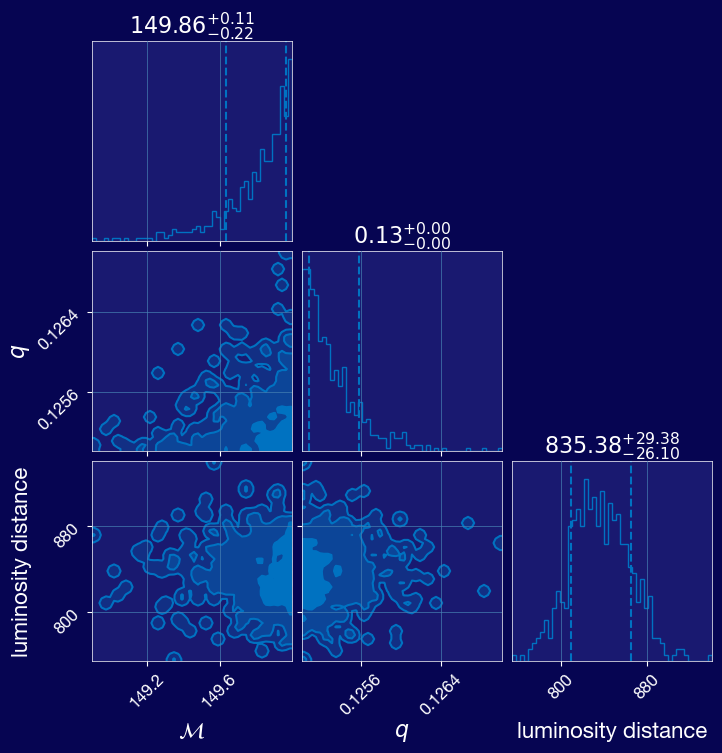

In [107]:
print('nlive = 500, dlogz = 1')
result_short_nlive500_dlogz1.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

nlive = 500, dlogz = 0.5


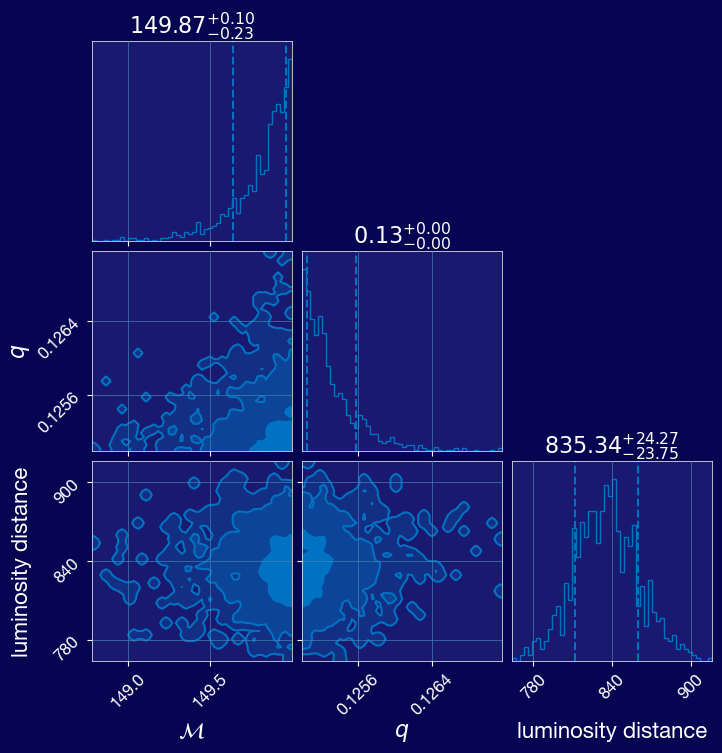

In [108]:
print('nlive = 500, dlogz = 0.5')
result_short_nlive500_dlogz0p5.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

nlive = 250, dlogz = 0.5


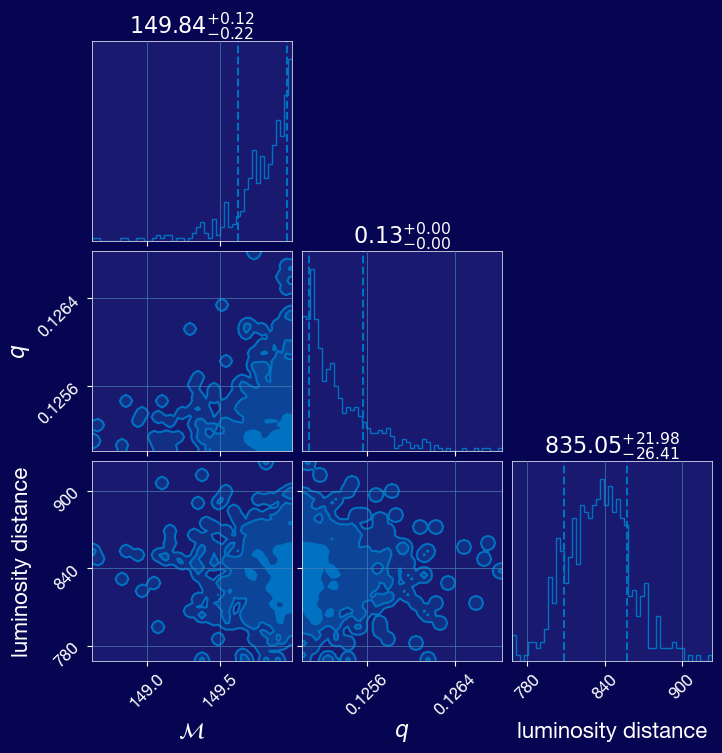

In [109]:
print('nlive = 250, dlogz = 0.5')
result_short_nlive250_dlogz0p5.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

nlive = 250, dlogz=1


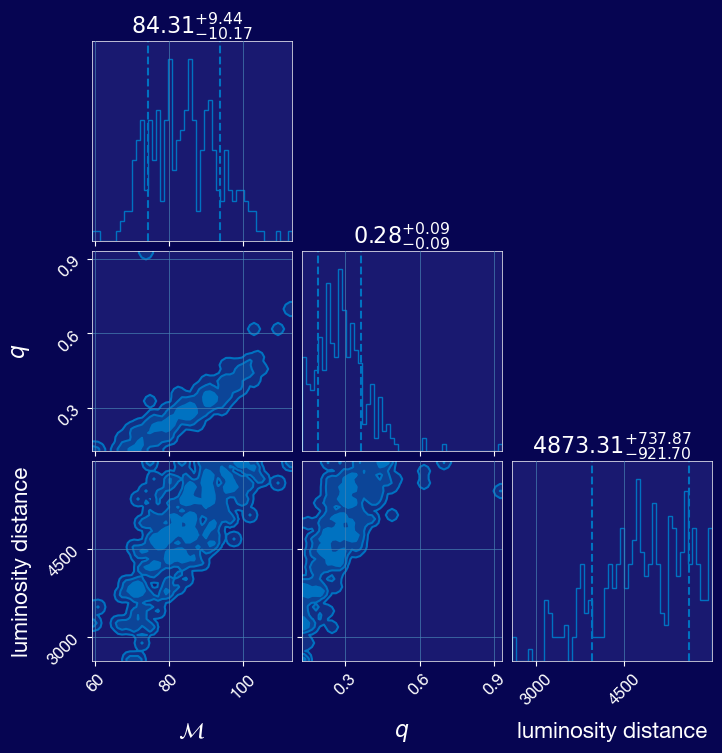

In [110]:
print('nlive = 250, dlogz=1')
result_short.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

#### Experimenting with new priors

In [ ]:
def perform_parameter_estimation(Mc_prior_min, Mc_prior_max, q_prior_min, L_d_prior_max, gps, nlive, dlogz):

    # -------------- PRIORS --------------
    prior = bilby.core.prior.PriorDict()
    prior = bilby.core.prior.PriorDict()
    # hard-coding these priors in, from the model
    prior['a_1'] =  0.79
    prior['a_2'] =  0.67
    prior['tilt_1'] =  0.0
    prior['tilt_2'] =  0.0
    prior['phi_12'] =  0.0
    prior['phi_jl'] =  0.0
    prior['dec'] =  0
    prior['ra'] =  0
    prior['theta_jn'] =  1.6
    prior['psi'] =  0
    prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
    prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
    prior['luminosity_distance'] = PowerLaw(alpha=2, 
                                            name='luminosity_distance', 
                                            minimum=100, 
                                            maximum=L_d_prior_max,    # in Mpc, covers the full range across all models
                                            unit='Mpc', 
                                            latex_label='$d_L$')
    # dependency priors
    prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=Mc_prior_min, maximum=Mc_prior_max)
    prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=q_prior_min, maximum=1)

    # -------------- LIKELIHOOD --------------

    # First, we set up the list of interferometers we want to include in the likelihood calculation
    interferometers = [H1, L1]
    # Next we need set up the waveform generator that can specify templates at a random point in parameter space
    waveform_arguments = dict(
        waveform_approximant='IMRPhenomXP', 
        reference_frequency=10., 
        minimum_frequency=20.,
        catch_waveform_errors=True) # changing this here to be consistent w matched filtering
    # We now create the waveform_generator object. This also takes care of converting between parameters etc.
    waveform_generator = bilby.gw.WaveformGenerator(
        frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
        waveform_arguments=waveform_arguments,
        parameter_conversion=convert_to_lal_binary_black_hole_parameters)
    # Finally, we create the likelihood using the GravitationalWaveTransient class
    likelihood = bilby.gw.likelihood.GravitationalWaveTransient(
        interferometers, waveform_generator, priors=prior,
        time_marginalization=True, phase_marginalization=True, distance_marginalization=True)
    
    # -------------- INFERENCE --------------
    result_short = bilby.run_sampler(likelihood,
                                     prior,
                                     sampler='dynesty',
                                     outdir='short',
                                     label="GW231123_135430",
                                     conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
                                     nlive=nlive,        # <-- Try 250 vs 500
                                     dlogz=dlogz,        # <-- Try 1 vs 0.5
                                     clean=True)
    
    # -------------- PLOTTING CORNER --------------


    result_short.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)
    
    return result_short
    

In [115]:
result_Mc250_qlow = perform_parameter_estimation(Mc_prior_min = 50, Mc_prior_max = 250, q_prior_min = 0.05, 
                                                 gps = gps, nlive = 500, dlogz = 1, plot_corner=True)

1it [00:00, ?it/s]

17:52 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/554 [00:00<?, ?it/s]

  0%|          | 0/554 [00:00<?, ?it/s]

  0%|          | 0/554 [00:00<?, ?it/s]

17:52 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


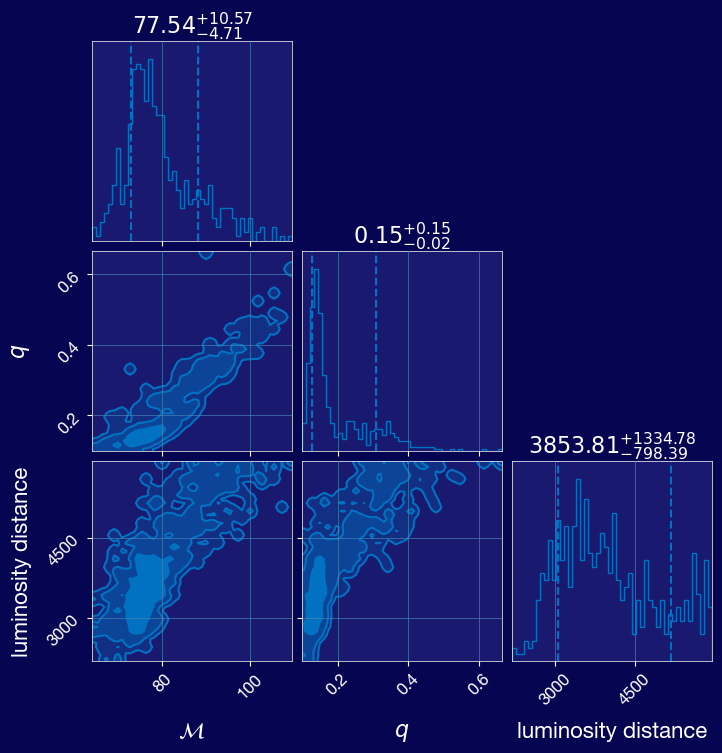

In [116]:
result_Mc250_qlow.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

This ^ was with max L_d prior of 6000. I'm now changing the function so that I can change that prior to be smaller. 

In [120]:
result_Mc250_qlow_smallerL_d = perform_parameter_estimation(Mc_prior_min = 50, Mc_prior_max = 250, q_prior_min = 0.05, L_d_prior_max=3000,
                                                            gps = gps, nlive = 500, dlogz = 1)

  0%|          | 0/400 [00:00<?, ?it/s]

1it [00:00, ?it/s]

/Users/leayamashiro/anaconda3/lib/python3.11/site-packages/dynesty/sampler.py:1082: UserWarning: The sampling was stopped short due to maxiter/maxcall limit the delta(log(z)) criterion is not achieved; posterior may be poorly sampled
  warnings.warn('The sampling was stopped short due to'
18:10 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/646 [00:00<?, ?it/s]

  0%|          | 0/646 [00:00<?, ?it/s]

  0%|          | 0/646 [00:00<?, ?it/s]

18:10 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


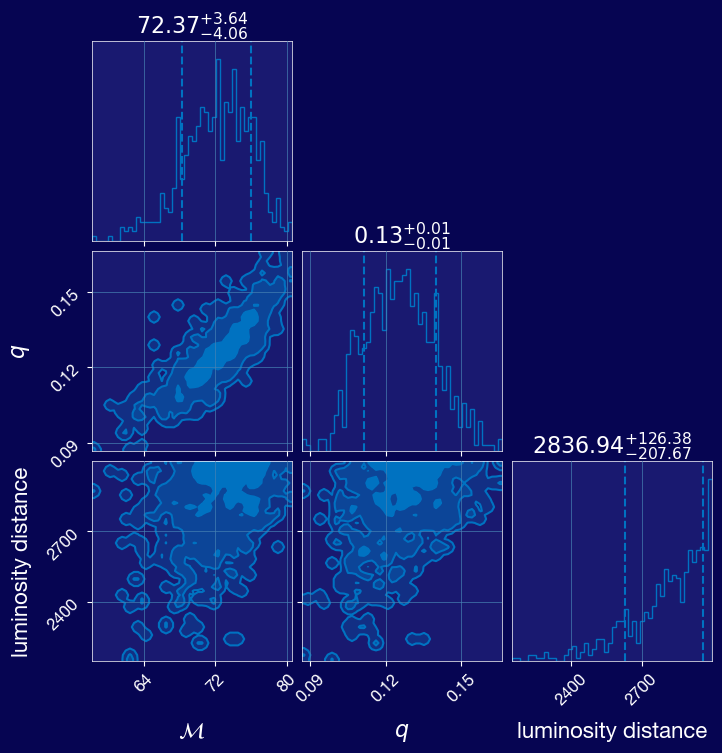

In [121]:
result_Mc250_qlow_smallerL_d.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

In [122]:
result_Mc250_qlow_smallerL_d = perform_parameter_estimation(Mc_prior_min = 80, Mc_prior_max = 175, q_prior_min = 0.2, L_d_prior_max=6000,
                                                            gps = gps, nlive = 500, dlogz = 1)

  0%|          | 0/400 [00:00<?, ?it/s]

1it [00:00, ?it/s]

18:19 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/647 [00:00<?, ?it/s]

  0%|          | 0/647 [00:00<?, ?it/s]

  0%|          | 0/647 [00:00<?, ?it/s]

18:20 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


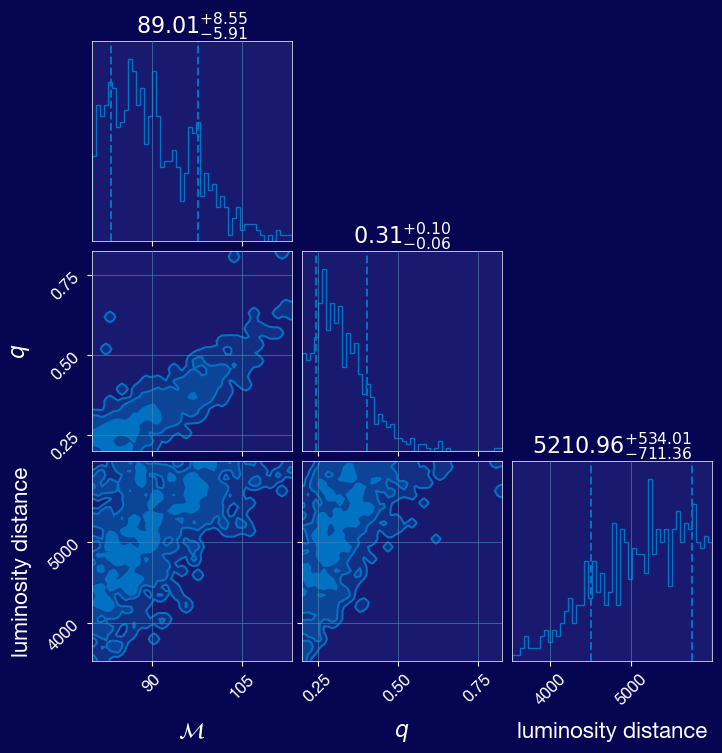

In [123]:
result_Mc250_qlow_smallerL_d.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

OKAY SO THESE GOT IT CLOSER: 
`Mc_prior_min = 80, Mc_prior_max = 175, q_prior_min = 0.2, L_d_prior_max=6000, gps = gps, nlive = 500, dlogz = 1` but only in the chirp mass and q parameter space. 
this came as a result of both re-relaxing the L_d prior (which doesn't look good because it's way too high for these values) and stiffening the prior on q (min)... 

In [124]:
# ONLY changing q_min to be higher to see what changes
result_again_higher_qminprior = perform_parameter_estimation(Mc_prior_min = 80, Mc_prior_max = 175, q_prior_min = 0.3, L_d_prior_max=6000,
                                                            gps = gps, nlive = 500, dlogz = 1)

1it [00:00, ?it/s]

18:31 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/582 [00:00<?, ?it/s]

  0%|          | 0/582 [00:00<?, ?it/s]

  0%|          | 0/582 [00:00<?, ?it/s]

18:31 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


In [127]:
def plot_corner_chirp_q(result): 
    return result.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)

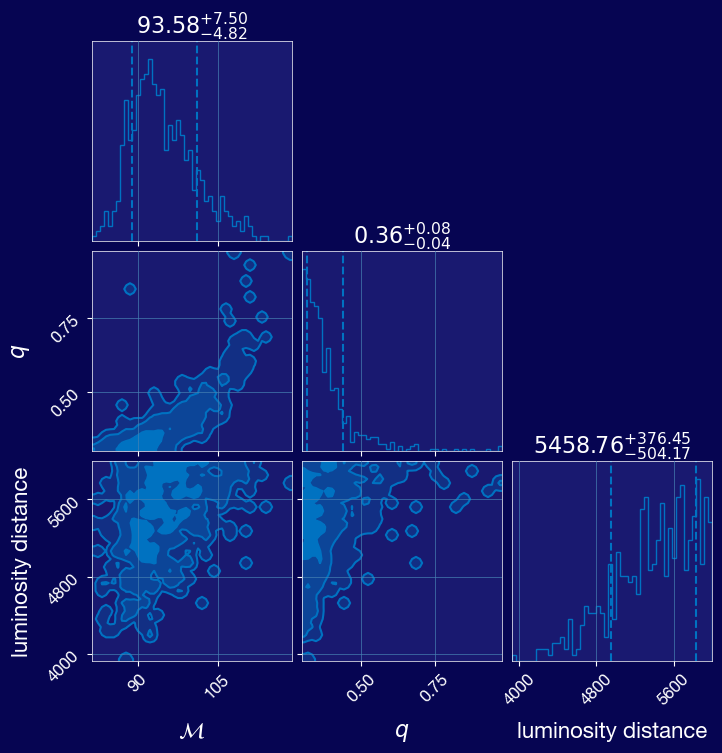

In [128]:
plot_corner_chirp_q(result_again_higher_qminprior)

In [129]:
def perform_parameter_estimation(Mc_prior_min, Mc_prior_max, q_prior_min, L_d_prior_max, gps, nlive, dlogz):

    # -------------- PRIORS --------------
    prior = bilby.core.prior.PriorDict()
    prior = bilby.core.prior.PriorDict()
    # hard-coding these priors in, from the model
    prior['a_1'] =  0.79
    prior['a_2'] =  0.67
    prior['tilt_1'] =  0.0
    prior['tilt_2'] =  0.0
    prior['phi_12'] =  0.0
    prior['phi_jl'] =  0.0
    prior['dec'] =  0
    prior['ra'] =  0
    prior['theta_jn'] =  1.6
    prior['psi'] =  0
    prior['phase'] = Uniform(name="phase", minimum=0, maximum=2*np.pi)
    prior['geocent_time'] = Uniform(name="geocent_time", minimum=gps-0.1, maximum=gps+0.1)
    prior['luminosity_distance'] = PowerLaw(alpha=2, 
                                            name='luminosity_distance', 
                                            minimum=100, 
                                            maximum=L_d_prior_max,    # in Mpc, covers the full range across all models
                                            unit='Mpc', 
                                            latex_label='$d_L$')
    # dependency priors
    prior['chirp_mass'] = Uniform(name='chirp_mass', minimum=Mc_prior_min, maximum=Mc_prior_max)
    prior['mass_ratio'] = Uniform(name='mass_ratio', minimum=q_prior_min, maximum=1)

    # -------------- LIKELIHOOD --------------

    # First, we set up the list of interferometers we want to include in the likelihood calculation
    interferometers = [H1, L1]
    # Next we need set up the waveform generator that can specify templates at a random point in parameter space
    waveform_arguments = dict(
        waveform_approximant='IMRPhenomXP', 
        reference_frequency=10., 
        minimum_frequency=20.,
        catch_waveform_errors=True) # changing this here to be consistent w matched filtering
    # We now create the waveform_generator object. This also takes care of converting between parameters etc.
    waveform_generator = bilby.gw.WaveformGenerator(
        frequency_domain_source_model=bilby.gw.source.lal_binary_black_hole,
        waveform_arguments=waveform_arguments,
        parameter_conversion=convert_to_lal_binary_black_hole_parameters)
    # Finally, we create the likelihood using the GravitationalWaveTransient class
    likelihood = bilby.gw.likelihood.GravitationalWaveTransient(
        interferometers, waveform_generator, priors=prior,
        time_marginalization=True, phase_marginalization=True, distance_marginalization=True)
    
    # -------------- INFERENCE --------------
    result_short = bilby.run_sampler(likelihood,
                                     prior,
                                     sampler='dynesty',
                                     outdir='short',
                                     label="GW231123_135430",
                                     conversion_function=bilby.gw.conversion.generate_all_bbh_parameters,
                                     nlive=nlive,        # <-- Try 250 vs 500
                                     dlogz=dlogz,        # <-- Try 1 vs 0.5
                                     clean=True)
    
    # -------------- PLOTTING CORNER --------------


    corner_plot = result_short.plot_corner(parameters=["chirp_mass", "mass_ratio", "luminosity_distance"], prior=True)
    
    return result_short, corner_plot
    

In [130]:
# keep new qmin, constrain L_d 
result_again_higher_qminprior_lowerLd = perform_parameter_estimation(Mc_prior_min = 80, Mc_prior_max = 175, q_prior_min = 0.3, L_d_prior_max=2000,
                                                                     gps = gps, nlive = 500, dlogz = 1)

  0%|          | 0/400 [00:00<?, ?it/s]

1it [00:00, ?it/s]

18:42 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

18:42 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


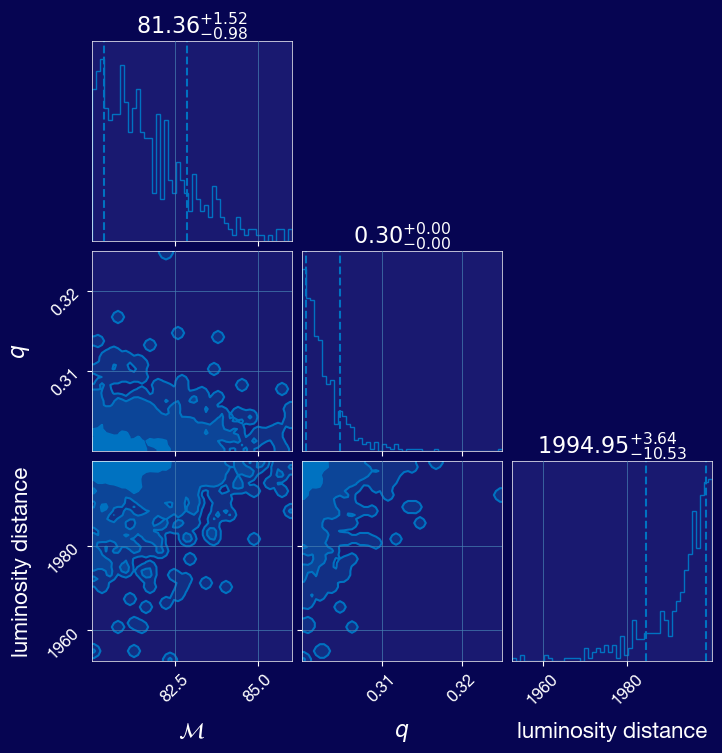

In [132]:
plot_corner_chirp_q(result_again_higher_qminprior_lowerLd[0])

In [134]:
# keep new qmin, constrain L_d 
result_again_higher_qminpriorLOW_mcPriorMax200 = perform_parameter_estimation(Mc_prior_min = 80, Mc_prior_max = 200, q_prior_min = 0.3, L_d_prior_max=2000,
                                                                     gps = gps, nlive = 500, dlogz = 1)

1it [00:00, ?it/s]

20:00 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/534 [00:00<?, ?it/s]

  0%|          | 0/534 [00:00<?, ?it/s]

  0%|          | 0/534 [00:00<?, ?it/s]

20:00 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


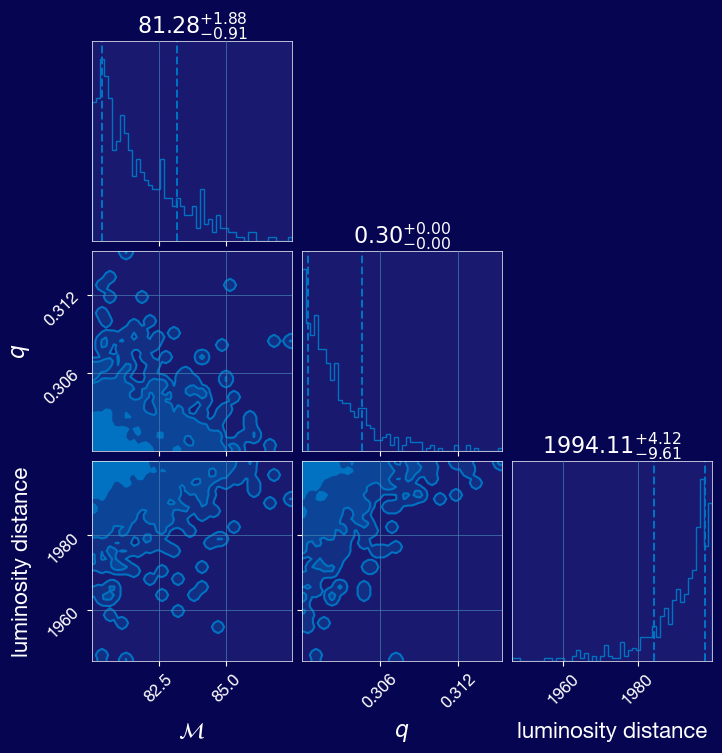

In [135]:
plot_corner_chirp_q(result_again_higher_qminpriorLOW_mcPriorMax200[0])

In [136]:
# keep new qmin, constrain L_d 
result_again_higher_qminprior0p1_mcPriorMax250_Ld2000 = perform_parameter_estimation(Mc_prior_min = 80, Mc_prior_max = 250, q_prior_min = 0.1, L_d_prior_max=2000,
                                                                                gps = gps, nlive = 500, dlogz = 1)

1it [00:00, ?it/s]

20:17 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

20:17 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


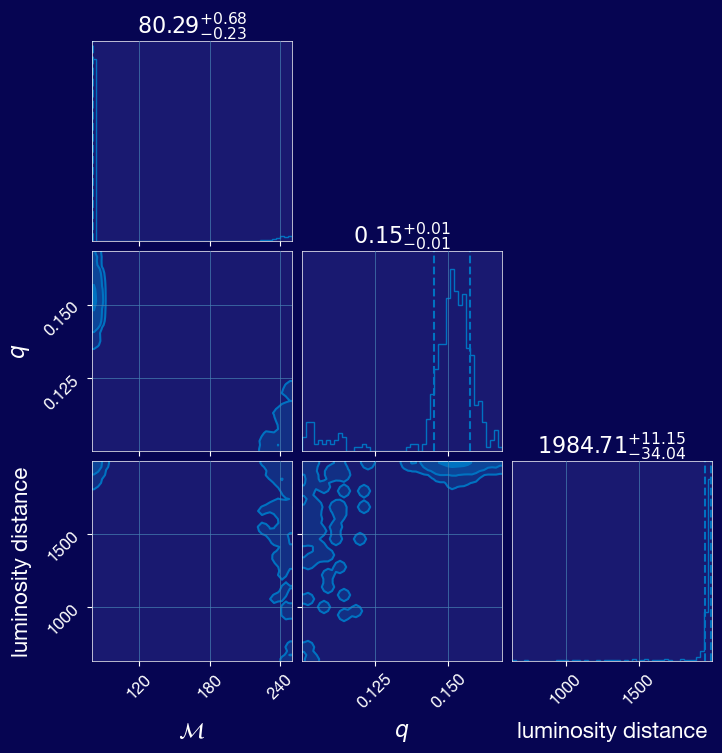

In [137]:
plot_corner_chirp_q(result_again_higher_qminprior0p1_mcPriorMax250_Ld2000[0])

In [138]:
# keep new qmin, constrain L_d 
result_again_higher_qminprior0p1_mcPriorMax250_Ld2000 = perform_parameter_estimation(Mc_prior_min = 50, Mc_prior_max = 250, q_prior_min = 0.01, L_d_prior_max=2000,
                                                                                gps = gps, nlive = 500, dlogz = 1)

1it [00:00, ?it/s]

(fCut = 19.1743 Hz) <= f_min = 20
f_max <= f_min
XLAL Error - IMRPhenomXPGenerateFD (LALSimIMRPhenomX.c:1968): minimum freq index 80 and maximum freq index 77 do not fulfill 0<=ind_min<=ind_max<=htilde->data>length=77.

XLAL Error - IMRPhenomXPGenerateFD (LALSimIMRPhenomX.c:1968): Input domain error
XLAL Error - XLALSimIMRPhenomXPGenerateFD (LALSimIMRPhenomX.c:1214): IMRPhenomXPGenerateFD failed to generate IMRPhenomX waveform.

XLAL Error - XLALSimIMRPhenomXPGenerateFD (LALSimIMRPhenomX.c:1214): Internal function call failed: Input domain error
XLAL Error - XLALSimInspiralChooseFDWaveform_legacy (LALSimInspiralGeneratorLegacy.c:2410): Internal function call failed: Input domain error
20:20 bilby WARNING : Evaluating the waveform failed with error: Internal function call failed: Input domain error
The parameters were {'mass_1': 6.239901070595572e+33, 'mass_2': 7.631692002858771e+31, 'spin_1': (0, 0, 0.79), 'spin_2': (0, 0, 0.67), 'luminosity_distance': 4.898411922384128e+25, 'iota': 1.

  0%|          | 0/649 [00:00<?, ?it/s]

  0%|          | 0/649 [00:00<?, ?it/s]

  0%|          | 0/649 [00:00<?, ?it/s]

20:28 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


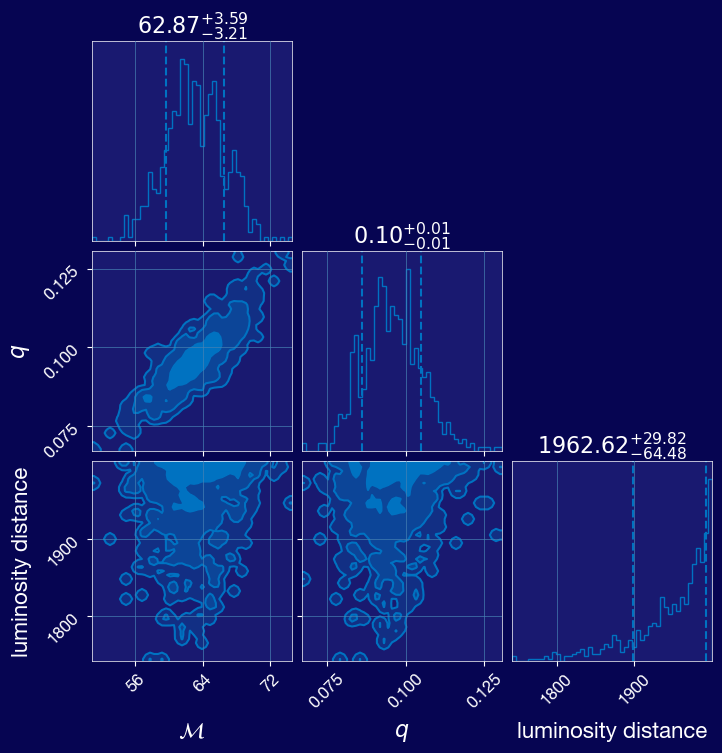

In [139]:
plot_corner_chirp_q(result_again_higher_qminprior0p1_mcPriorMax250_Ld2000[0])

In [141]:
# keep new qmin, constrain L_d 
result_again_higher_qminprior0p1_mcPriorMax250_Ld6000 = perform_parameter_estimation(Mc_prior_min = 50, Mc_prior_max = 250, q_prior_min = 0.05, L_d_prior_max=6000,
                                                                                    gps = gps, nlive = 500, dlogz = 1)

  0%|          | 0/400 [00:00<?, ?it/s]

1it [00:00, ?it/s]

20:41 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


  0%|          | 0/555 [00:00<?, ?it/s]

  0%|          | 0/555 [00:00<?, ?it/s]

  0%|          | 0/555 [00:00<?, ?it/s]

20:41 bilby WARNING : Result.save_to_file called with extension=True. This will default to json, and ignore the extension from the filename. This behaviour is deprecated and will be removed. 


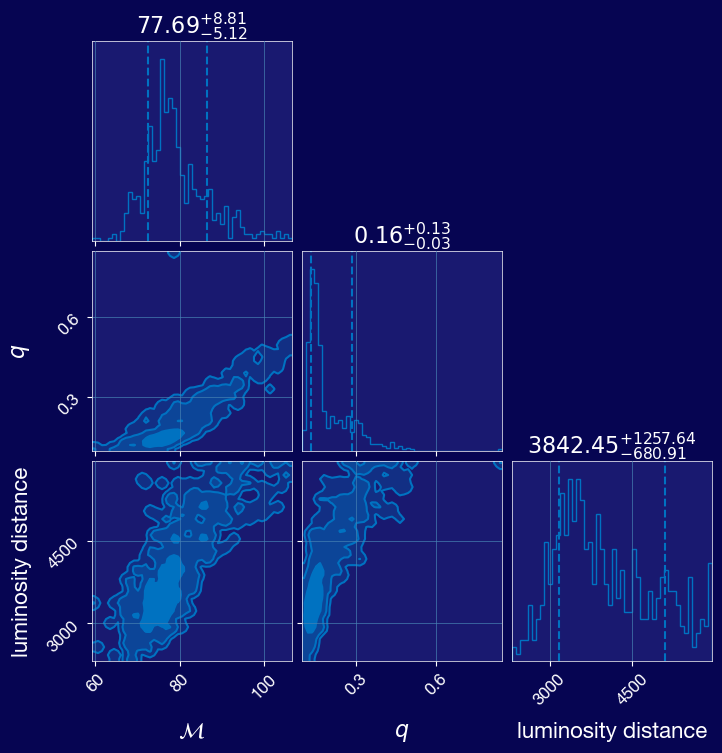

In [142]:
plot_corner_chirp_q(result_again_higher_qminprior0p1_mcPriorMax250_Ld6000[0])